In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
#model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 198s - loss: 2.3202e-04
Epoch 2/10
 - 190s - loss: 1.4289e-05
Epoch 3/10
 - 196s - loss: 9.9932e-06
Epoch 4/10
 - 194s - loss: 9.3540e-06
Epoch 5/10
 - 189s - loss: 8.7008e-06
Epoch 6/10
 - 193s - loss: 8.1789e-06
Epoch 7/10
 - 193s - loss: 7.9489e-06
Epoch 8/10
 - 189s - loss: 7.9067e-06
Epoch 9/10
 - 188s - loss: 7.7324e-06
Epoch 10/10
 - 187s - loss: 7.6915e-06


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.1802 RMSE


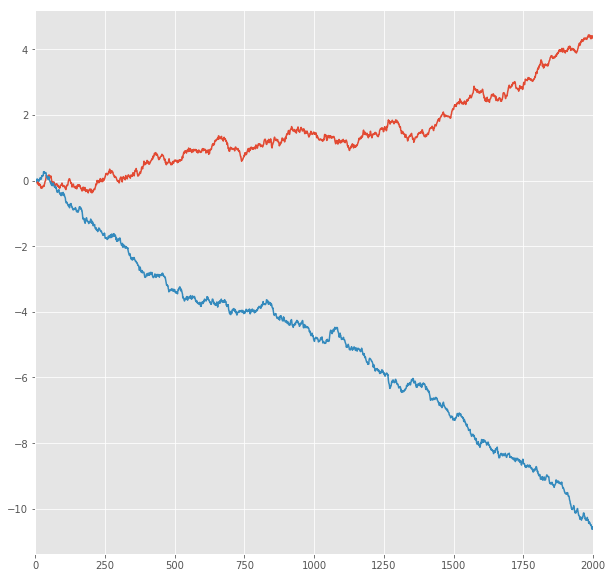

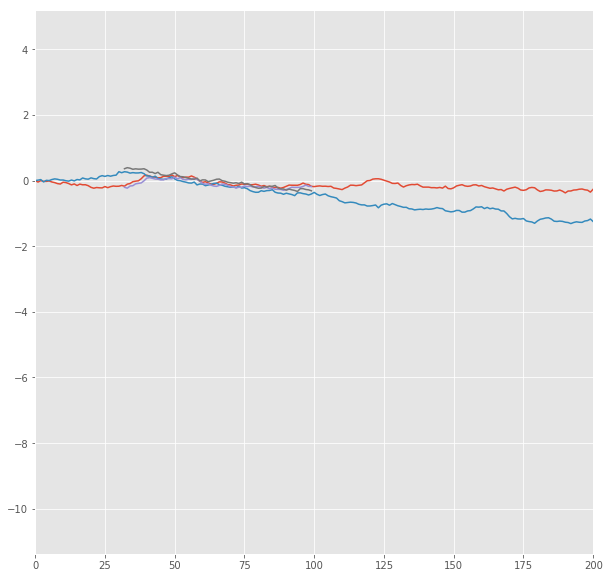

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.2323 RMSE
Predict Score for 1 -steps forecast: 0.2239 RMSE
Error Test Score for 1 -steps forecast: 0.0623 RMSE
RT Test Score for 1 -steps forecast: 0.0669 RMSE
Error Test Corr for 1 -steps forecast: 0.9929
RT Test Corr for 1 -steps forecast: 0.9869


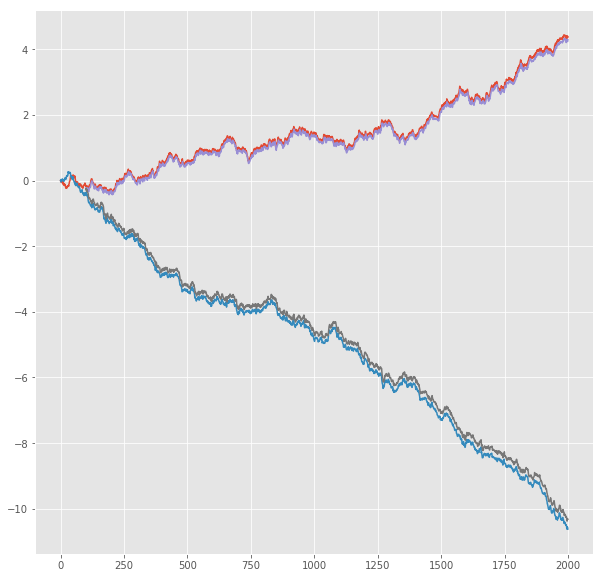

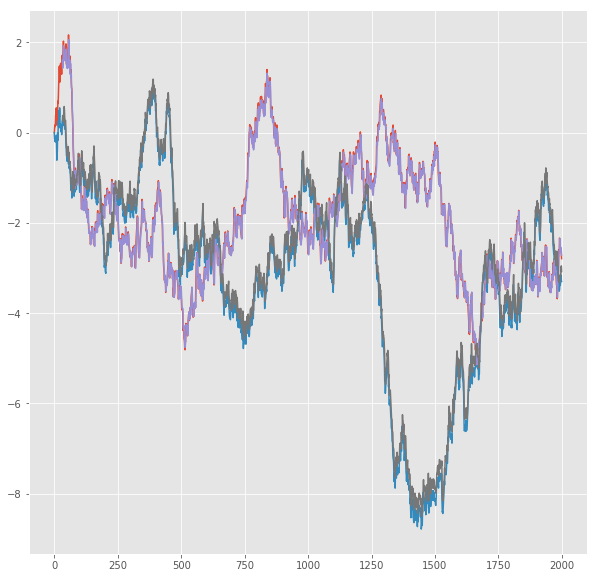

R^2 score for regression on Error: 0.9859
k = 0.9927


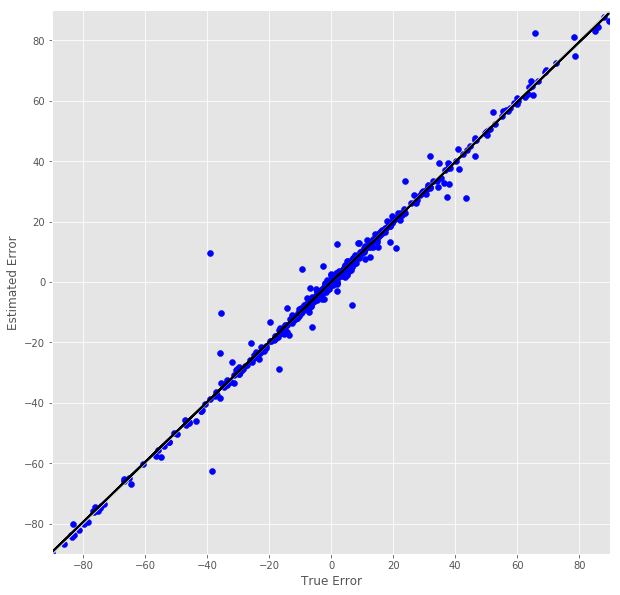

R^2 score for regression on RT: 0.9740
k = 0.9951


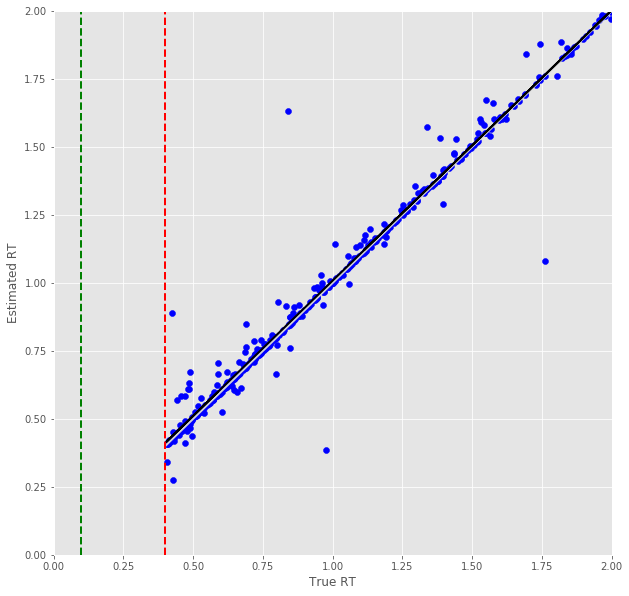

Error Prediction Score: 0.1119 RMSE
RT Prediction Score: 0.1318 RMSE
Error Prediction Corr: 0.9741
RT Prediction Corr: 0.9527
R^2 score for regression on Error: 0.9489
k = 0.9855


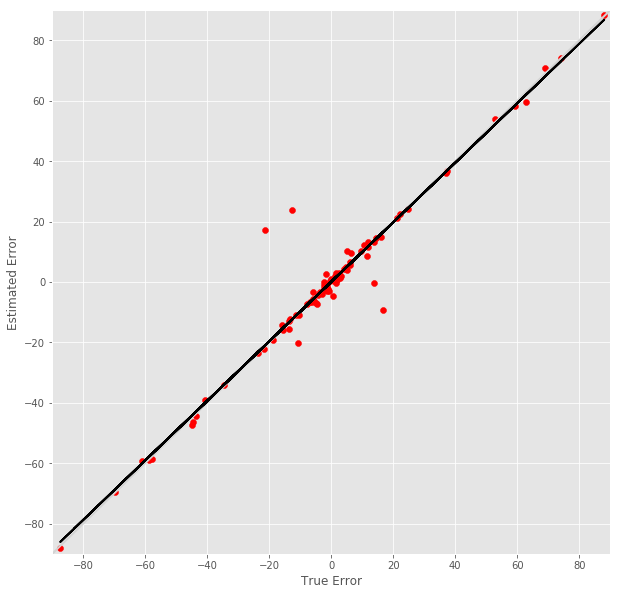

R^2 score for regression on RT: 0.9077
k = 0.9282


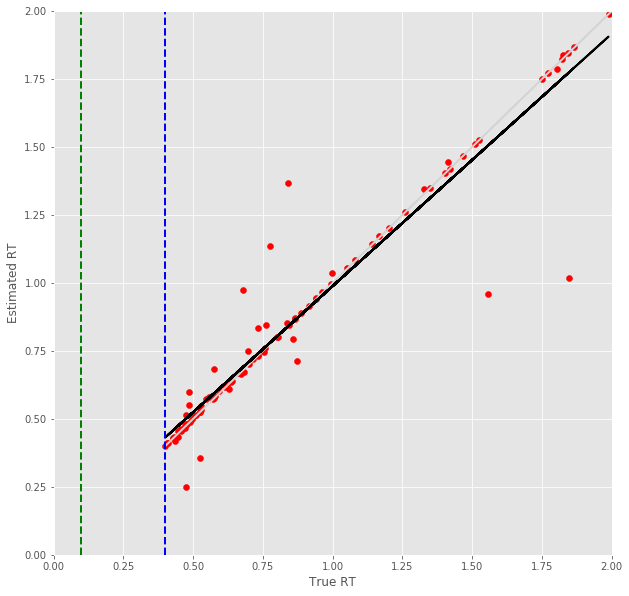

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.4053 RMSE
Predict Score for 2 -steps forecast: 0.3602 RMSE
Error Test Score for 2 -steps forecast: 0.0966 RMSE
RT Test Score for 2 -steps forecast: 0.1068 RMSE
Error Test Corr for 2 -steps forecast: 0.9832
RT Test Corr for 2 -steps forecast: 0.9671


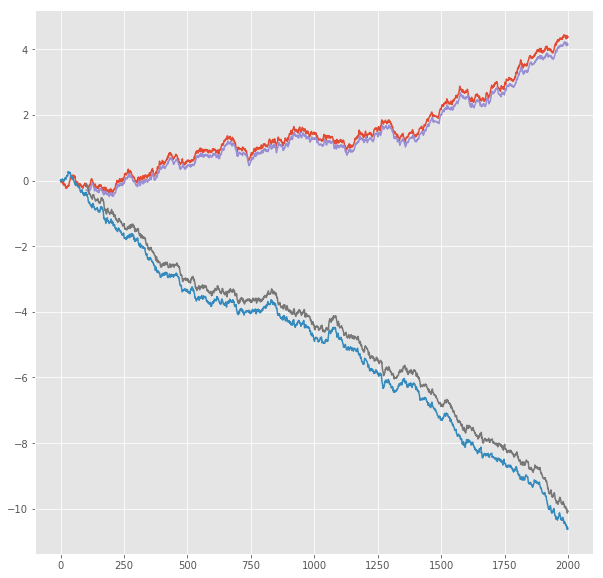

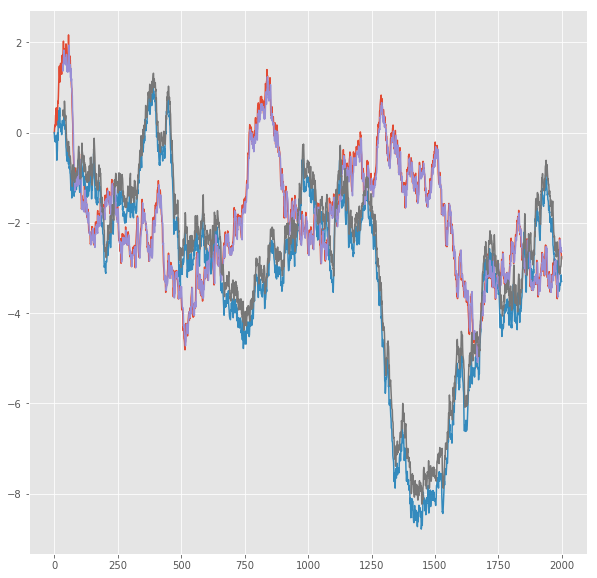

R^2 score for regression on Error: 0.9666
k = 0.9844


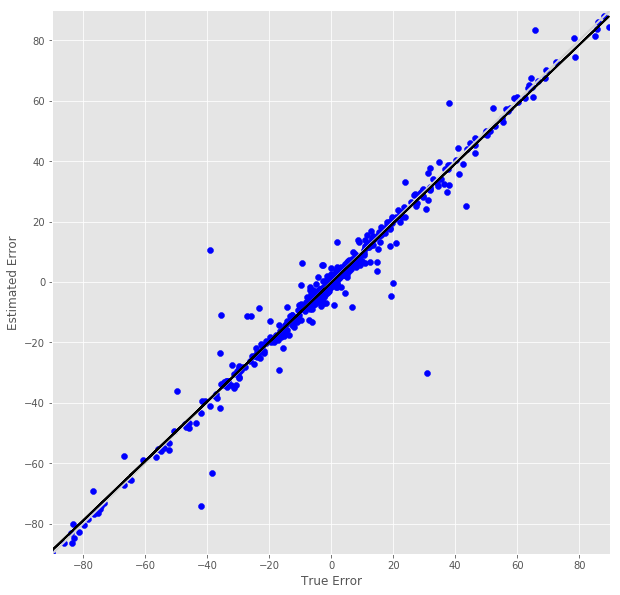

R^2 score for regression on RT: 0.9353
k = 0.9974


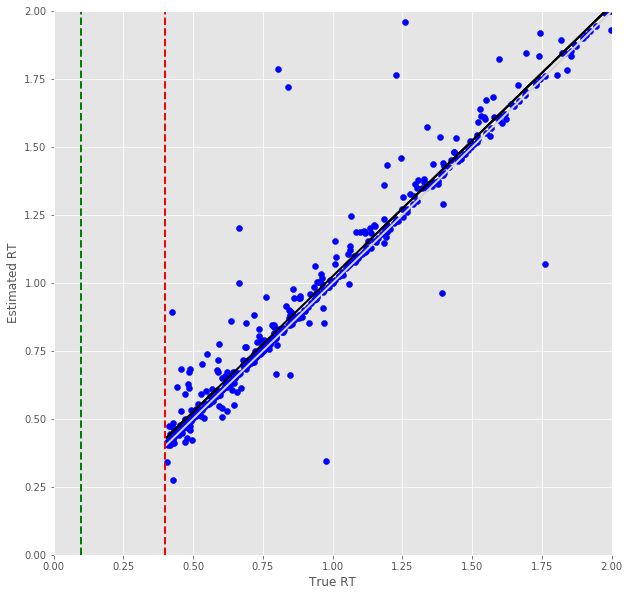

Error Prediction Score: 0.1543 RMSE
RT Prediction Score: 0.2085 RMSE
Error Prediction Corr: 0.9507
RT Prediction Corr: 0.8850
R^2 score for regression on Error: 0.9038
k = 0.9131


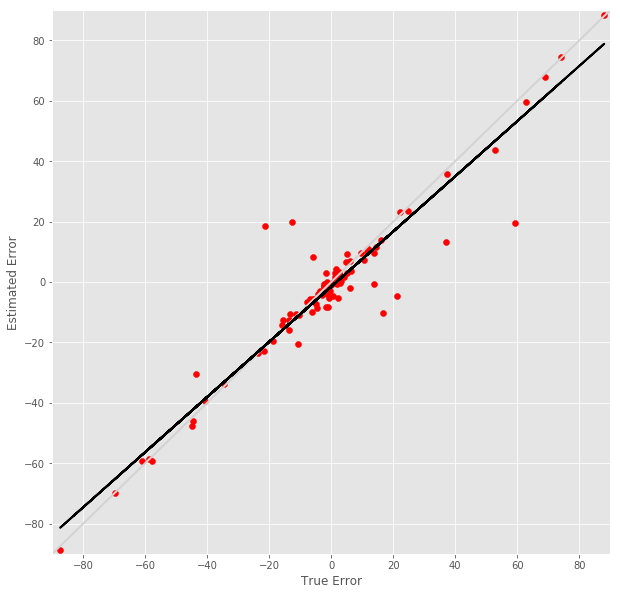

R^2 score for regression on RT: 0.7832
k = 0.8827


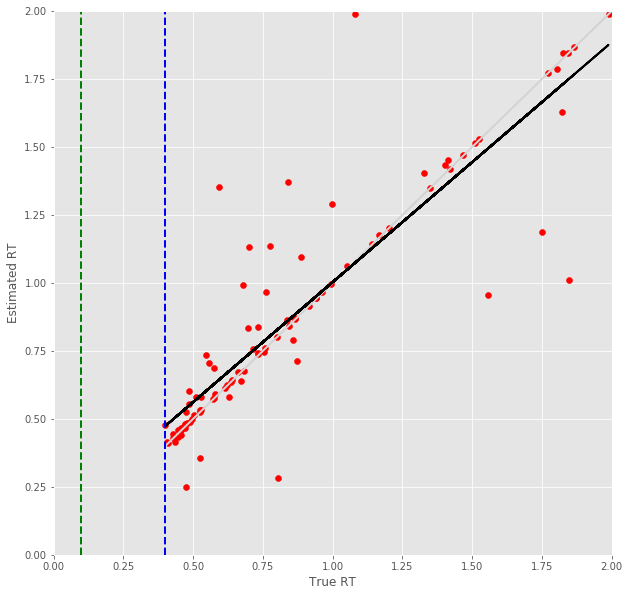

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.5695 RMSE
Predict Score for 3 -steps forecast: 0.4876 RMSE
Error Test Score for 3 -steps forecast: 0.1115 RMSE
RT Test Score for 3 -steps forecast: 0.1305 RMSE
Error Test Corr for 3 -steps forecast: 0.9775
RT Test Corr for 3 -steps forecast: 0.9519


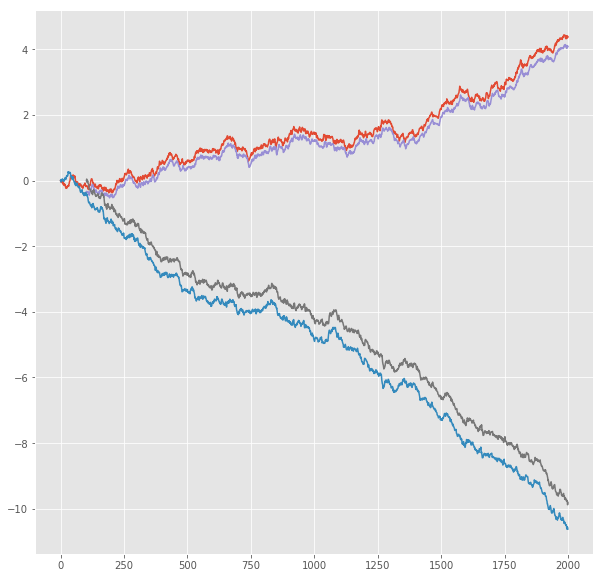

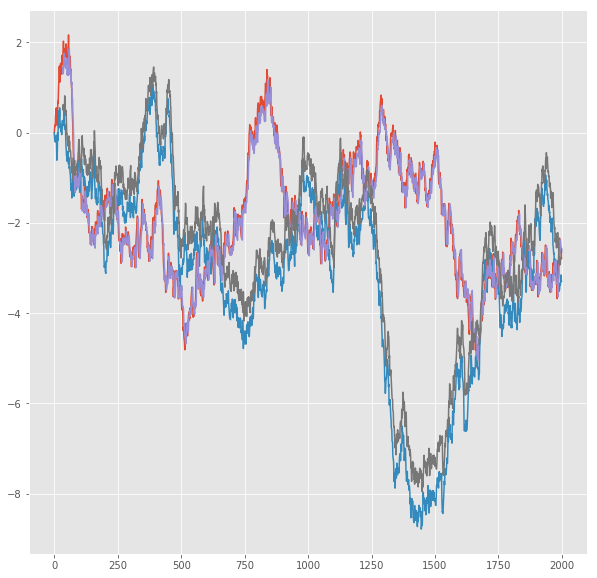

R^2 score for regression on Error: 0.9554
k = 0.9761


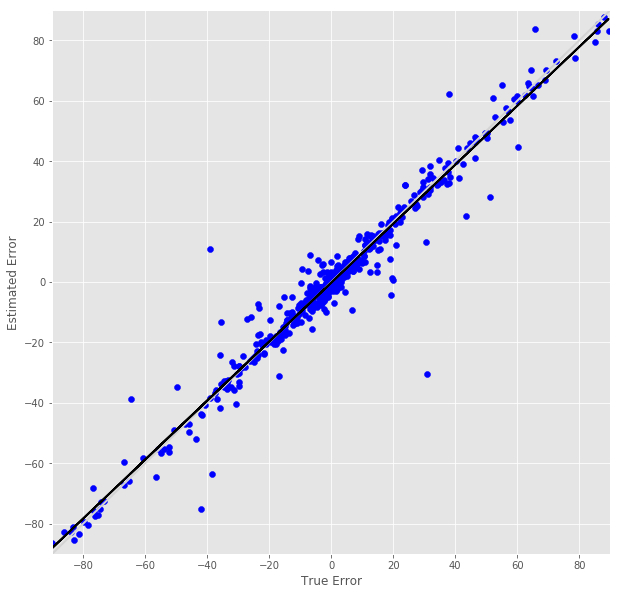

R^2 score for regression on RT: 0.9060
k = 1.0006


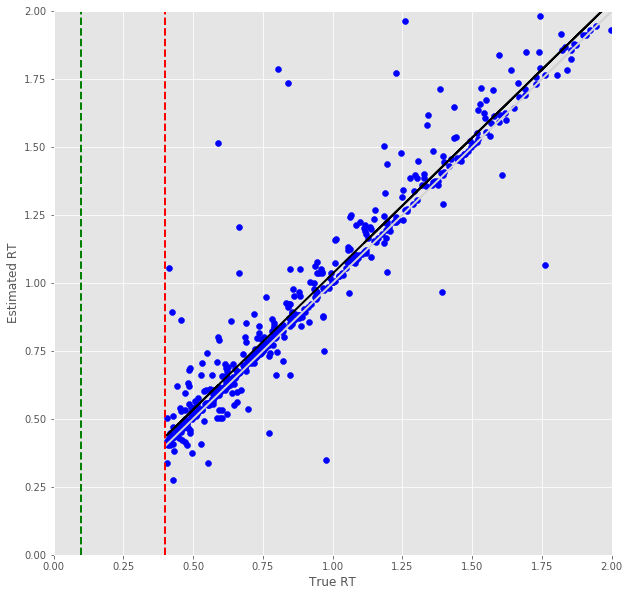

Error Prediction Score: 0.1781 RMSE
RT Prediction Score: 0.2328 RMSE
Error Prediction Corr: 0.9359
RT Prediction Corr: 0.8542
R^2 score for regression on Error: 0.8760
k = 0.9214


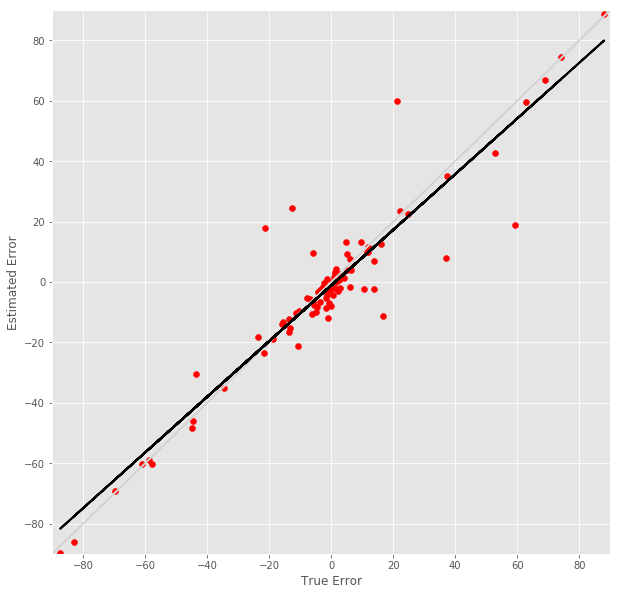

R^2 score for regression on RT: 0.7296
k = 0.8788


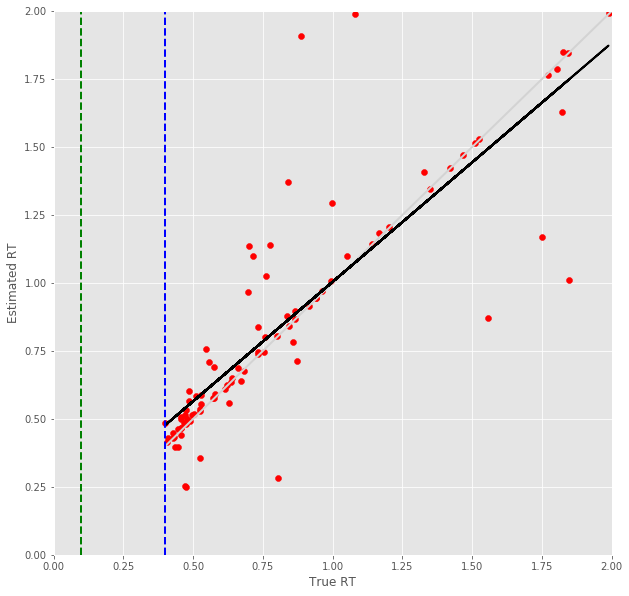

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.7293 RMSE
Predict Score for 4 -steps forecast: 0.6114 RMSE
Error Test Score for 4 -steps forecast: 0.1409 RMSE
RT Test Score for 4 -steps forecast: 0.1700 RMSE
Error Test Corr for 4 -steps forecast: 0.9649
RT Test Corr for 4 -steps forecast: 0.9162


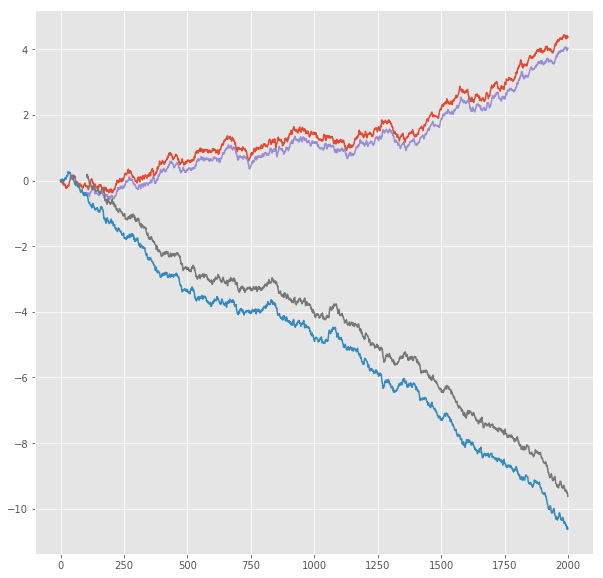

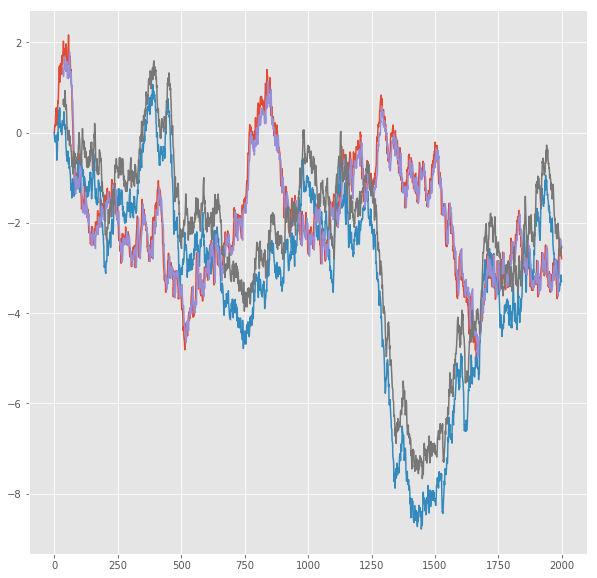

R^2 score for regression on Error: 0.9310
k = 0.9796


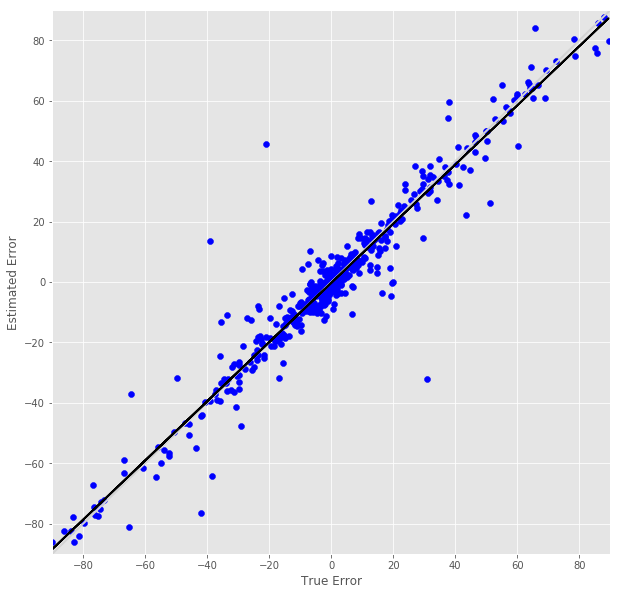

R^2 score for regression on RT: 0.8394
k = 0.9796


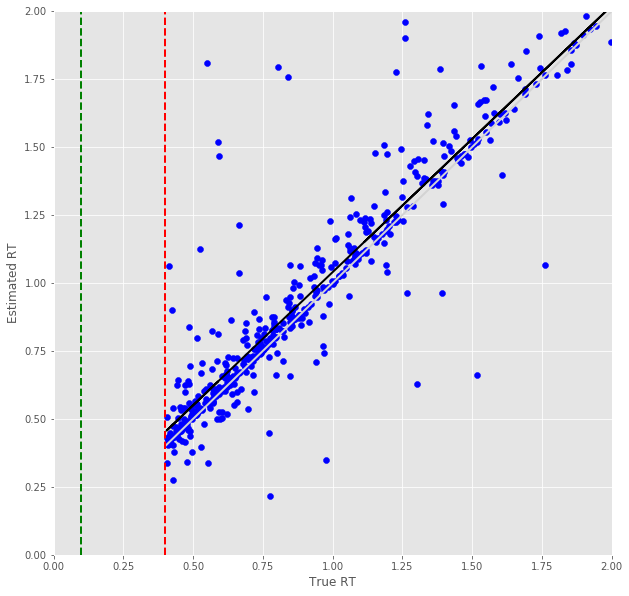

Error Prediction Score: 0.2487 RMSE
RT Prediction Score: 0.3225 RMSE
Error Prediction Corr: 0.8725
RT Prediction Corr: 0.7349
R^2 score for regression on Error: 0.7613
k = 0.8380


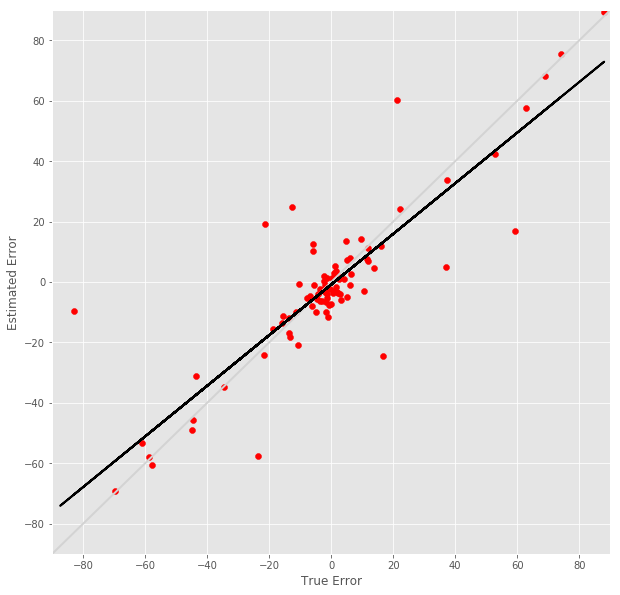

R^2 score for regression on RT: 0.5400
k = 0.8036


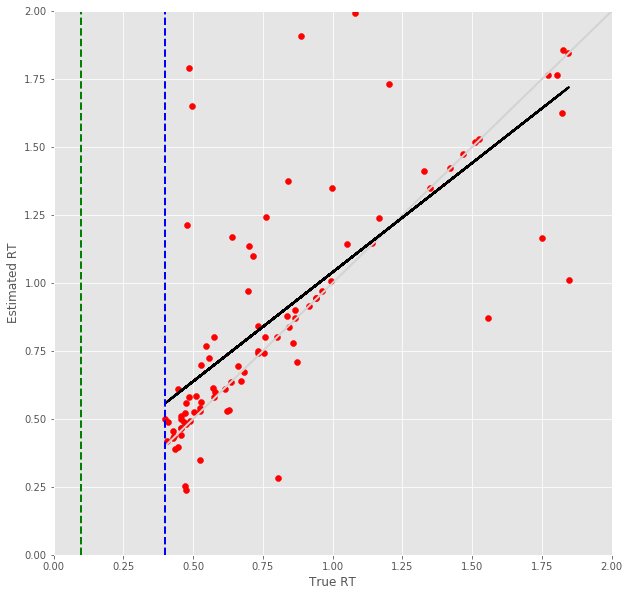

5 -step(s) forecast:
Test Score for 5 -steps forecast: 0.8858 RMSE
Predict Score for 5 -steps forecast: 0.7333 RMSE
Error Test Score for 5 -steps forecast: 0.1489 RMSE
RT Test Score for 5 -steps forecast: 0.1835 RMSE
Error Test Corr for 5 -steps forecast: 0.9609
RT Test Corr for 5 -steps forecast: 0.9035


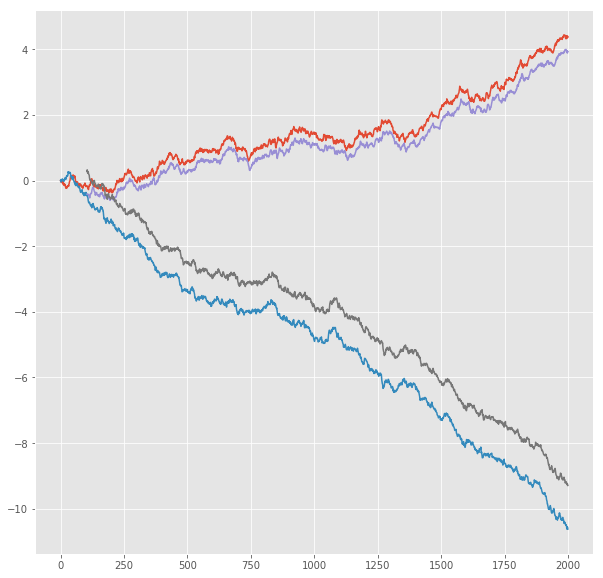

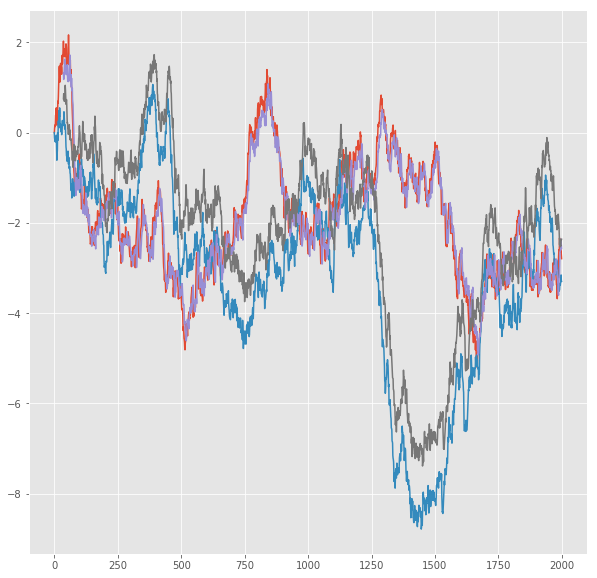

R^2 score for regression on Error: 0.9233
k = 0.9818


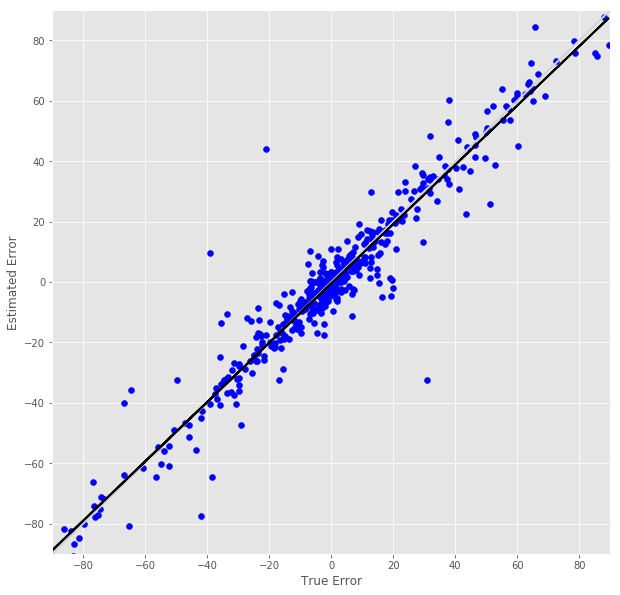

R^2 score for regression on RT: 0.8163
k = 0.9783


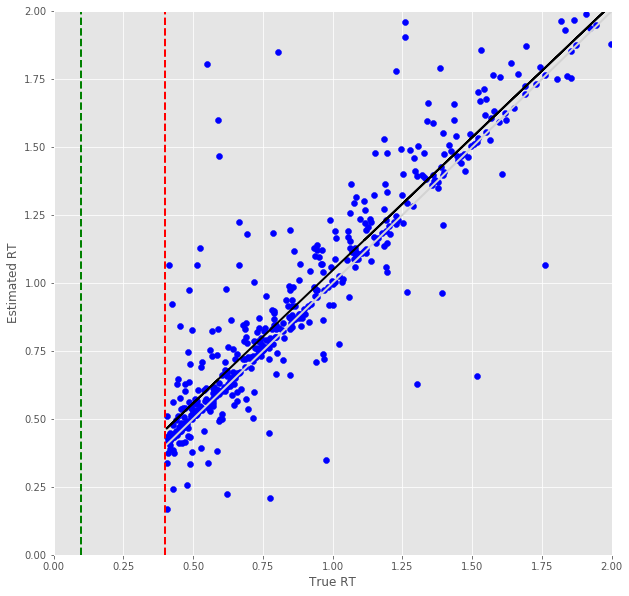

Error Prediction Score: 0.2769 RMSE
RT Prediction Score: 0.3403 RMSE
Error Prediction Corr: 0.8423
RT Prediction Corr: 0.6888
R^2 score for regression on Error: 0.7094
k = 0.8104


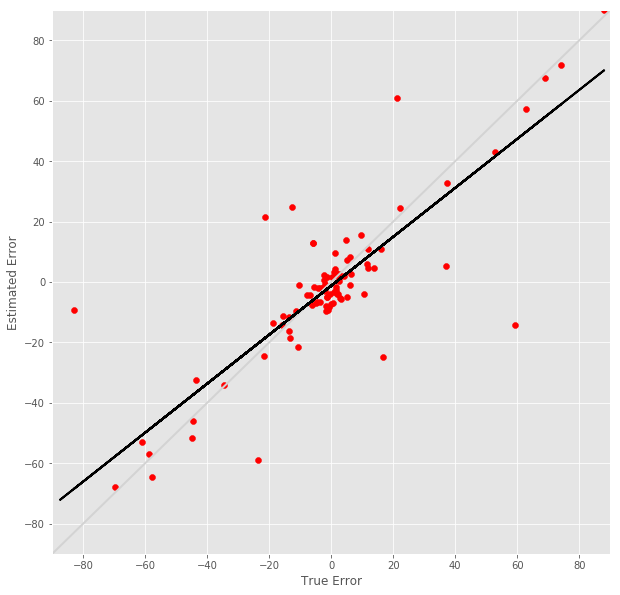

R^2 score for regression on RT: 0.4745
k = 0.7339


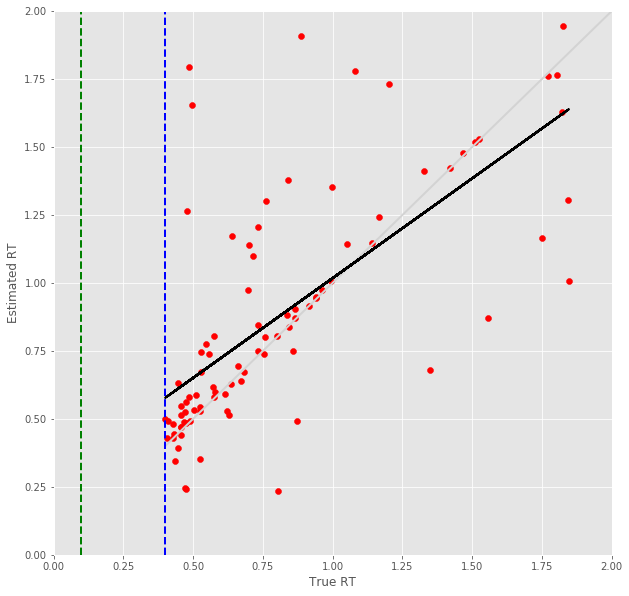

6 -step(s) forecast:
Test Score for 6 -steps forecast: 1.0388 RMSE
Predict Score for 6 -steps forecast: 0.8538 RMSE
Error Test Score for 6 -steps forecast: 0.1734 RMSE
RT Test Score for 6 -steps forecast: 0.2127 RMSE
Error Test Corr for 6 -steps forecast: 0.9473
RT Test Corr for 6 -steps forecast: 0.8740


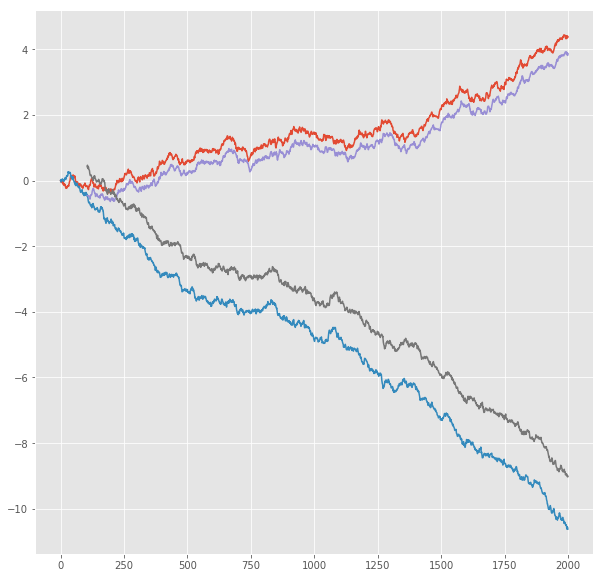

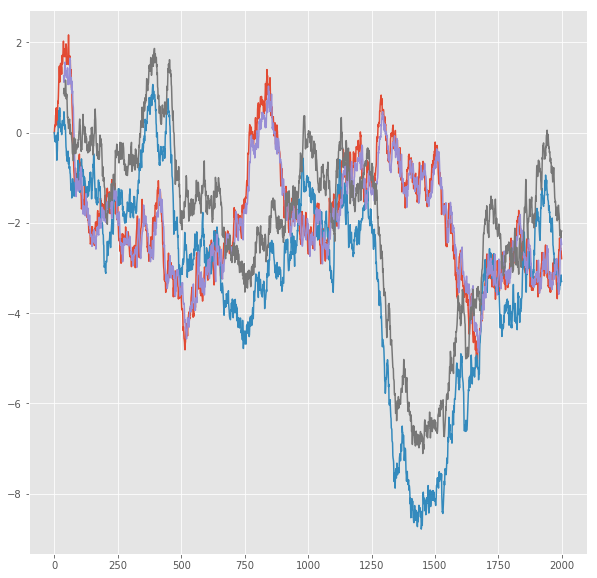

R^2 score for regression on Error: 0.8974
k = 0.9720


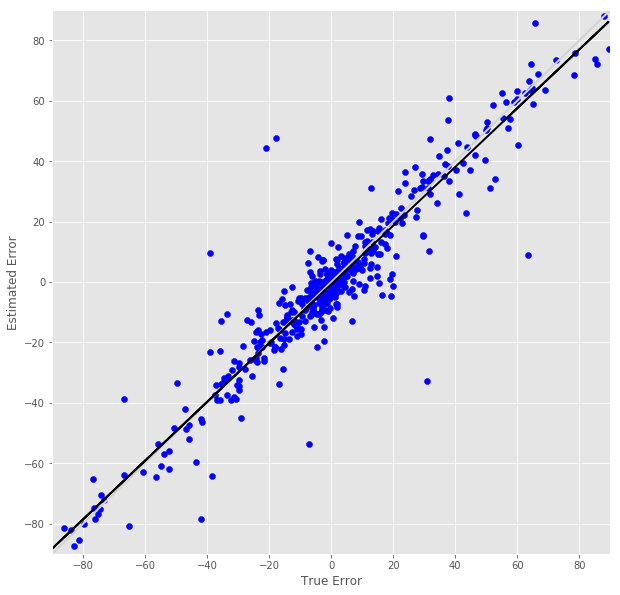

R^2 score for regression on RT: 0.7639
k = 0.9711


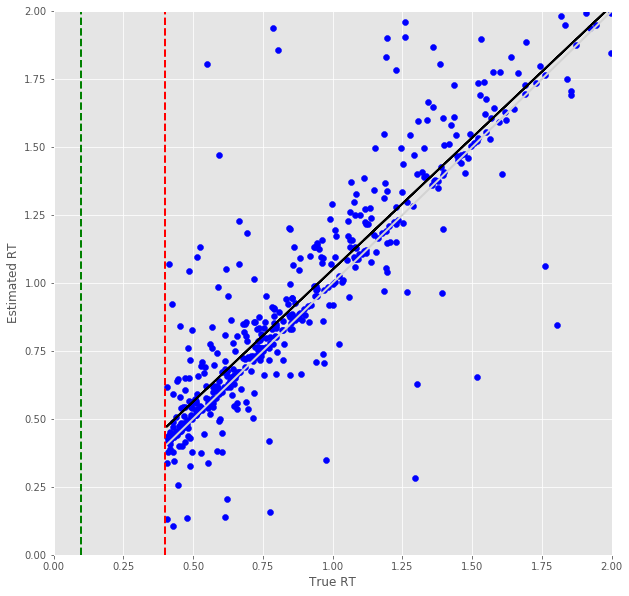

Error Prediction Score: 0.3285 RMSE
RT Prediction Score: 0.4033 RMSE
Error Prediction Corr: 0.8070
RT Prediction Corr: 0.5715
R^2 score for regression on Error: 0.6512
k = 0.8538


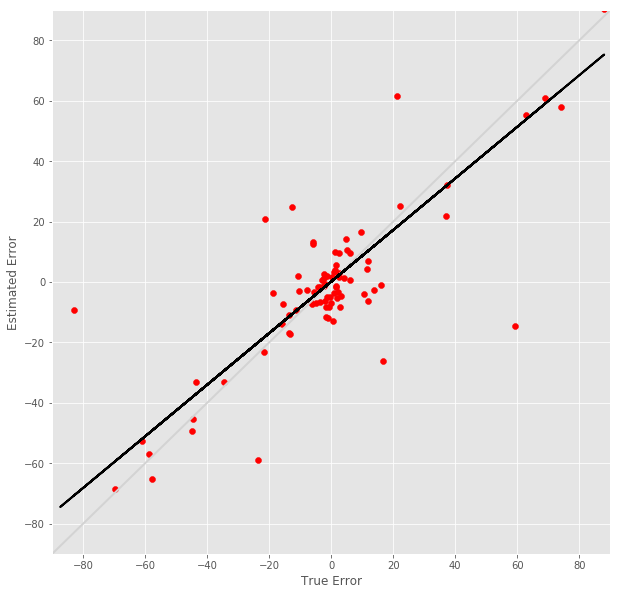

R^2 score for regression on RT: 0.3267
k = 0.6199


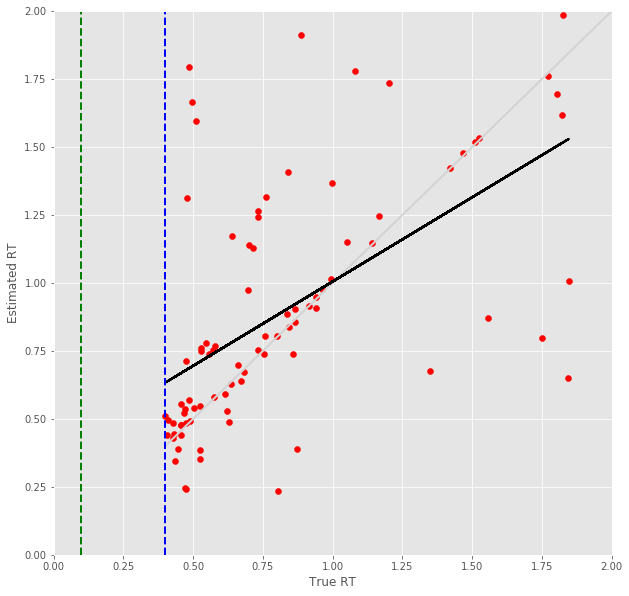

7 -step(s) forecast:
Test Score for 7 -steps forecast: 1.1882 RMSE
Predict Score for 7 -steps forecast: 0.9728 RMSE
Error Test Score for 7 -steps forecast: 0.1944 RMSE
RT Test Score for 7 -steps forecast: 0.2292 RMSE
Error Test Corr for 7 -steps forecast: 0.9332
RT Test Corr for 7 -steps forecast: 0.8529


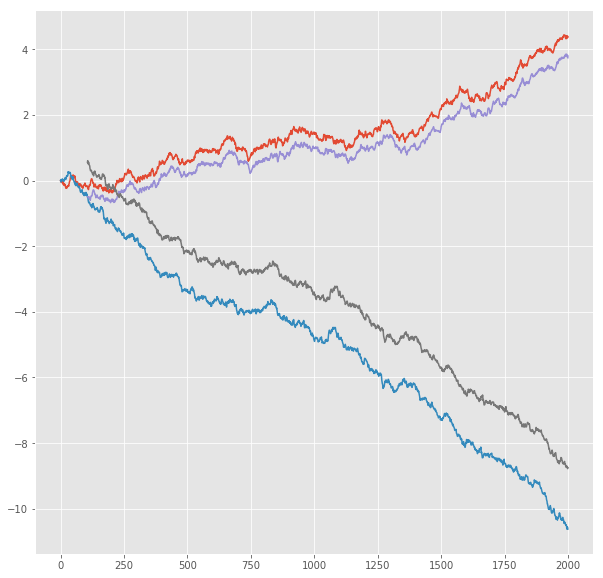

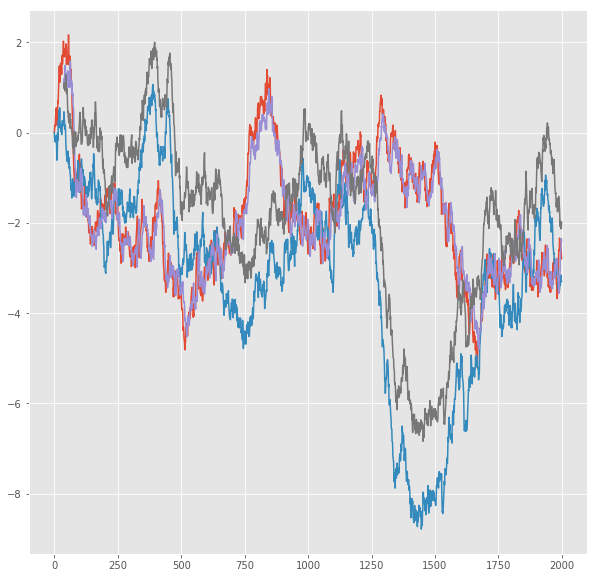

R^2 score for regression on Error: 0.8709
k = 0.9542


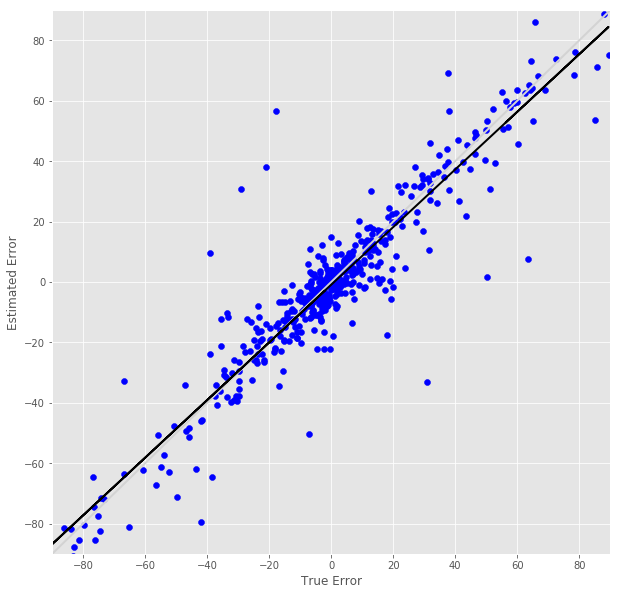

R^2 score for regression on RT: 0.7275
k = 0.9685


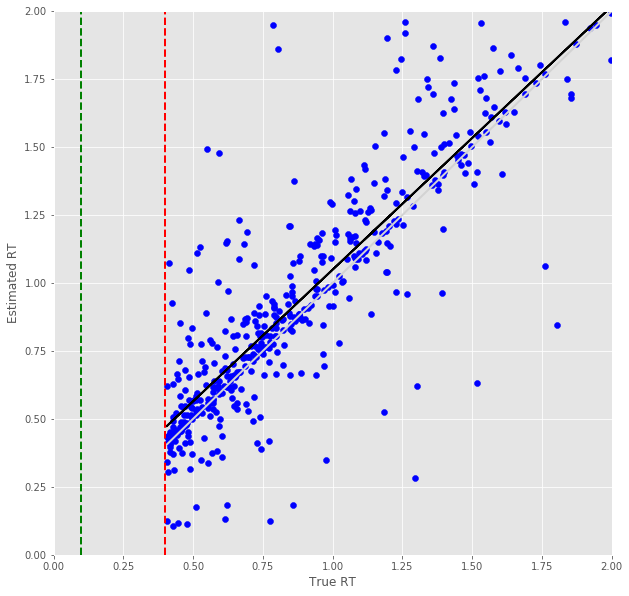

Error Prediction Score: 0.3871 RMSE
RT Prediction Score: 0.4298 RMSE
Error Prediction Corr: 0.7812
RT Prediction Corr: 0.5497
R^2 score for regression on Error: 0.6102
k = 0.9321


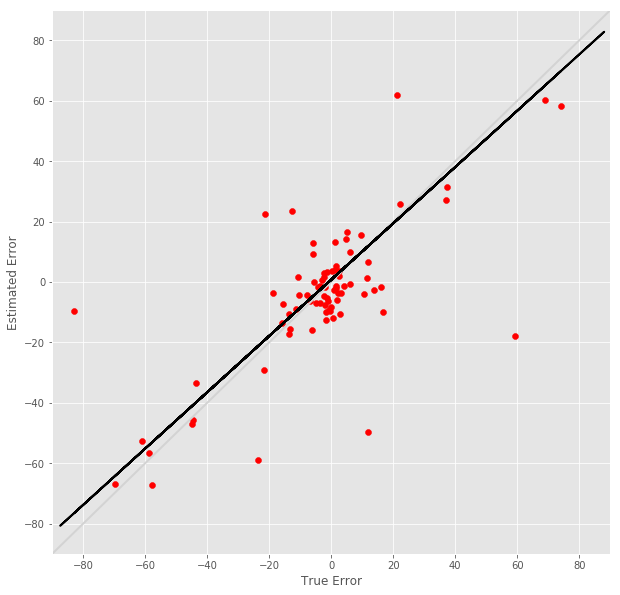

R^2 score for regression on RT: 0.3022
k = 0.6220


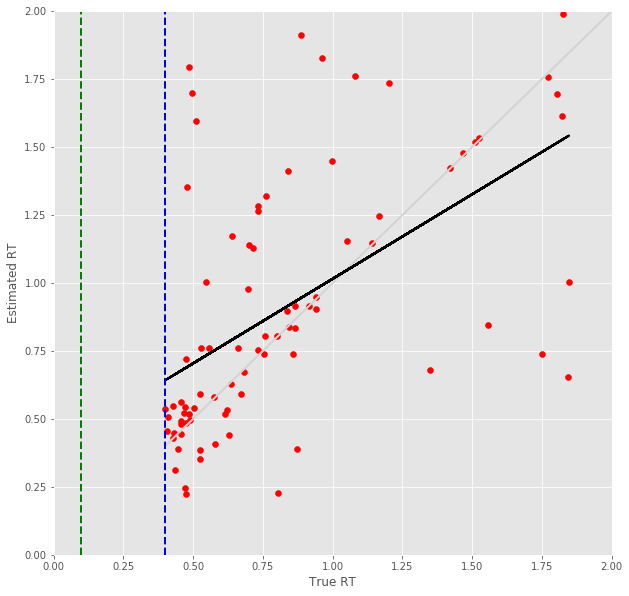

8 -step(s) forecast:
Test Score for 8 -steps forecast: 1.3339 RMSE
Predict Score for 8 -steps forecast: 1.0900 RMSE
Error Test Score for 8 -steps forecast: 0.2185 RMSE
RT Test Score for 8 -steps forecast: 0.2465 RMSE
Error Test Corr for 8 -steps forecast: 0.9160
RT Test Corr for 8 -steps forecast: 0.8362


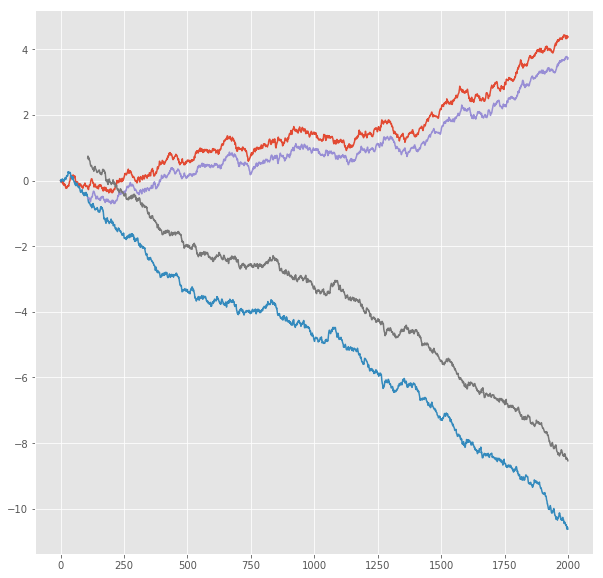

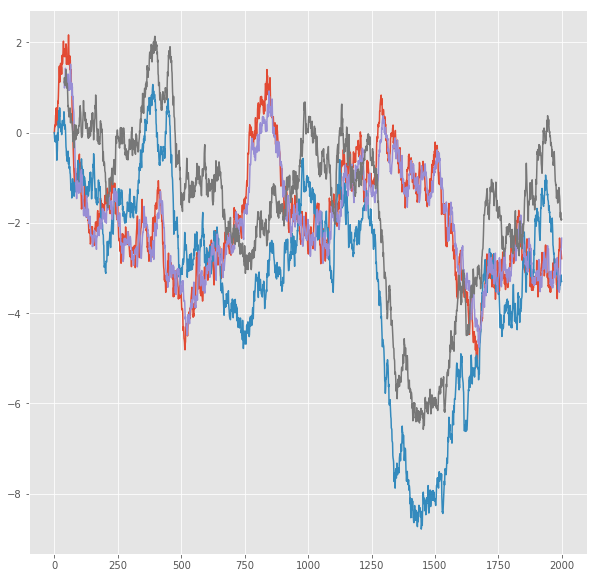

R^2 score for regression on Error: 0.8390
k = 0.9367


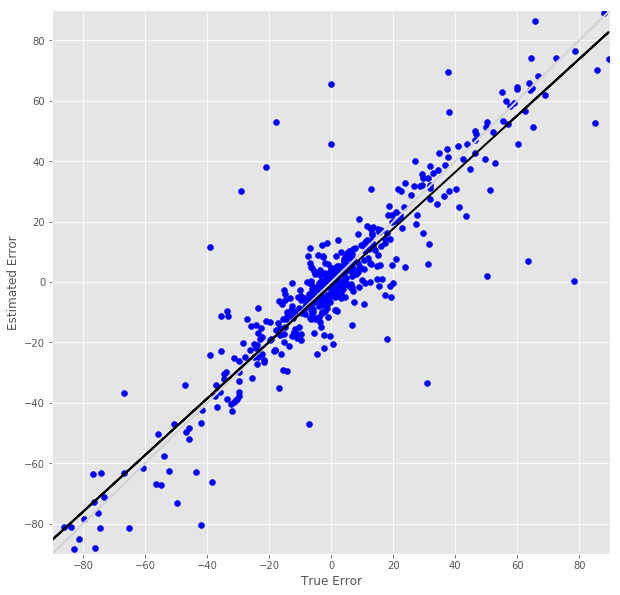

R^2 score for regression on RT: 0.6993
k = 0.9704


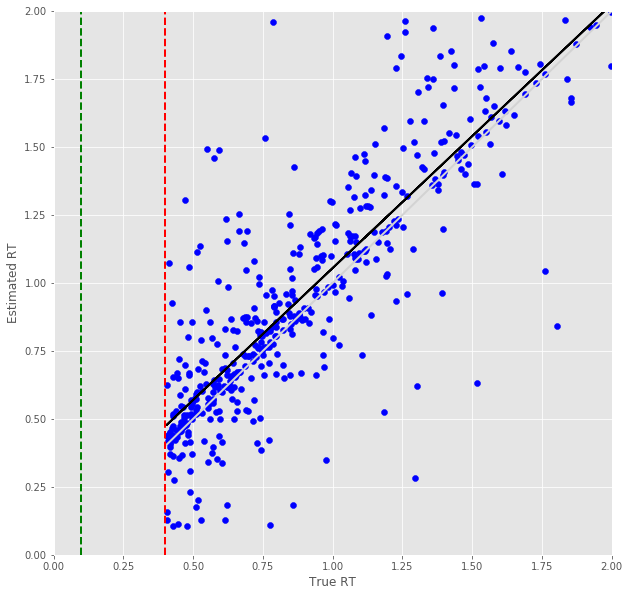

Error Prediction Score: 0.4174 RMSE
RT Prediction Score: 0.4658 RMSE
Error Prediction Corr: 0.7646
RT Prediction Corr: 0.4638
R^2 score for regression on Error: 0.5845
k = 0.9373


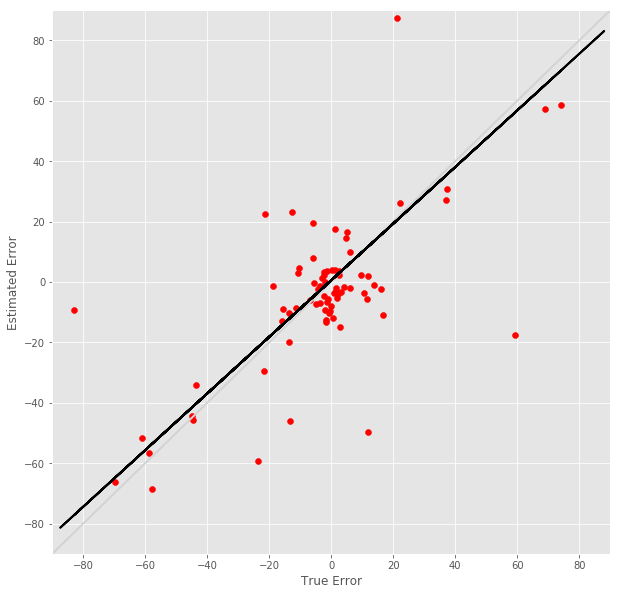

R^2 score for regression on RT: 0.2151
k = 0.5419


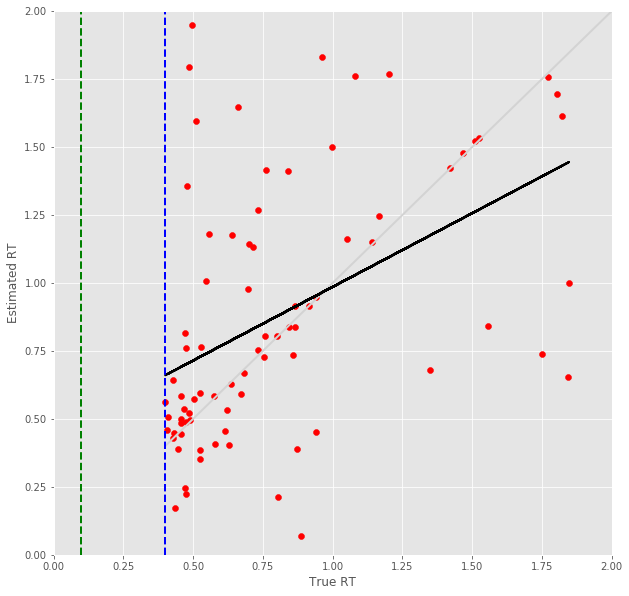

9 -step(s) forecast:
Test Score for 9 -steps forecast: 1.4759 RMSE
Predict Score for 9 -steps forecast: 1.2054 RMSE
Error Test Score for 9 -steps forecast: 0.2356 RMSE
RT Test Score for 9 -steps forecast: 0.2625 RMSE
Error Test Corr for 9 -steps forecast: 0.9040
RT Test Corr for 9 -steps forecast: 0.8148


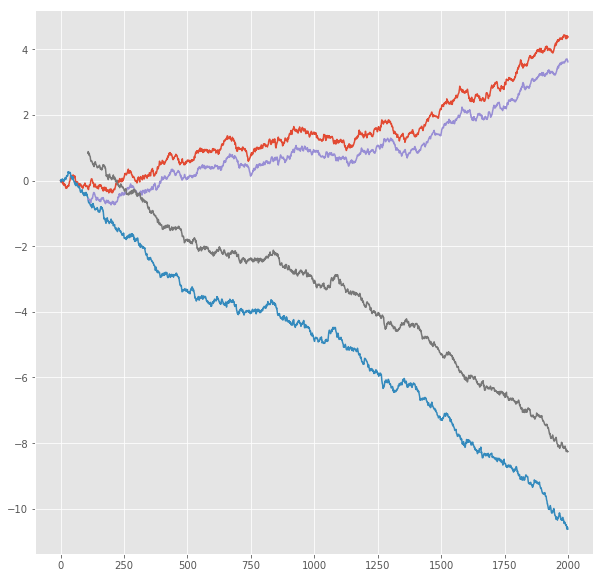

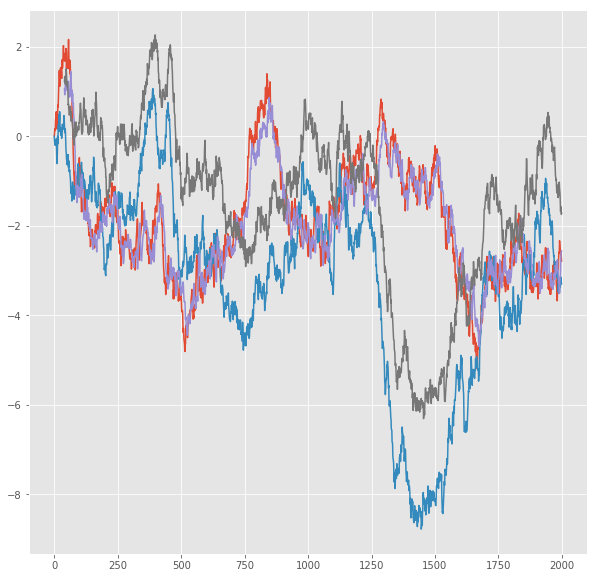

R^2 score for regression on Error: 0.8173
k = 0.9358


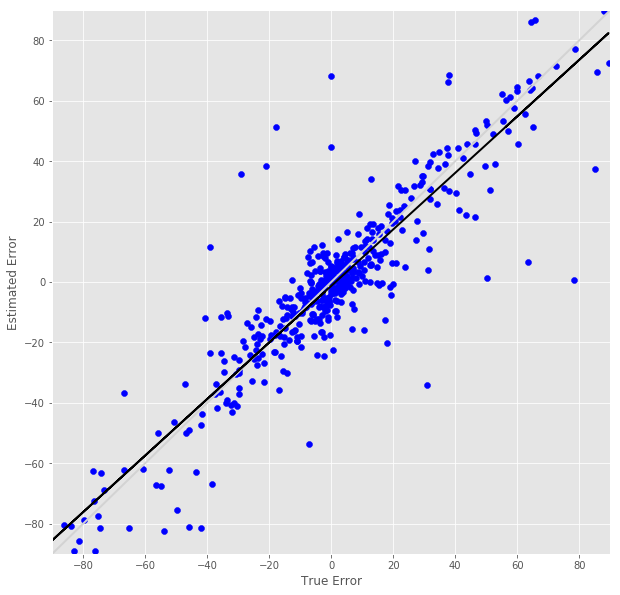

R^2 score for regression on RT: 0.6639
k = 0.9540


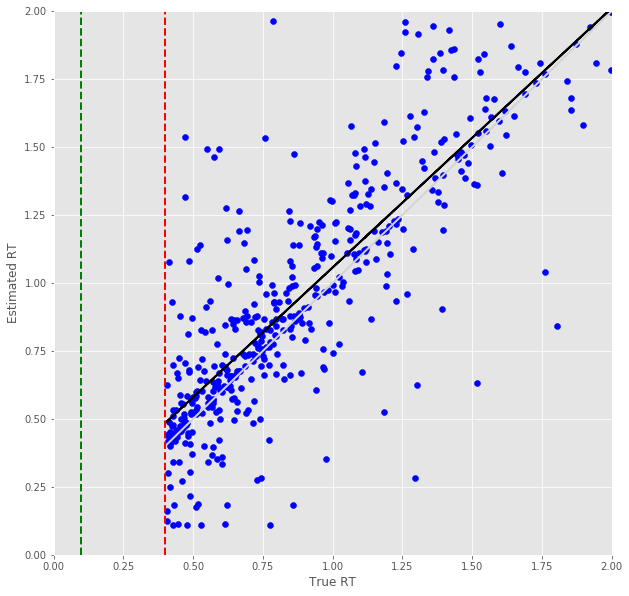

Error Prediction Score: 0.4618 RMSE
RT Prediction Score: 0.5012 RMSE
Error Prediction Corr: 0.7521
RT Prediction Corr: 0.3640
R^2 score for regression on Error: 0.5656
k = 0.9883


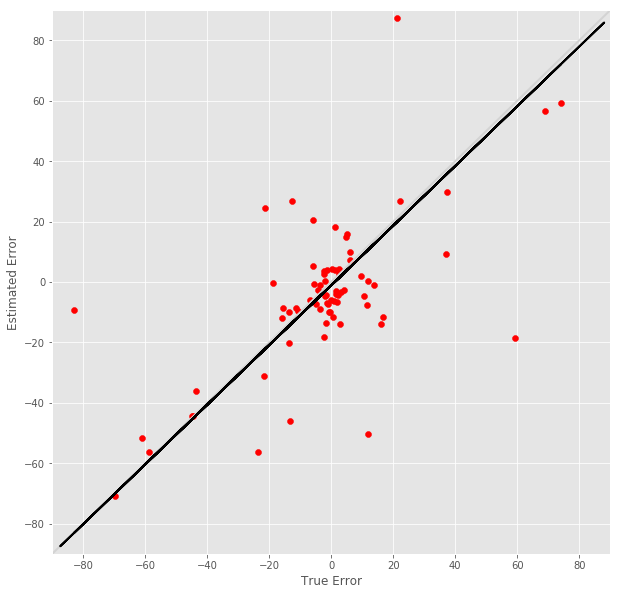

R^2 score for regression on RT: 0.1325
k = 0.4232


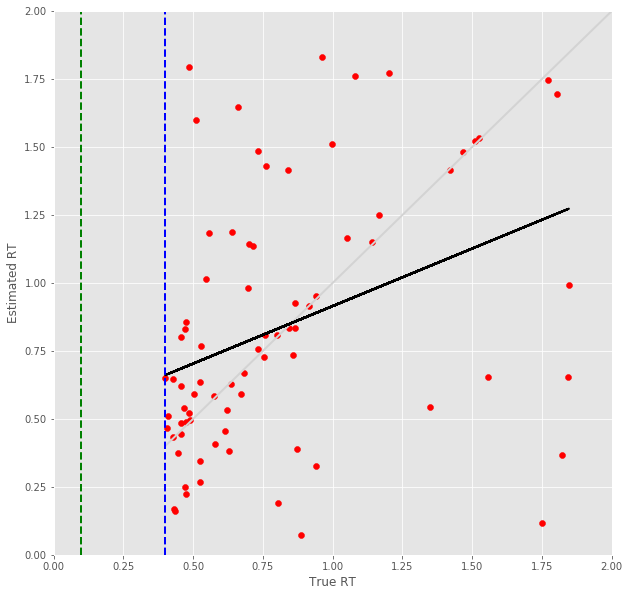

10 -step(s) forecast:
Test Score for 10 -steps forecast: 1.6144 RMSE
Predict Score for 10 -steps forecast: 1.3190 RMSE
Error Test Score for 10 -steps forecast: 0.2599 RMSE
RT Test Score for 10 -steps forecast: 0.2852 RMSE
Error Test Corr for 10 -steps forecast: 0.8887
RT Test Corr for 10 -steps forecast: 0.7869


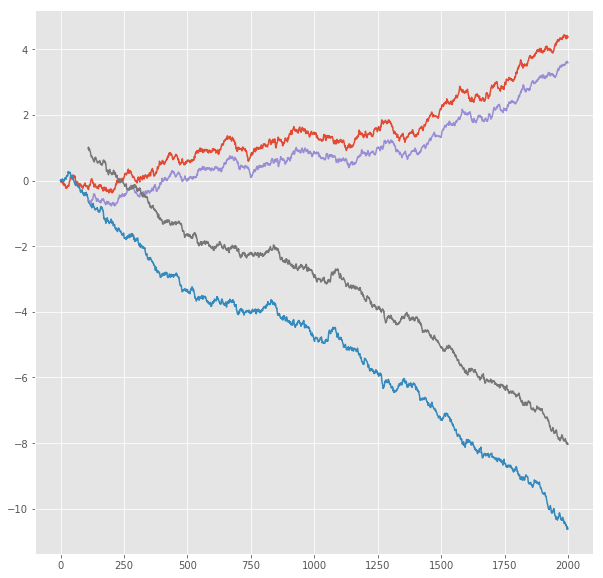

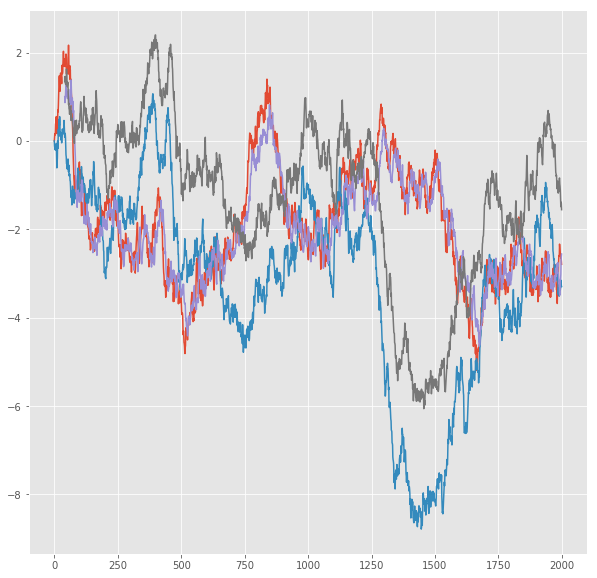

R^2 score for regression on Error: 0.7897
k = 0.9522


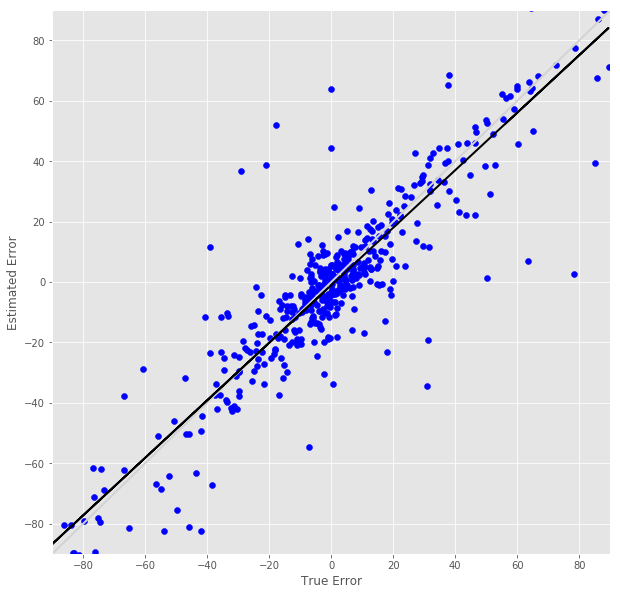

R^2 score for regression on RT: 0.6192
k = 0.9447


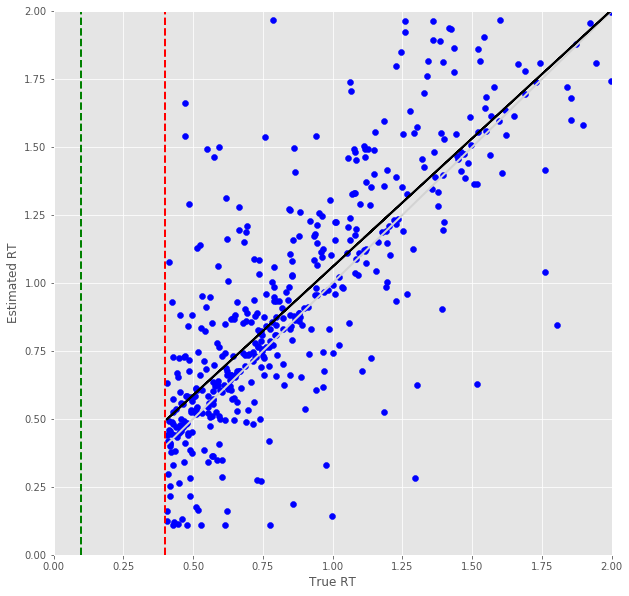

Error Prediction Score: 0.5128 RMSE
RT Prediction Score: 0.5632 RMSE
Error Prediction Corr: 0.7169
RT Prediction Corr: 0.2739
R^2 score for regression on Error: 0.5139
k = 1.0031


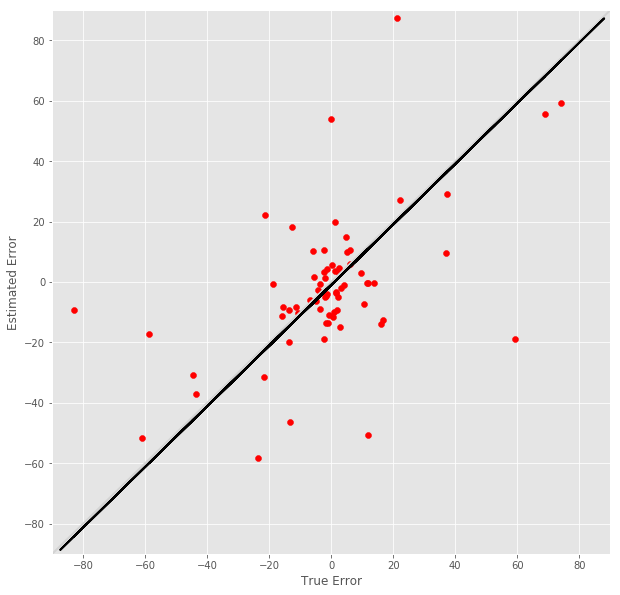

R^2 score for regression on RT: 0.0750
k = 0.3411


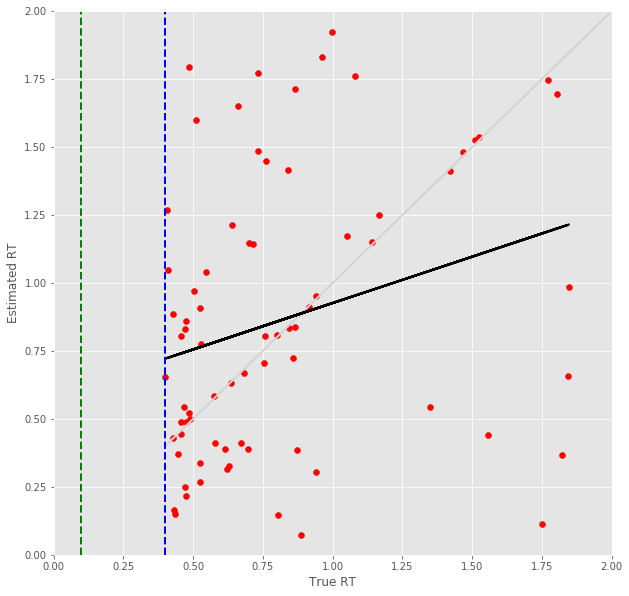

11 -step(s) forecast:
Test Score for 11 -steps forecast: 1.7495 RMSE
Predict Score for 11 -steps forecast: 1.4310 RMSE
Error Test Score for 11 -steps forecast: 0.2801 RMSE
RT Test Score for 11 -steps forecast: 0.3023 RMSE
Error Test Corr for 11 -steps forecast: 0.8761
RT Test Corr for 11 -steps forecast: 0.7679


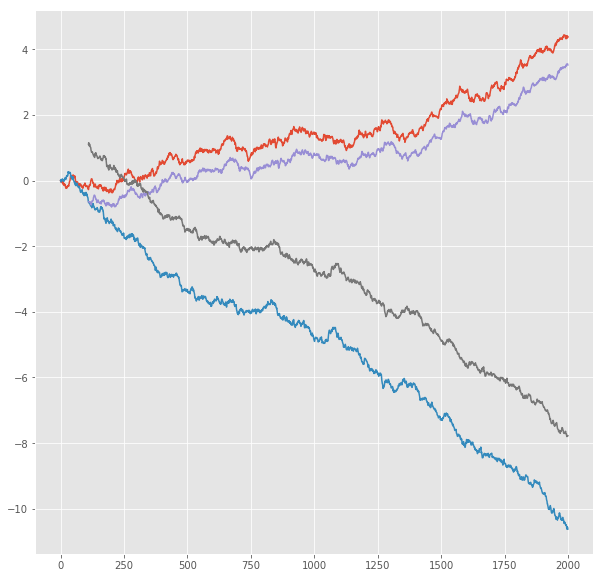

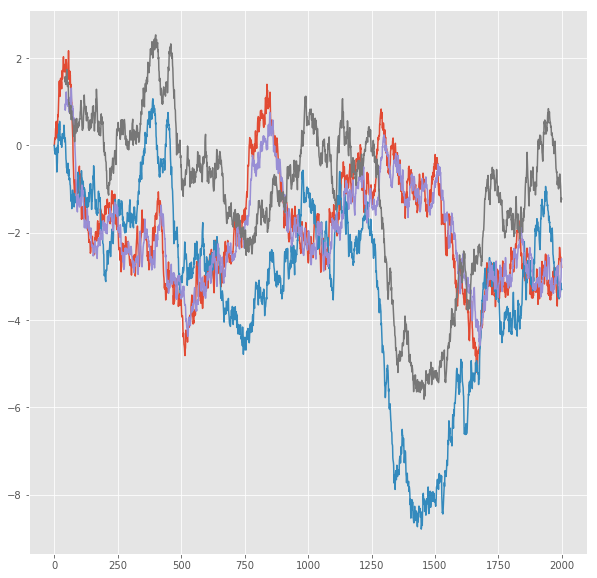

R^2 score for regression on Error: 0.7675
k = 0.9633


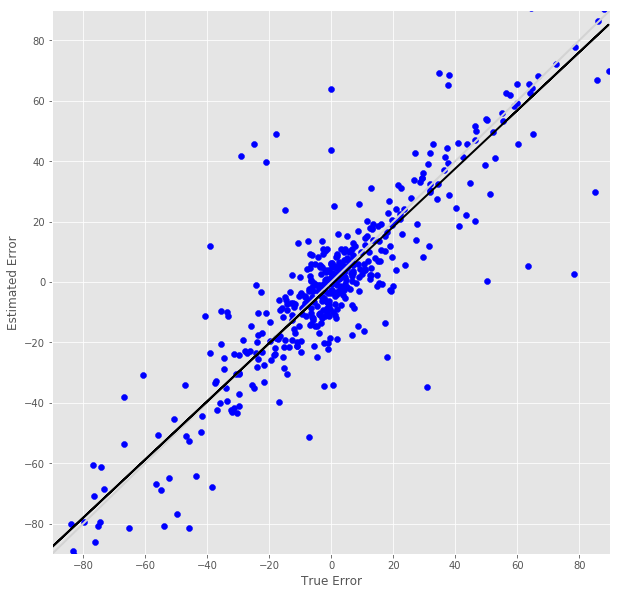

R^2 score for regression on RT: 0.5897
k = 0.9451


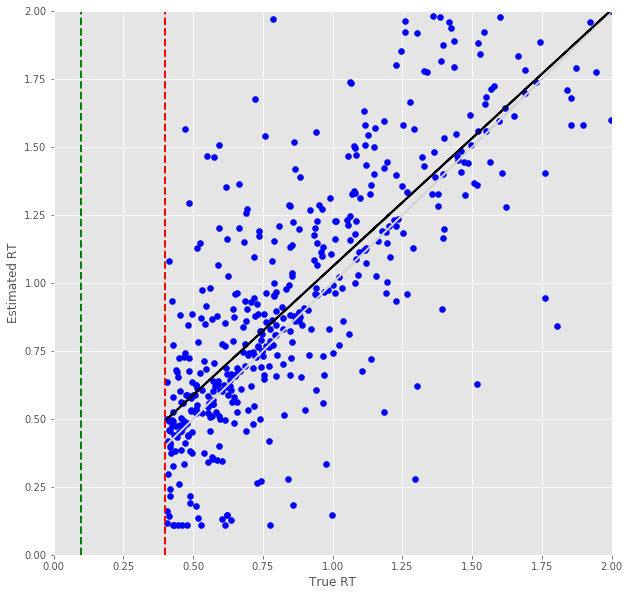

Error Prediction Score: 0.5247 RMSE
RT Prediction Score: 0.5714 RMSE
Error Prediction Corr: 0.7198
RT Prediction Corr: 0.2660
R^2 score for regression on Error: 0.5182
k = 1.0210


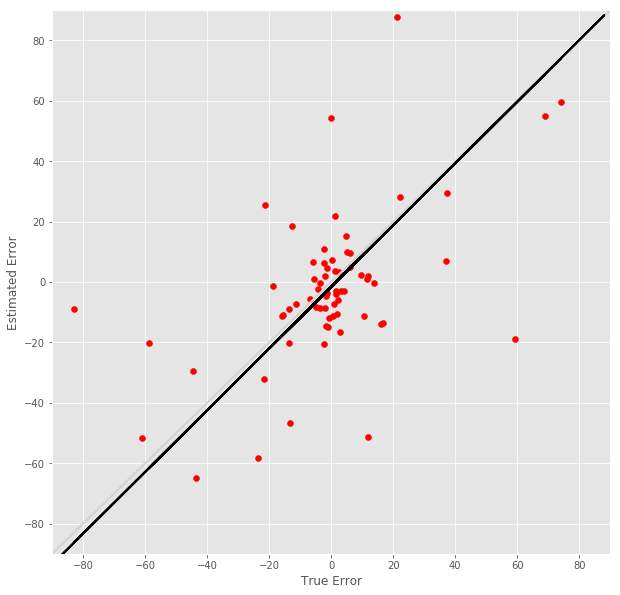

R^2 score for regression on RT: 0.0708
k = 0.3301


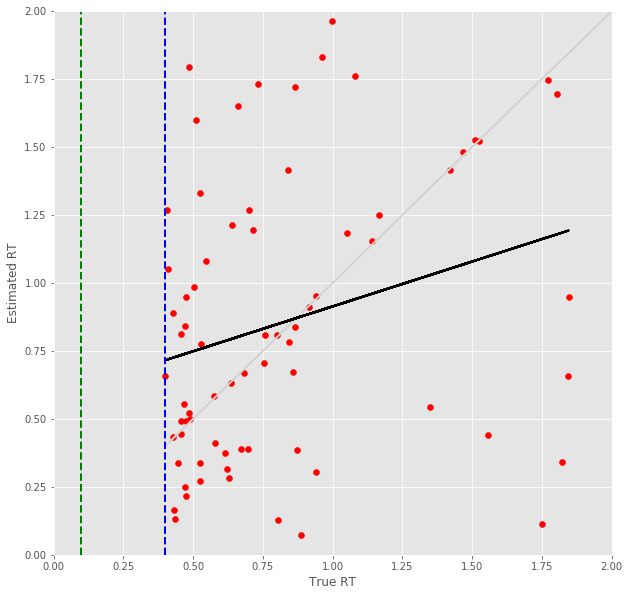

12 -step(s) forecast:
Test Score for 12 -steps forecast: 1.8813 RMSE
Predict Score for 12 -steps forecast: 1.5414 RMSE
Error Test Score for 12 -steps forecast: 0.2878 RMSE
RT Test Score for 12 -steps forecast: 0.3096 RMSE
Error Test Corr for 12 -steps forecast: 0.8693
RT Test Corr for 12 -steps forecast: 0.7529


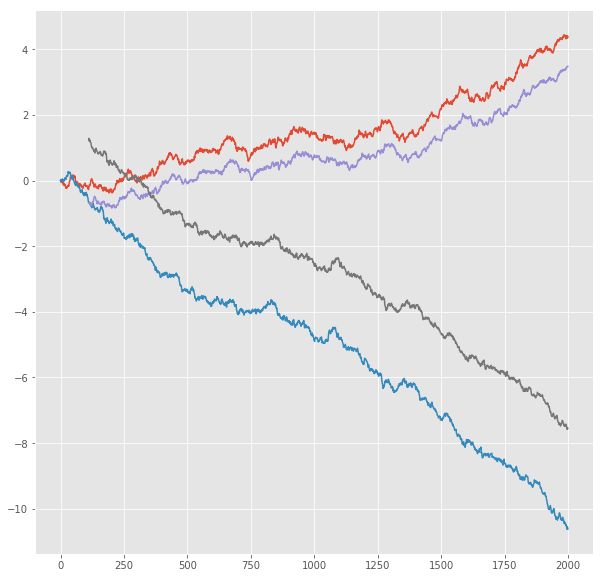

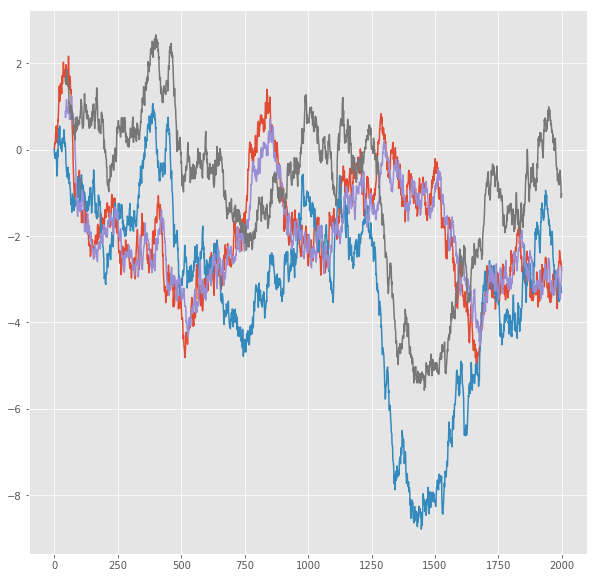

R^2 score for regression on Error: 0.7556
k = 0.9674


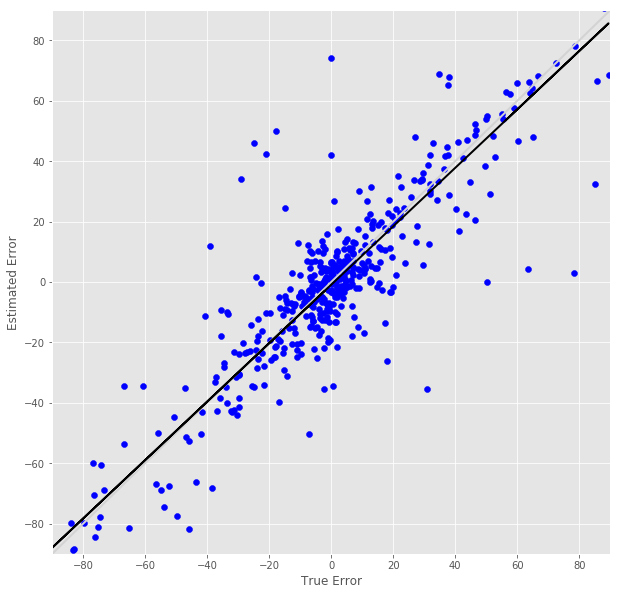

R^2 score for regression on RT: 0.5669
k = 0.9280


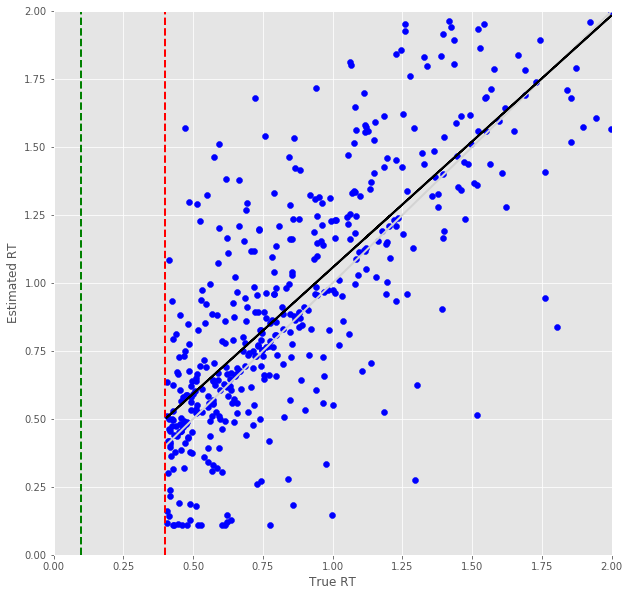

Error Prediction Score: 0.5428 RMSE
RT Prediction Score: 0.5737 RMSE
Error Prediction Corr: 0.7106
RT Prediction Corr: 0.2577
R^2 score for regression on Error: 0.5050
k = 1.0099


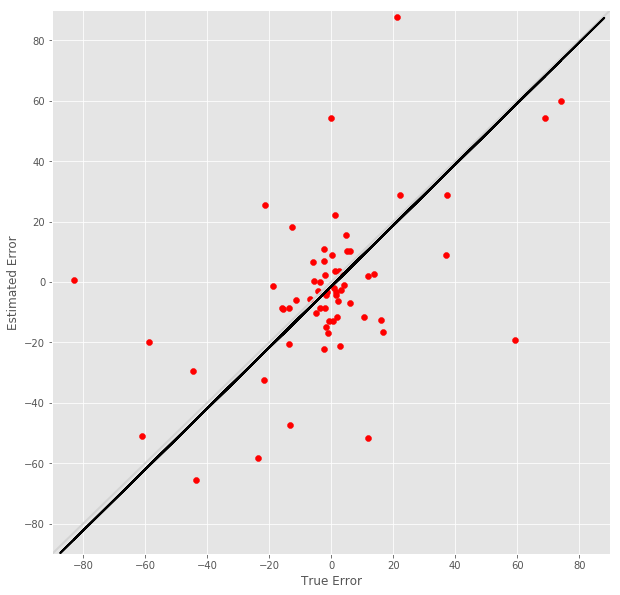

R^2 score for regression on RT: 0.0664
k = 0.3140


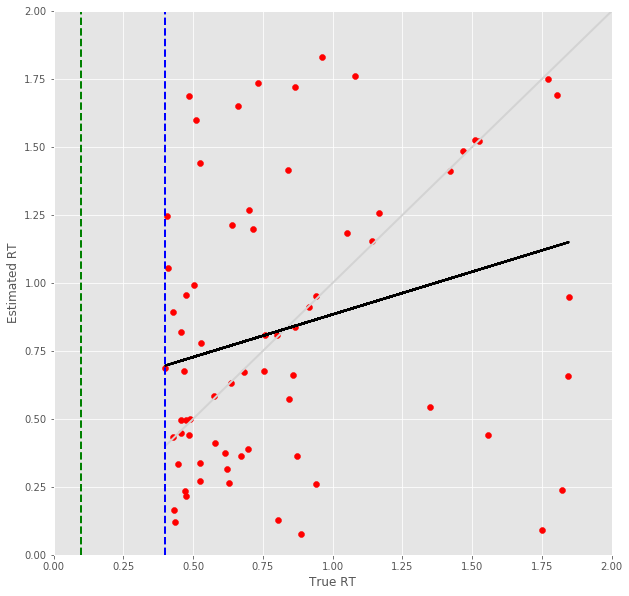

13 -step(s) forecast:
Test Score for 13 -steps forecast: 2.0100 RMSE
Predict Score for 13 -steps forecast: 1.6501 RMSE
Error Test Score for 13 -steps forecast: 0.2979 RMSE
RT Test Score for 13 -steps forecast: 0.3298 RMSE
Error Test Corr for 13 -steps forecast: 0.8608
RT Test Corr for 13 -steps forecast: 0.7172


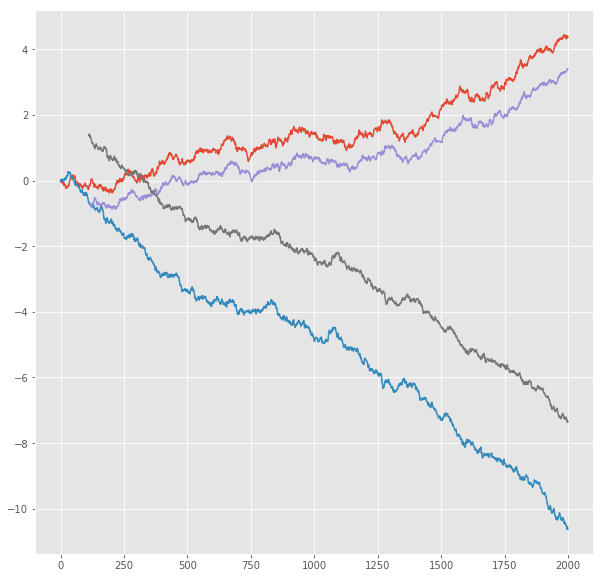

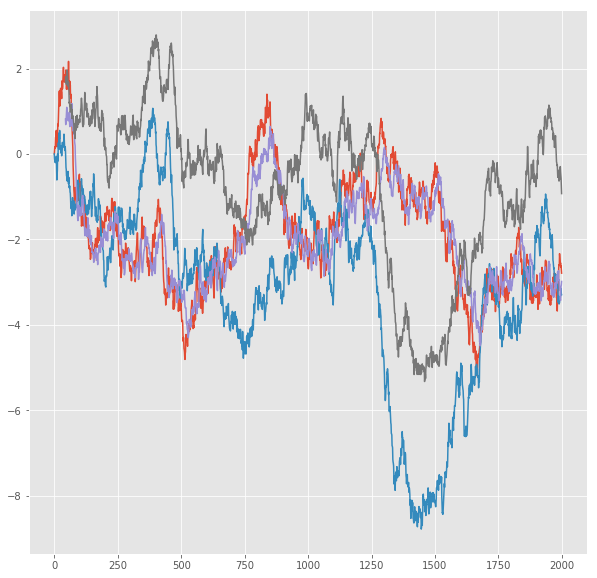

R^2 score for regression on Error: 0.7409
k = 0.9697


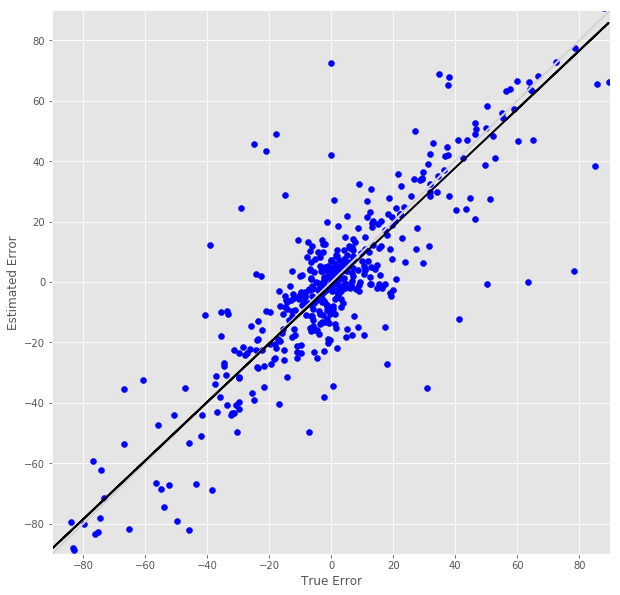

R^2 score for regression on RT: 0.5144
k = 0.9083


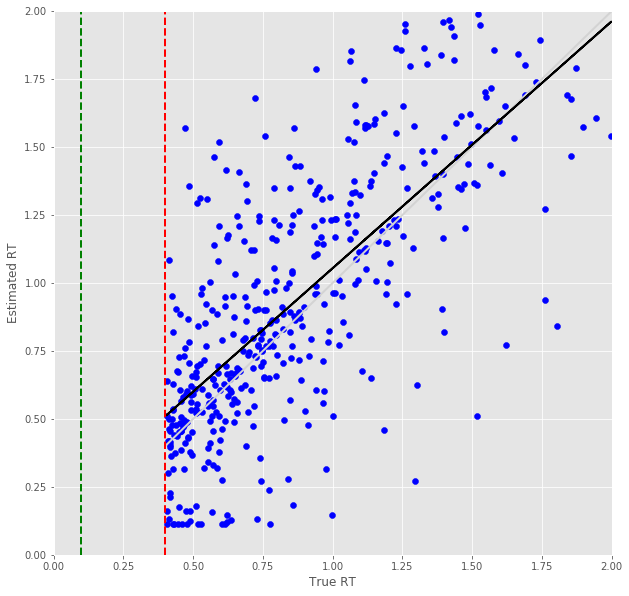

Error Prediction Score: 0.5815 RMSE
RT Prediction Score: 0.5994 RMSE
Error Prediction Corr: 0.6876
RT Prediction Corr: 0.2002
R^2 score for regression on Error: 0.4728
k = 1.0351


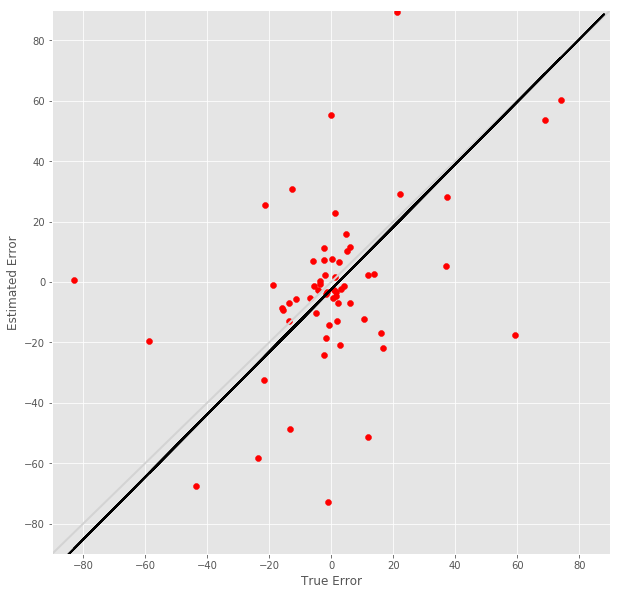

R^2 score for regression on RT: 0.0401
k = 0.2410


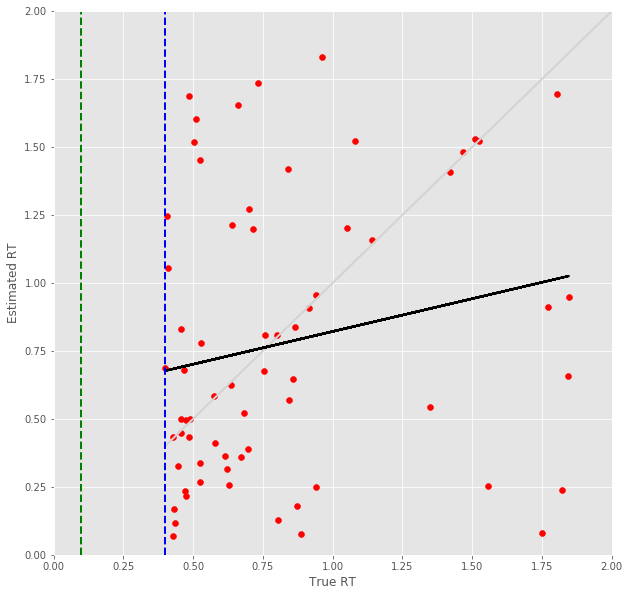

14 -step(s) forecast:
Test Score for 14 -steps forecast: 2.1359 RMSE
Predict Score for 14 -steps forecast: 1.7572 RMSE
Error Test Score for 14 -steps forecast: 0.3064 RMSE
RT Test Score for 14 -steps forecast: 0.3533 RMSE
Error Test Corr for 14 -steps forecast: 0.8563
RT Test Corr for 14 -steps forecast: 0.6765


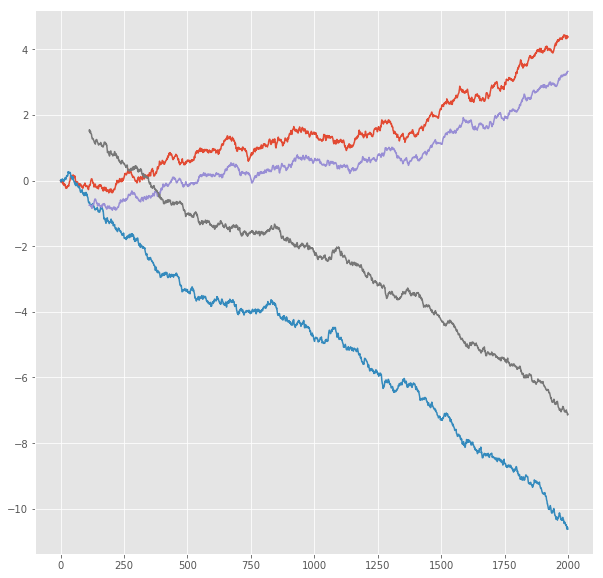

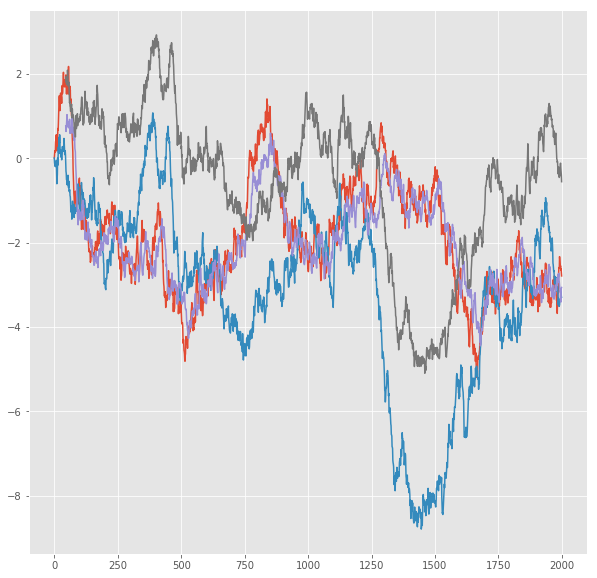

R^2 score for regression on Error: 0.7333
k = 0.9783


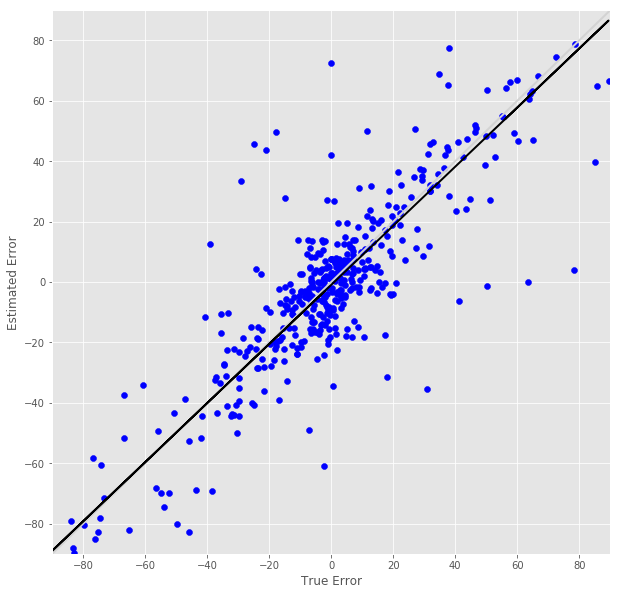

R^2 score for regression on RT: 0.4576
k = 0.8723


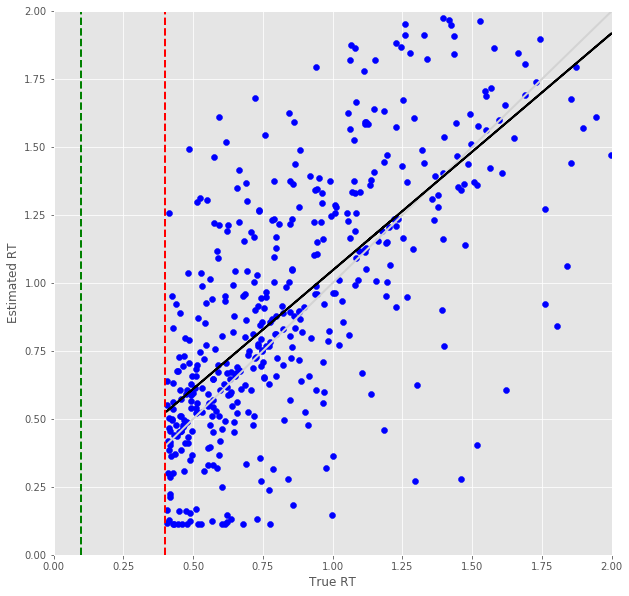

Error Prediction Score: 0.5794 RMSE
RT Prediction Score: 0.6048 RMSE
Error Prediction Corr: 0.6816
RT Prediction Corr: 0.2087
R^2 score for regression on Error: 0.4645
k = 1.0134


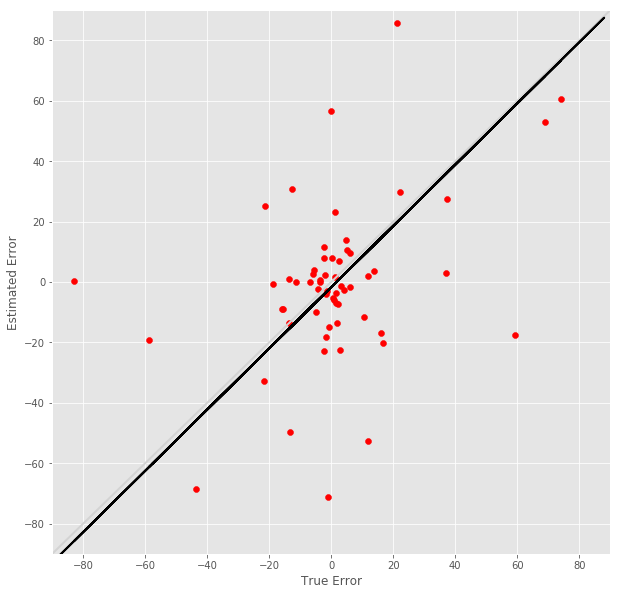

R^2 score for regression on RT: 0.0435
k = 0.2533


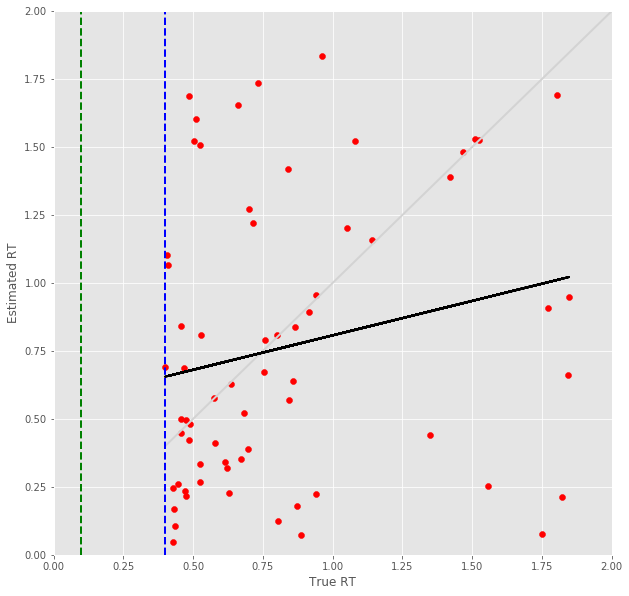

15 -step(s) forecast:
Test Score for 15 -steps forecast: 2.2590 RMSE
Predict Score for 15 -steps forecast: 1.8628 RMSE
Error Test Score for 15 -steps forecast: 0.3345 RMSE
RT Test Score for 15 -steps forecast: 0.3821 RMSE
Error Test Corr for 15 -steps forecast: 0.8318
RT Test Corr for 15 -steps forecast: 0.6272


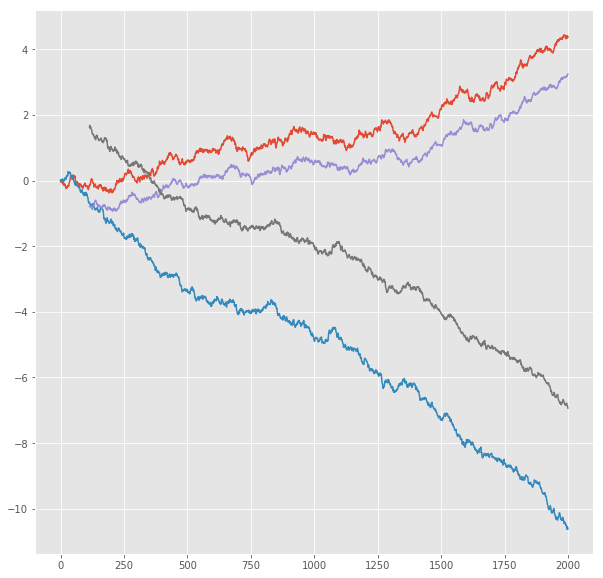

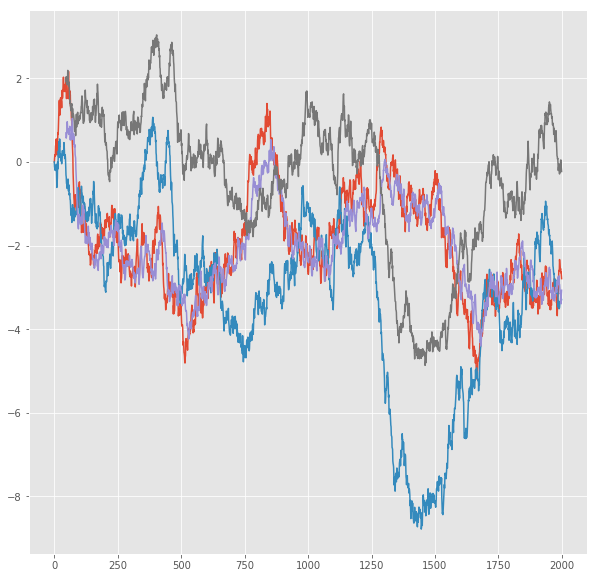

R^2 score for regression on Error: 0.6919
k = 0.9633


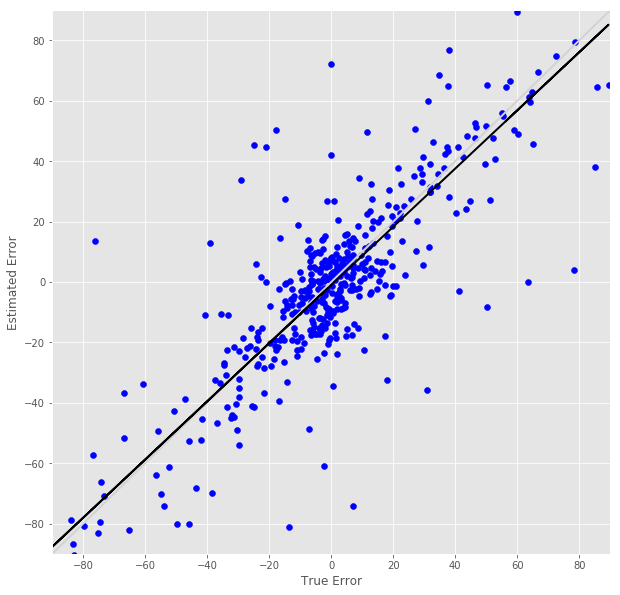

R^2 score for regression on RT: 0.3934
k = 0.8321


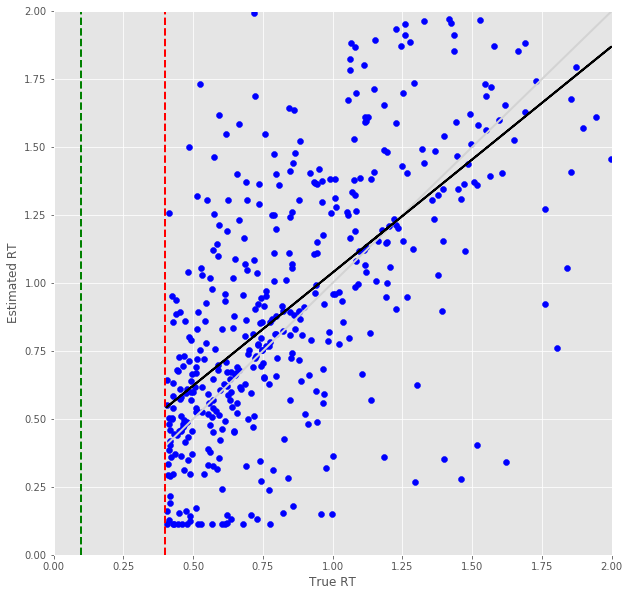

Error Prediction Score: 0.5837 RMSE
RT Prediction Score: 0.6004 RMSE
Error Prediction Corr: 0.6816
RT Prediction Corr: 0.2282
R^2 score for regression on Error: 0.4646
k = 1.0069


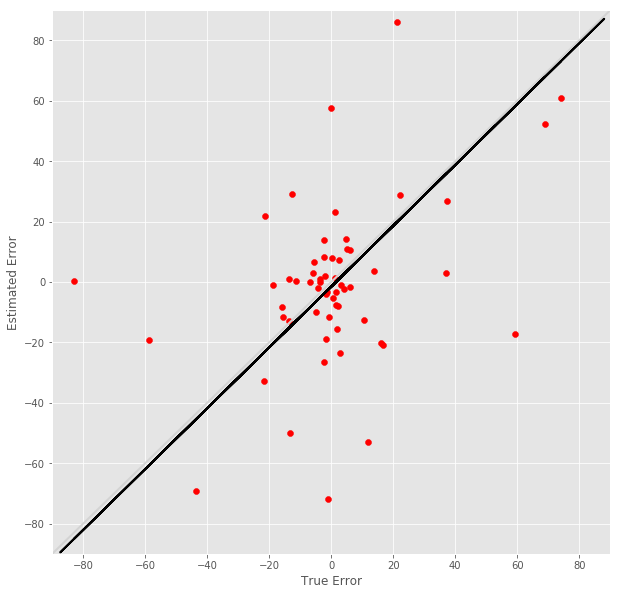

R^2 score for regression on RT: 0.0521
k = 0.2723


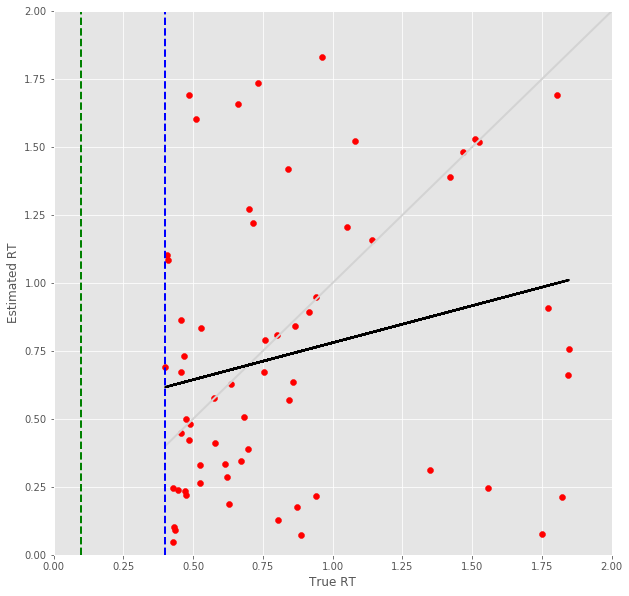

16 -step(s) forecast:
Test Score for 16 -steps forecast: 2.3797 RMSE
Predict Score for 16 -steps forecast: 1.9670 RMSE
Error Test Score for 16 -steps forecast: 0.3550 RMSE
RT Test Score for 16 -steps forecast: 0.4107 RMSE
Error Test Corr for 16 -steps forecast: 0.8264
RT Test Corr for 16 -steps forecast: 0.5724


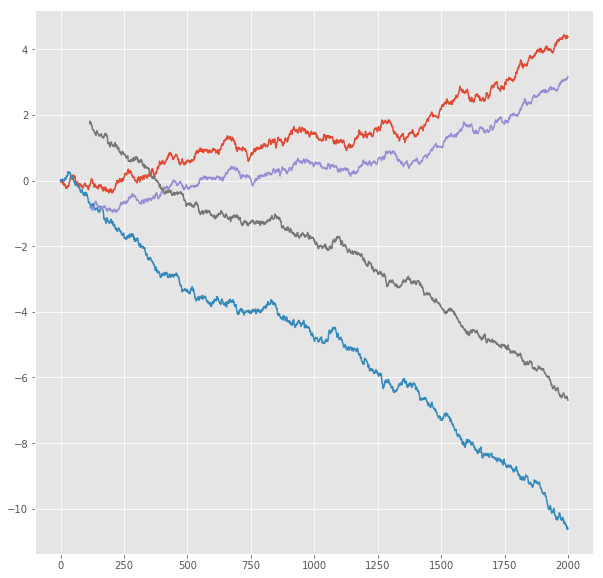

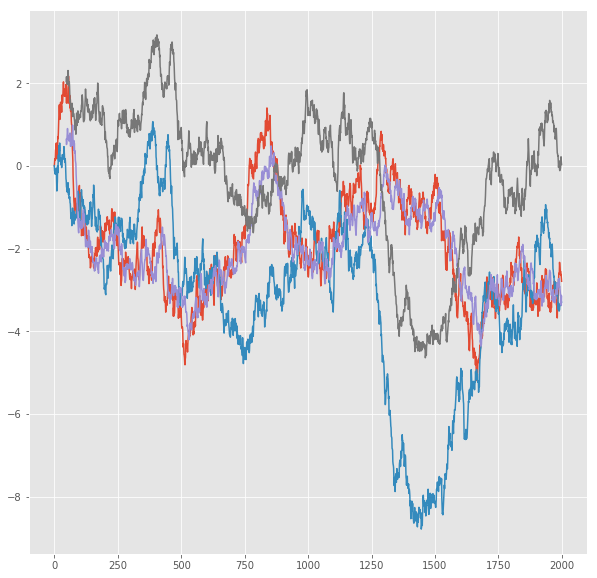

R^2 score for regression on Error: 0.6830
k = 1.0034


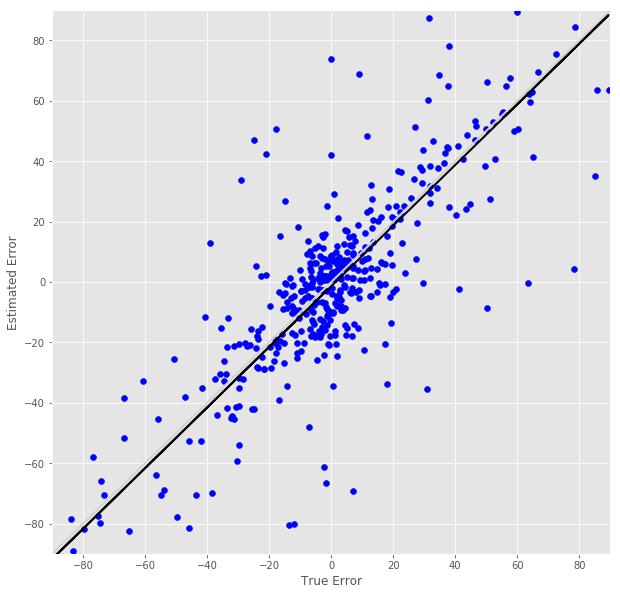

R^2 score for regression on RT: 0.3276
k = 0.7619


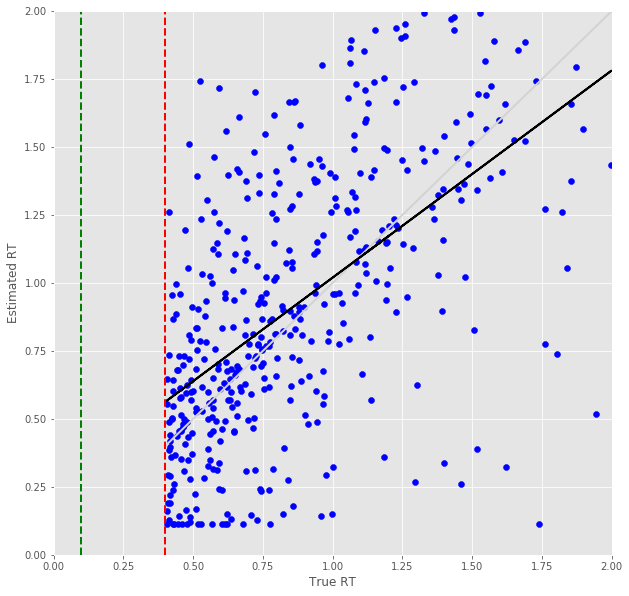

Error Prediction Score: 0.5942 RMSE
RT Prediction Score: 0.6088 RMSE
Error Prediction Corr: 0.6715
RT Prediction Corr: 0.2184
R^2 score for regression on Error: 0.4509
k = 1.0026


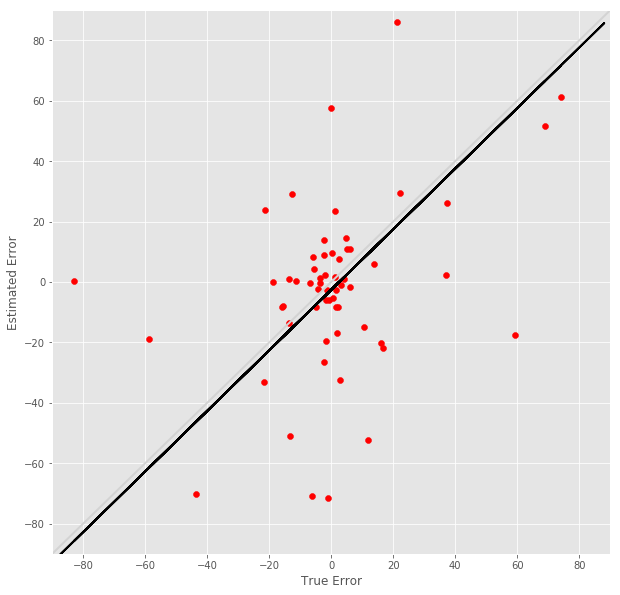

R^2 score for regression on RT: 0.0477
k = 0.2674


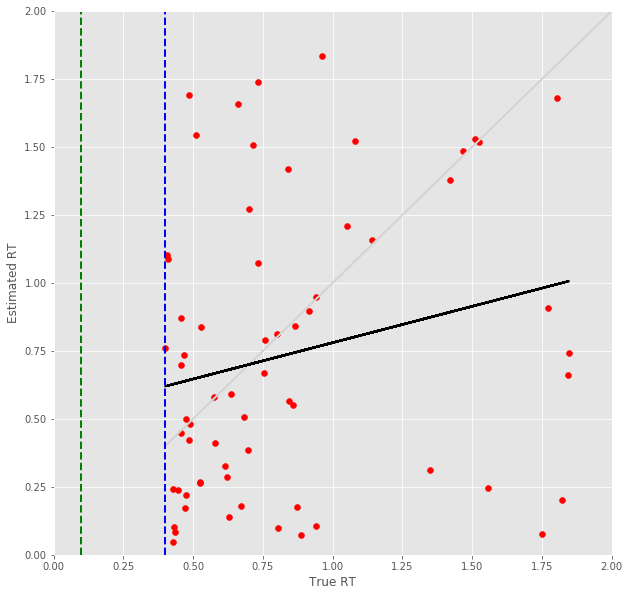

17 -step(s) forecast:
Test Score for 17 -steps forecast: 2.4980 RMSE
Predict Score for 17 -steps forecast: 2.0699 RMSE
Error Test Score for 17 -steps forecast: 0.3732 RMSE
RT Test Score for 17 -steps forecast: 0.4270 RMSE
Error Test Corr for 17 -steps forecast: 0.8028
RT Test Corr for 17 -steps forecast: 0.5324


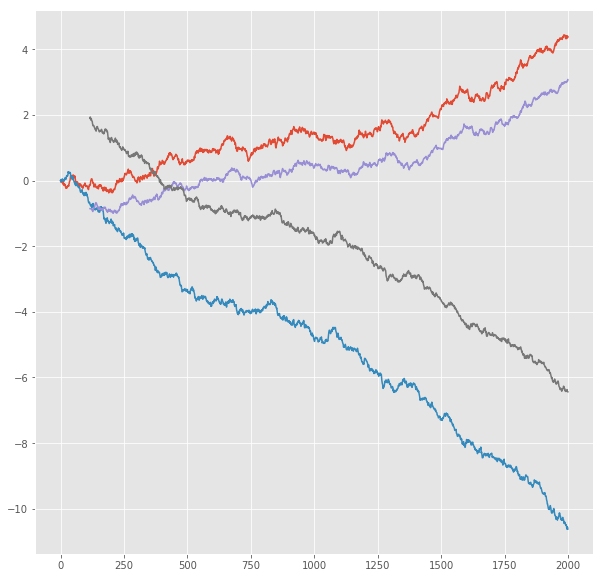

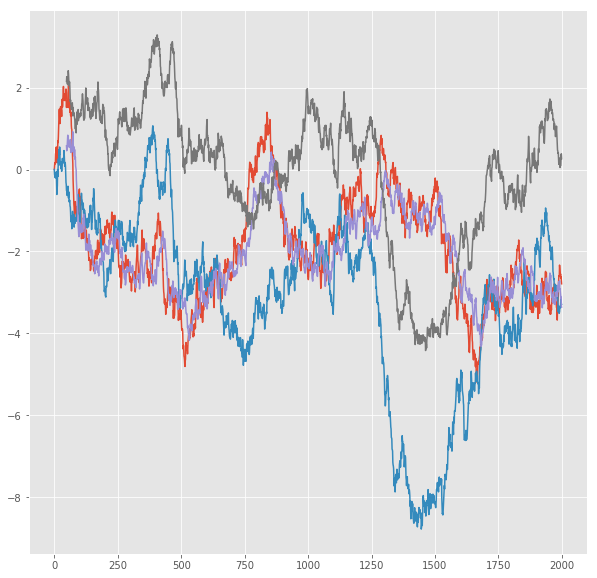

R^2 score for regression on Error: 0.6445
k = 0.9626


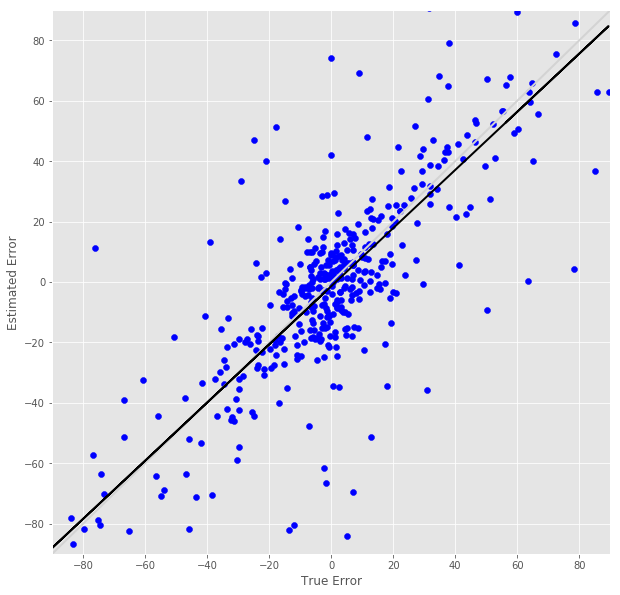

R^2 score for regression on RT: 0.2834
k = 0.7034


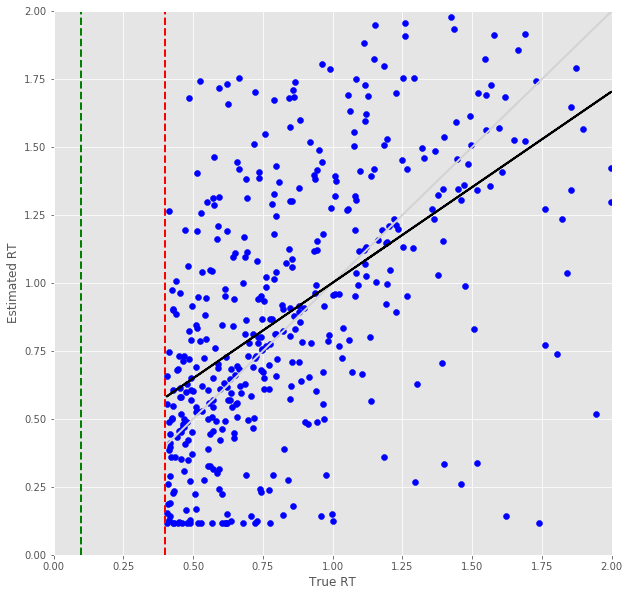

Error Prediction Score: 0.6143 RMSE
RT Prediction Score: 0.6102 RMSE
Error Prediction Corr: 0.6529
RT Prediction Corr: 0.2445
R^2 score for regression on Error: 0.4263
k = 0.9803


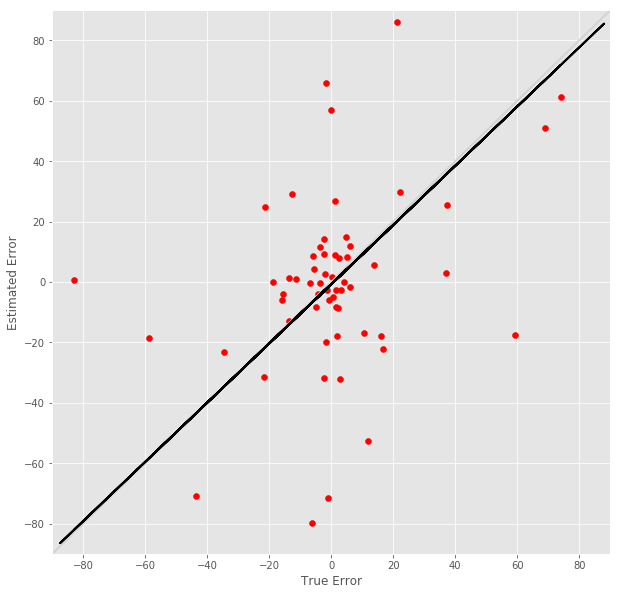

R^2 score for regression on RT: 0.0598
k = 0.3030


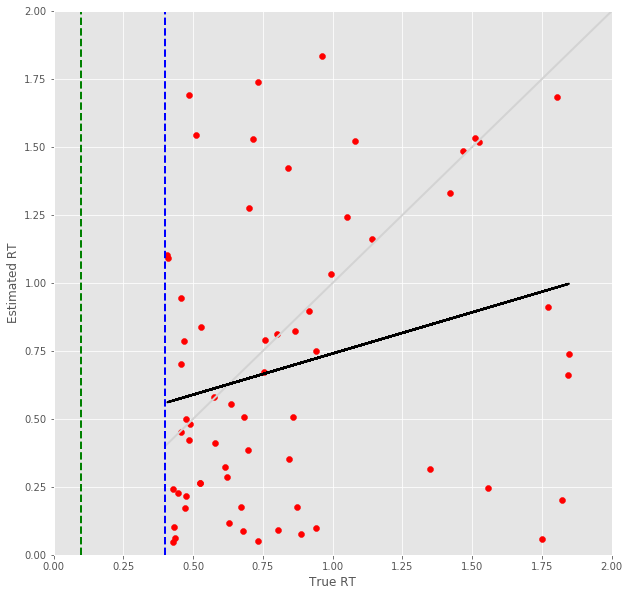

18 -step(s) forecast:
Test Score for 18 -steps forecast: 2.6142 RMSE
Predict Score for 18 -steps forecast: 2.1715 RMSE
Error Test Score for 18 -steps forecast: 0.3834 RMSE
RT Test Score for 18 -steps forecast: 0.4382 RMSE
Error Test Corr for 18 -steps forecast: 0.7908
RT Test Corr for 18 -steps forecast: 0.5101


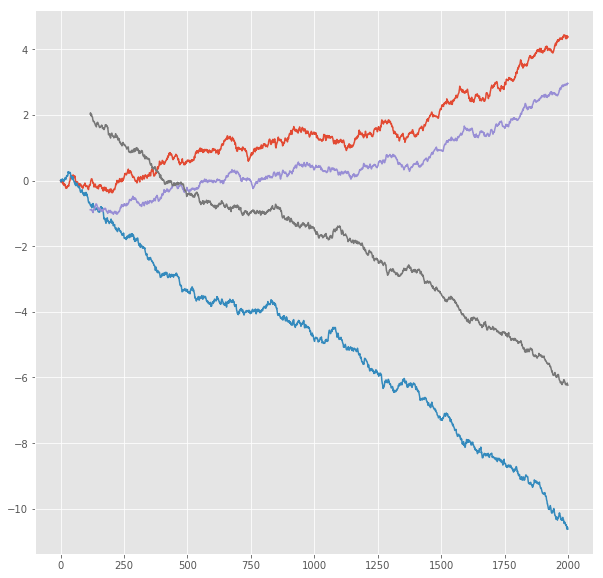

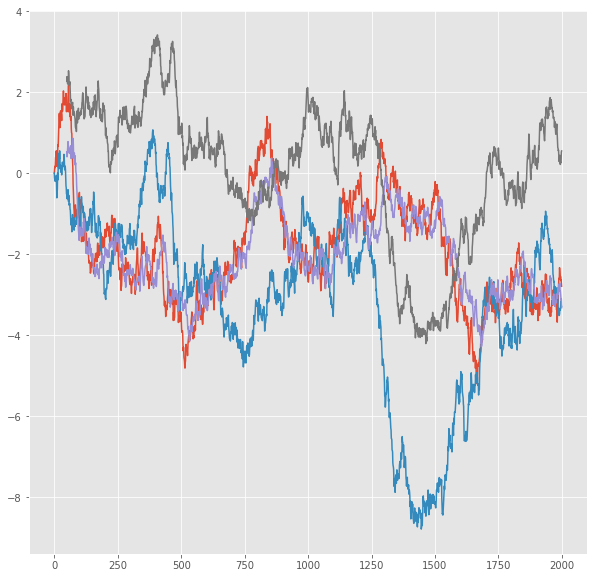

R^2 score for regression on Error: 0.6254
k = 0.9532


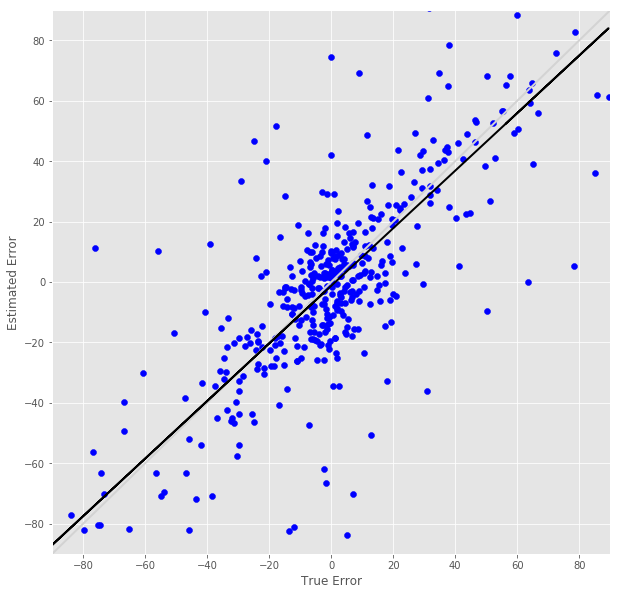

R^2 score for regression on RT: 0.2602
k = 0.6787


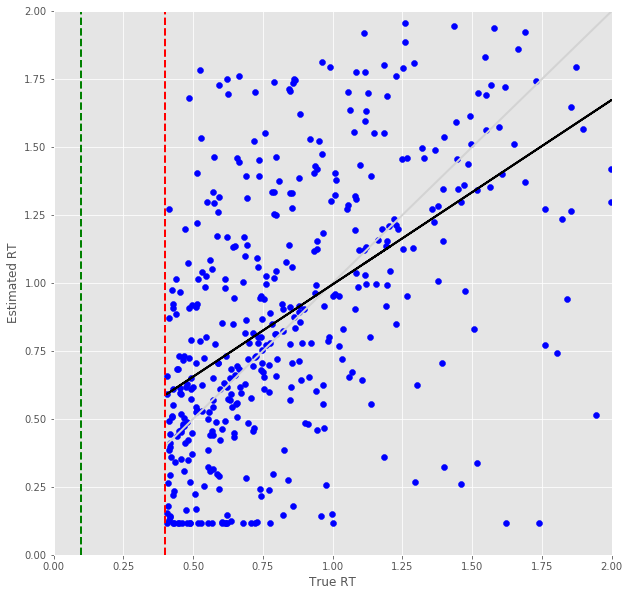

Error Prediction Score: 0.6319 RMSE
RT Prediction Score: 0.6391 RMSE
Error Prediction Corr: 0.6415
RT Prediction Corr: 0.2277
R^2 score for regression on Error: 0.4115
k = 0.9769


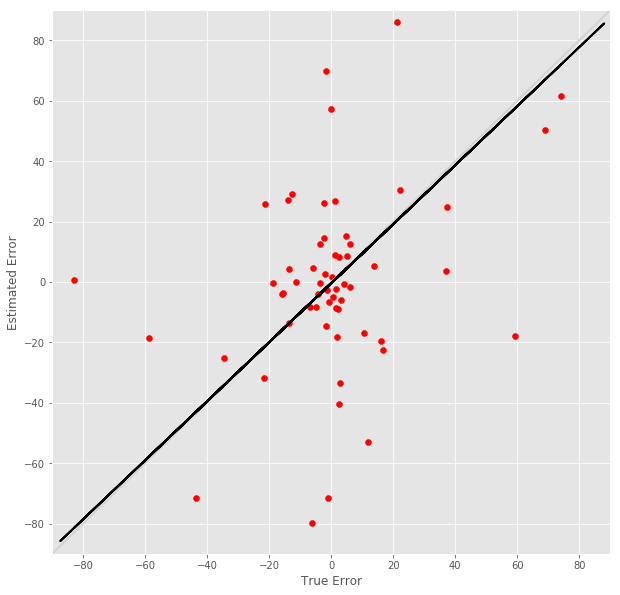

R^2 score for regression on RT: 0.0518
k = 0.2728


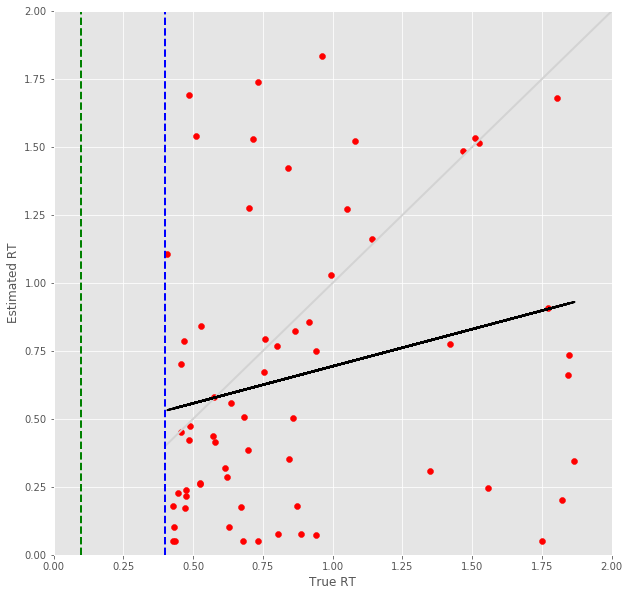

19 -step(s) forecast:
Test Score for 19 -steps forecast: 2.7282 RMSE
Predict Score for 19 -steps forecast: 2.2719 RMSE
Error Test Score for 19 -steps forecast: 0.4127 RMSE
RT Test Score for 19 -steps forecast: 0.4538 RMSE
Error Test Corr for 19 -steps forecast: 0.7720
RT Test Corr for 19 -steps forecast: 0.4826


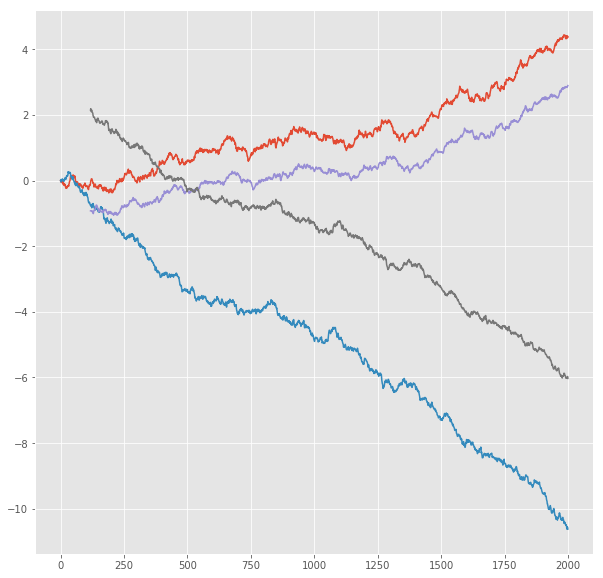

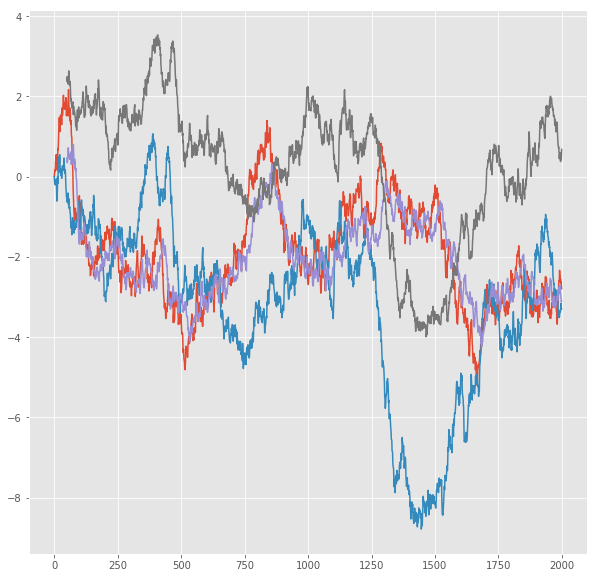

R^2 score for regression on Error: 0.5960
k = 0.9639


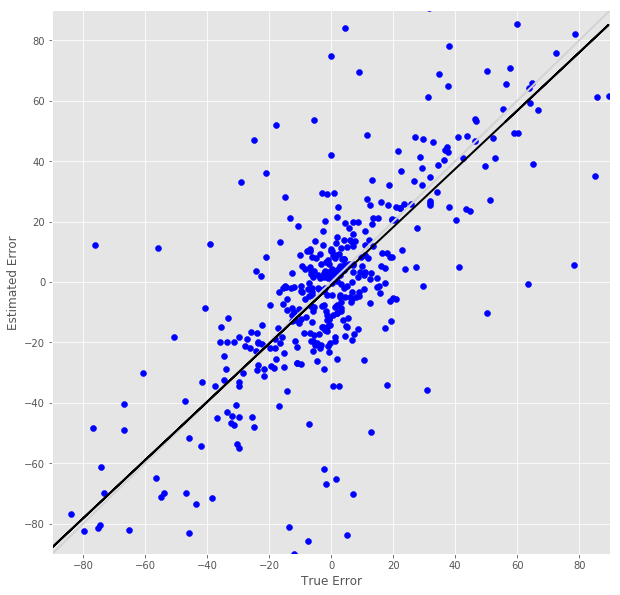

R^2 score for regression on RT: 0.2329
k = 0.6511


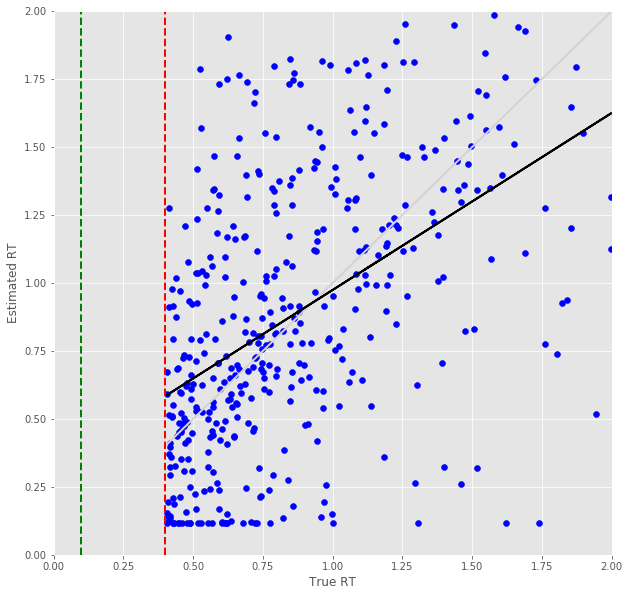

Error Prediction Score: 0.6372 RMSE
RT Prediction Score: 0.6476 RMSE
Error Prediction Corr: 0.6412
RT Prediction Corr: 0.2362
R^2 score for regression on Error: 0.4112
k = 0.9787


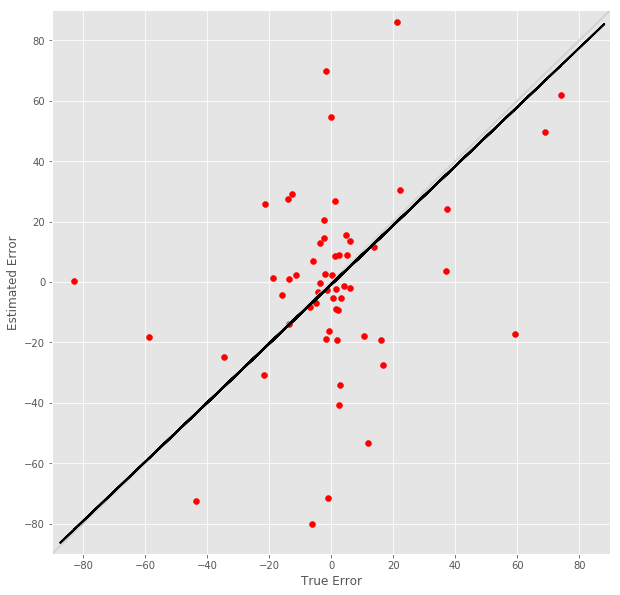

R^2 score for regression on RT: 0.0558
k = 0.2869


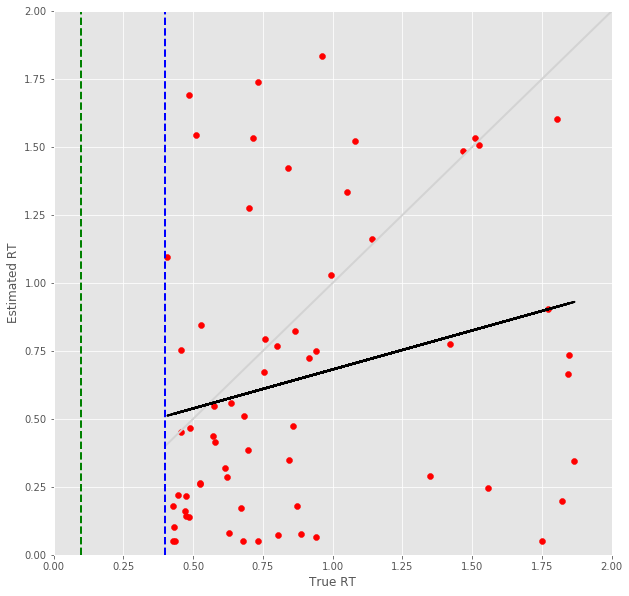

20 -step(s) forecast:
Test Score for 20 -steps forecast: 2.8404 RMSE
Predict Score for 20 -steps forecast: 2.3710 RMSE
Error Test Score for 20 -steps forecast: 0.4227 RMSE
RT Test Score for 20 -steps forecast: 0.4734 RMSE
Error Test Corr for 20 -steps forecast: 0.7674
RT Test Corr for 20 -steps forecast: 0.4489


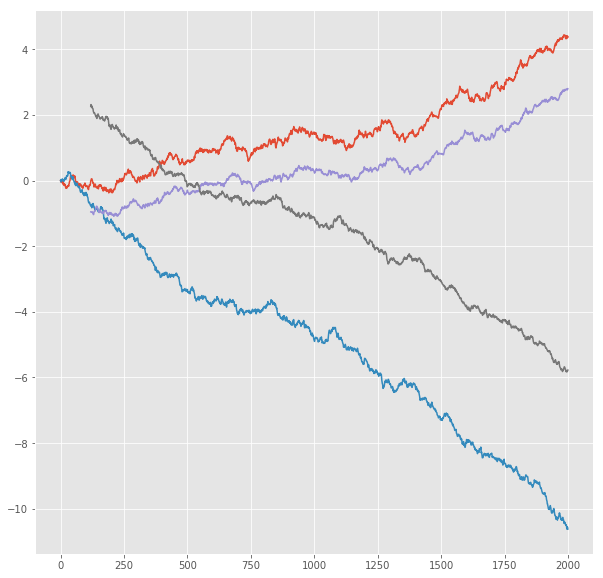

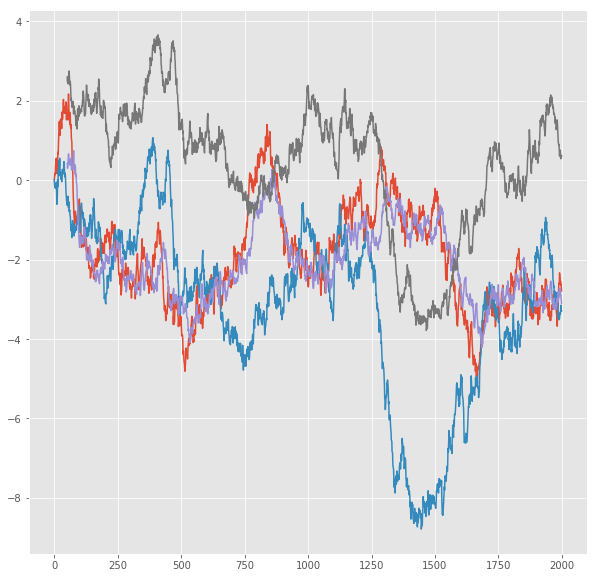

R^2 score for regression on Error: 0.5890
k = 0.9728


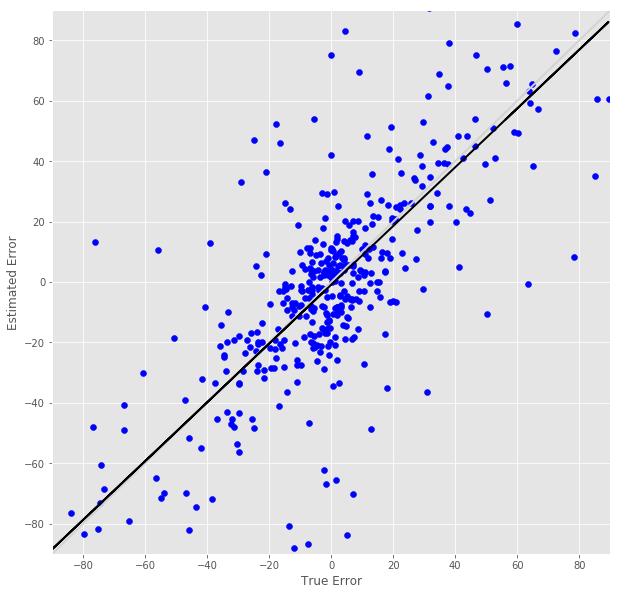

R^2 score for regression on RT: 0.2015
k = 0.6194


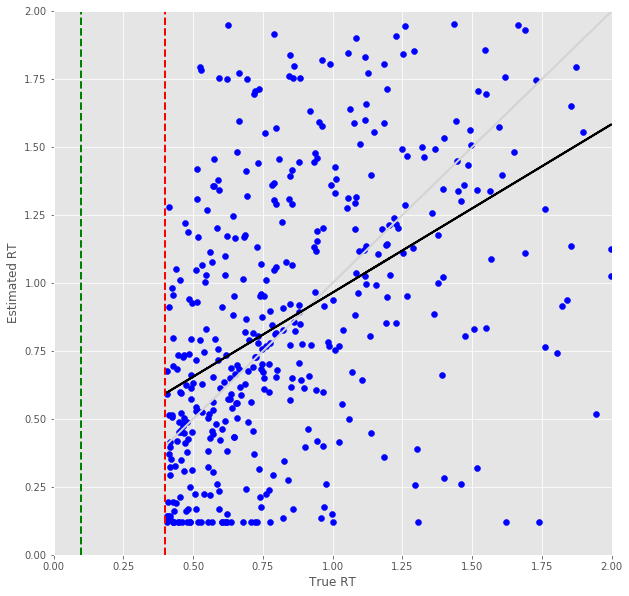

Error Prediction Score: 0.6479 RMSE
RT Prediction Score: 0.6548 RMSE
Error Prediction Corr: 0.6348
RT Prediction Corr: 0.2211
R^2 score for regression on Error: 0.4029
k = 0.9915


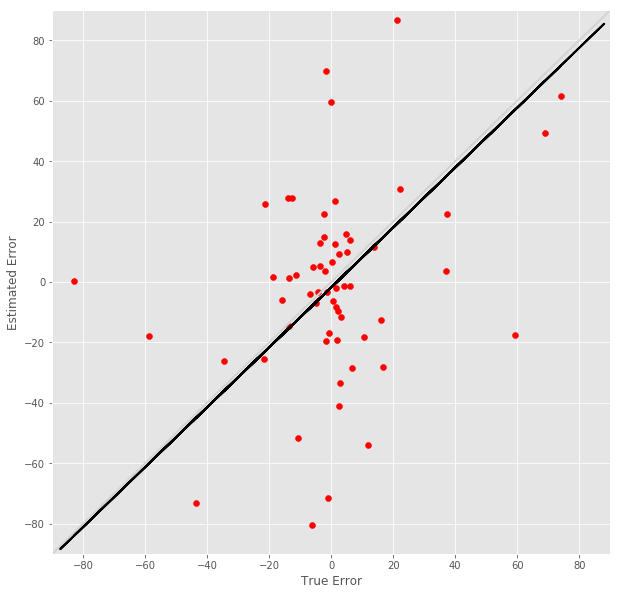

R^2 score for regression on RT: 0.0489
k = 0.2752


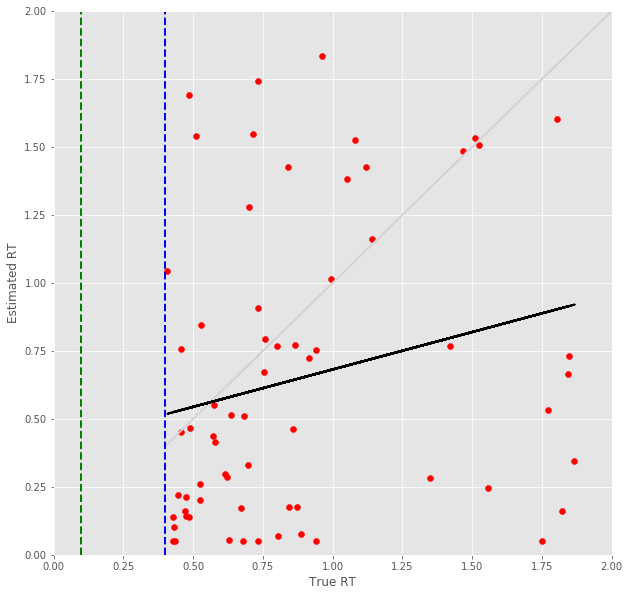

21 -step(s) forecast:
Test Score for 21 -steps forecast: 2.9507 RMSE
Predict Score for 21 -steps forecast: 2.4690 RMSE
Error Test Score for 21 -steps forecast: 0.4483 RMSE
RT Test Score for 21 -steps forecast: 0.5011 RMSE
Error Test Corr for 21 -steps forecast: 0.7537
RT Test Corr for 21 -steps forecast: 0.4047


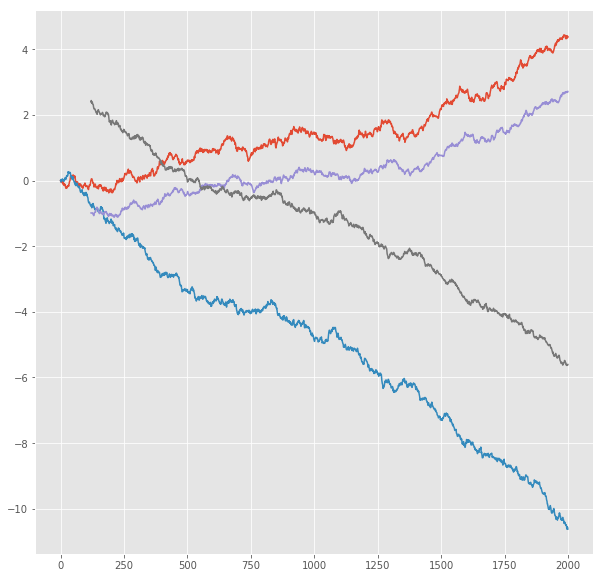

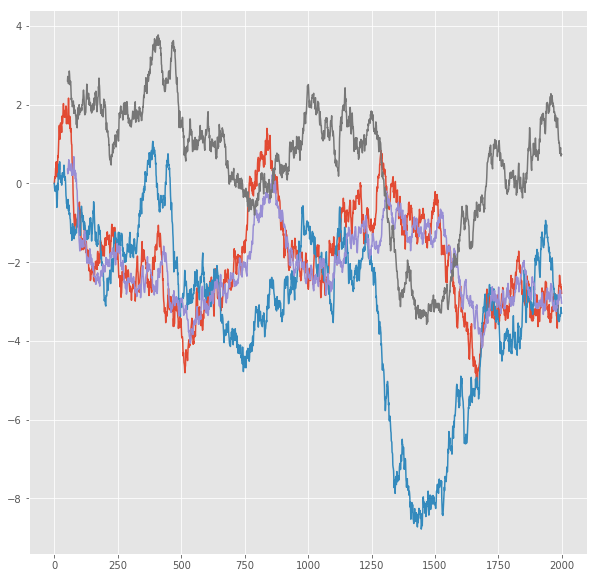

R^2 score for regression on Error: 0.5680
k = 0.9889


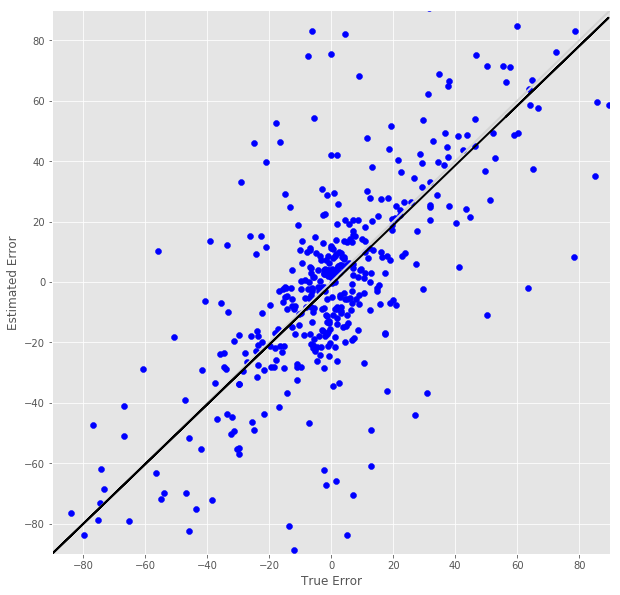

R^2 score for regression on RT: 0.1638
k = 0.5782


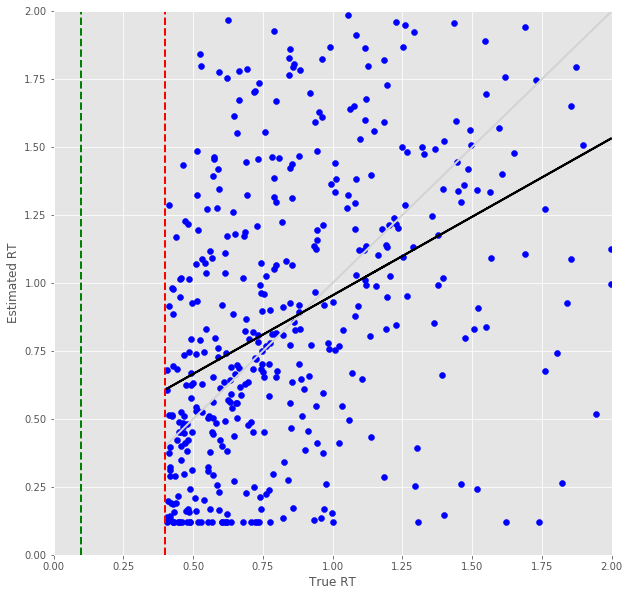

Error Prediction Score: 0.6517 RMSE
RT Prediction Score: 0.7011 RMSE
Error Prediction Corr: 0.6293
RT Prediction Corr: 0.1686
R^2 score for regression on Error: 0.3960
k = 0.9836


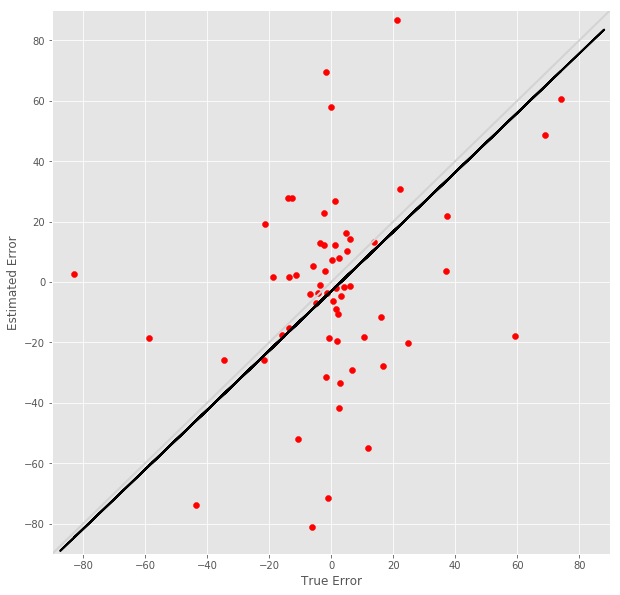

R^2 score for regression on RT: 0.0284
k = 0.2037


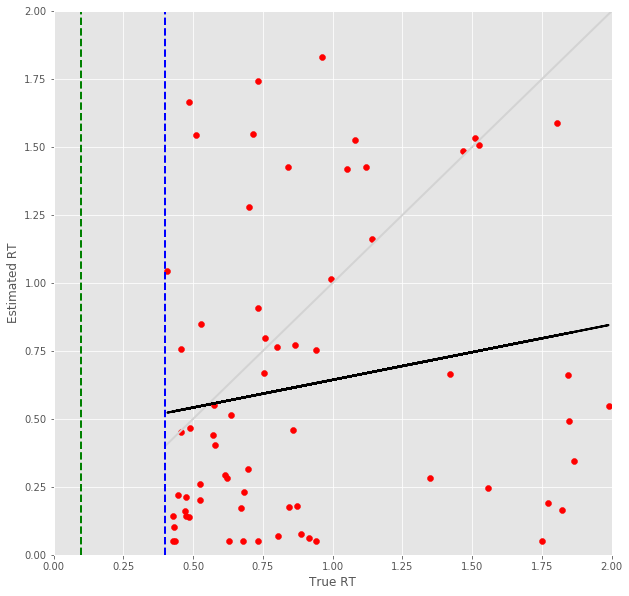

22 -step(s) forecast:
Test Score for 22 -steps forecast: 3.0593 RMSE
Predict Score for 22 -steps forecast: 2.5659 RMSE
Error Test Score for 22 -steps forecast: 0.4584 RMSE
RT Test Score for 22 -steps forecast: 0.5089 RMSE
Error Test Corr for 22 -steps forecast: 0.7469
RT Test Corr for 22 -steps forecast: 0.3876


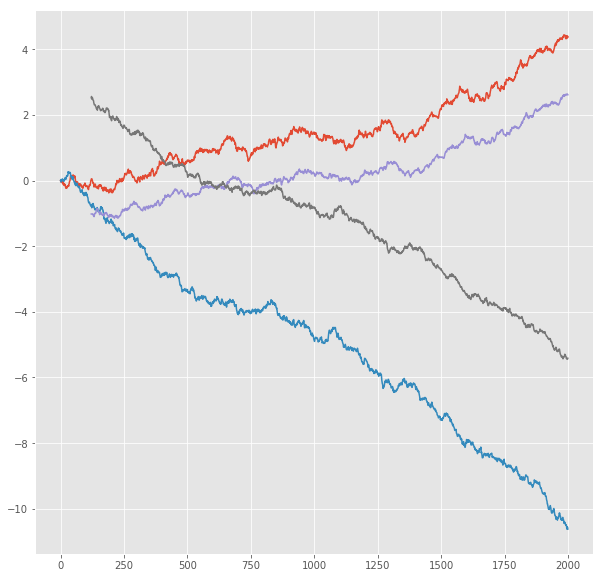

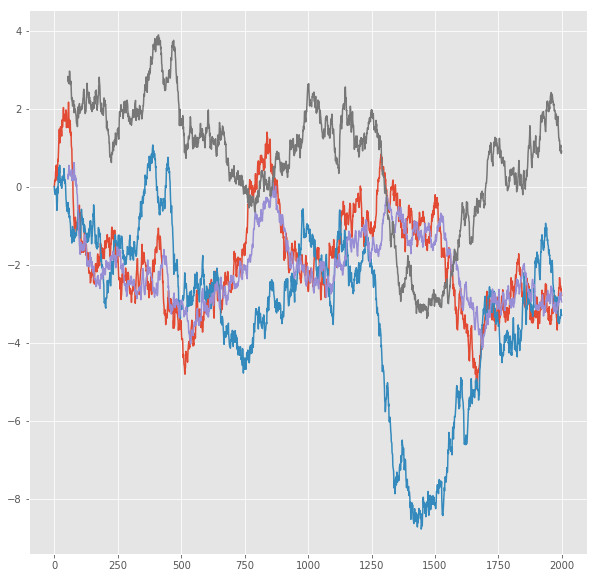

R^2 score for regression on Error: 0.5578
k = 0.9876


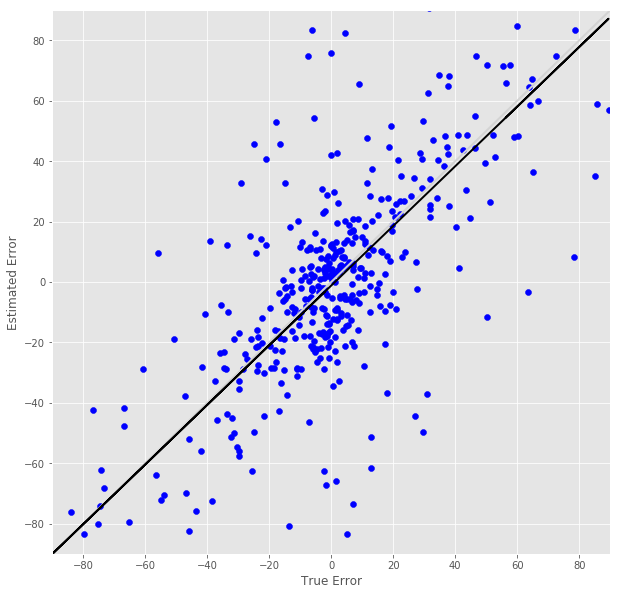

R^2 score for regression on RT: 0.1502
k = 0.5554


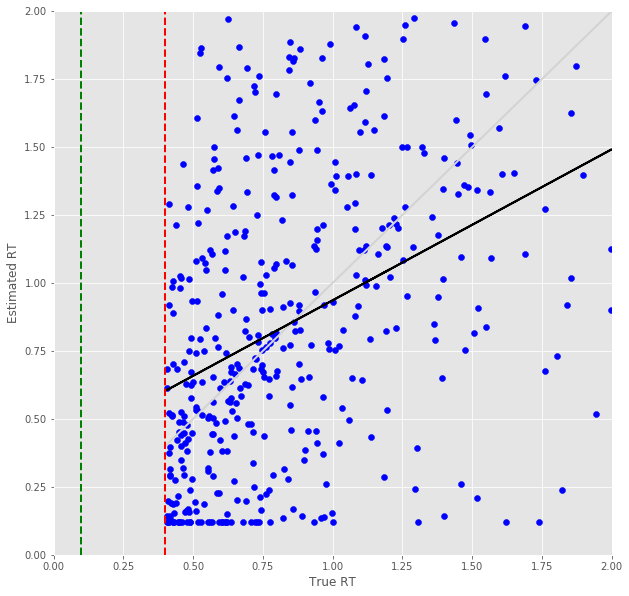

Error Prediction Score: 0.6526 RMSE
RT Prediction Score: 0.7041 RMSE
Error Prediction Corr: 0.6282
RT Prediction Corr: 0.1695
R^2 score for regression on Error: 0.3946
k = 0.9823


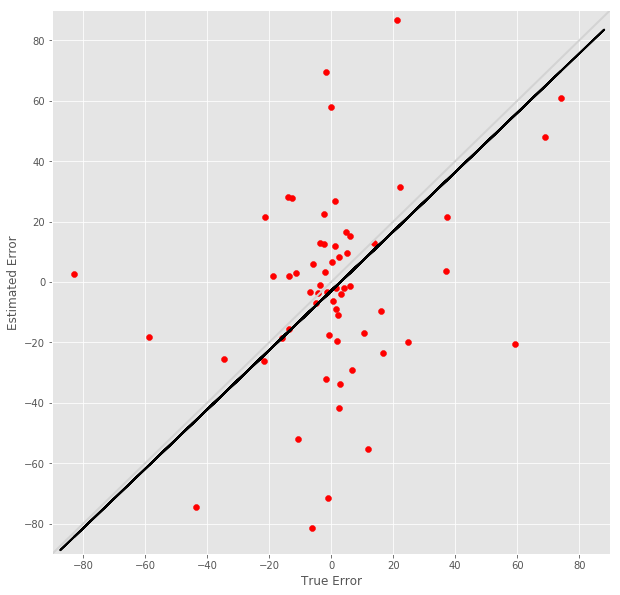

R^2 score for regression on RT: 0.0287
k = 0.2063


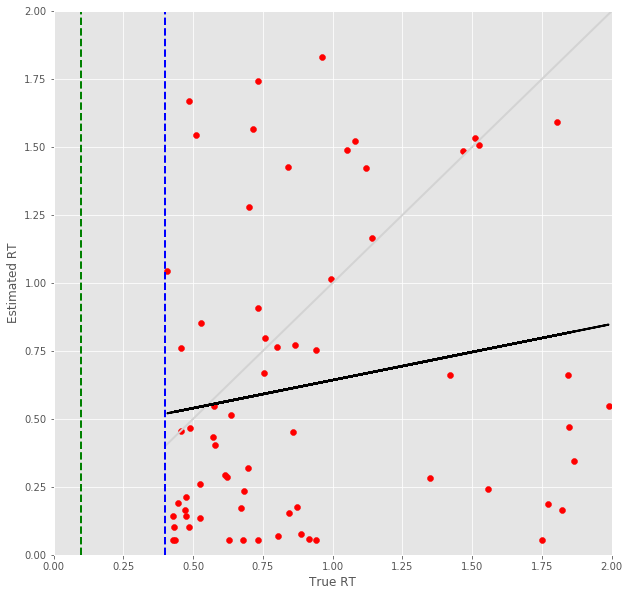

23 -step(s) forecast:
Test Score for 23 -steps forecast: 3.1662 RMSE
Predict Score for 23 -steps forecast: 2.6617 RMSE
Error Test Score for 23 -steps forecast: 0.4659 RMSE
RT Test Score for 23 -steps forecast: 0.5272 RMSE
Error Test Corr for 23 -steps forecast: 0.7401
RT Test Corr for 23 -steps forecast: 0.3575


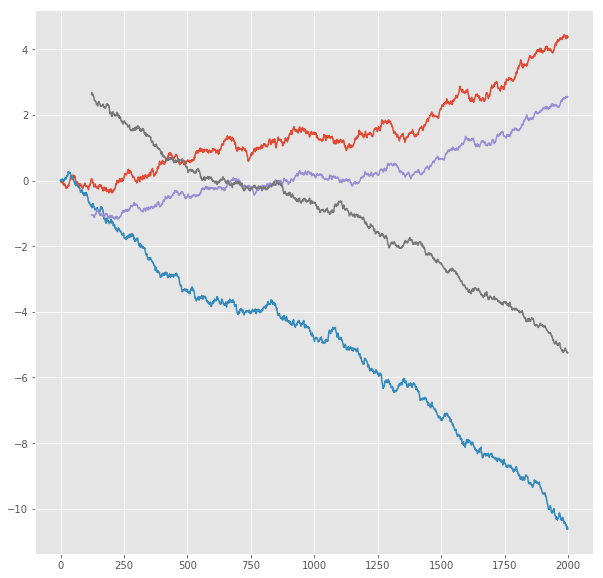

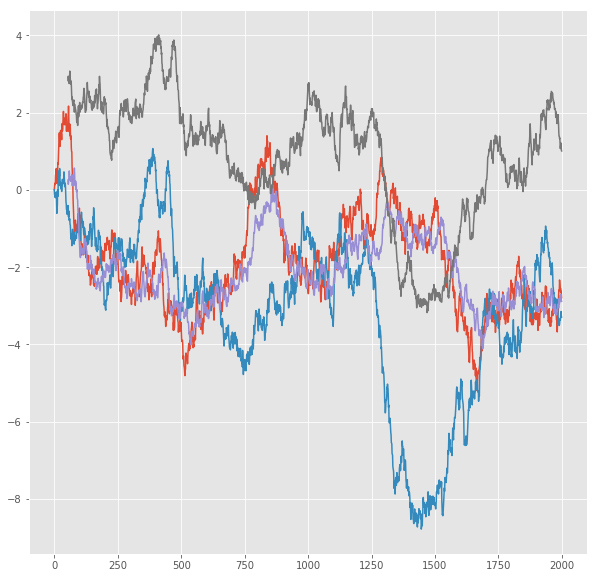

R^2 score for regression on Error: 0.5477
k = 0.9892


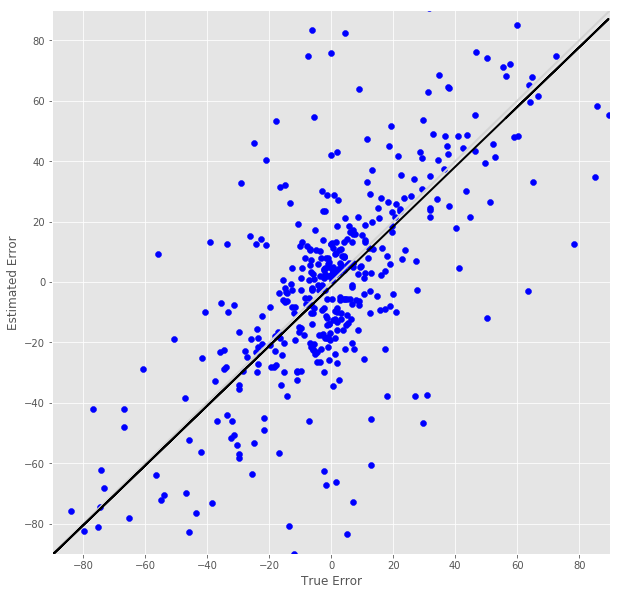

R^2 score for regression on RT: 0.1278
k = 0.5213


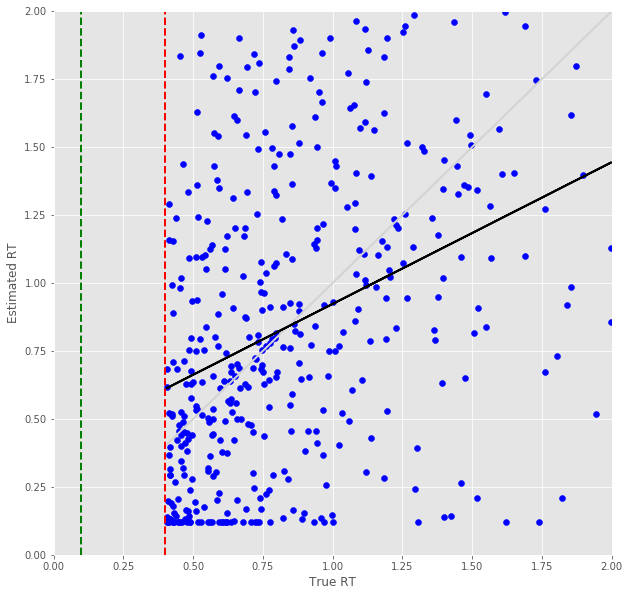

Error Prediction Score: 0.6590 RMSE
RT Prediction Score: 0.7376 RMSE
Error Prediction Corr: 0.6379
RT Prediction Corr: 0.0927
R^2 score for regression on Error: 0.4070
k = 1.0132


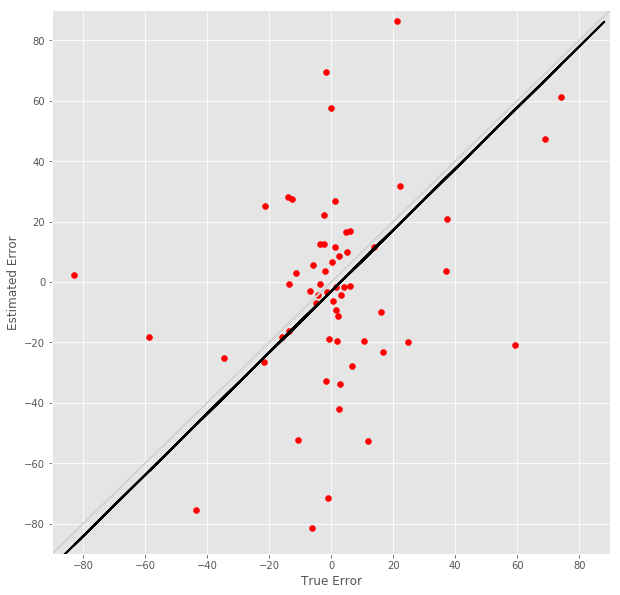

R^2 score for regression on RT: 0.0086
k = 0.1096


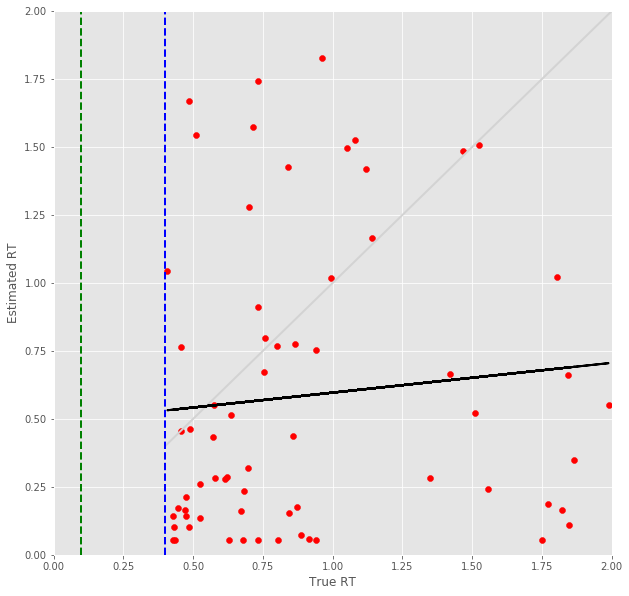

24 -step(s) forecast:
Test Score for 24 -steps forecast: 3.2717 RMSE
Predict Score for 24 -steps forecast: 2.7565 RMSE
Error Test Score for 24 -steps forecast: 0.4837 RMSE
RT Test Score for 24 -steps forecast: 0.5343 RMSE
Error Test Corr for 24 -steps forecast: 0.7309
RT Test Corr for 24 -steps forecast: 0.3428


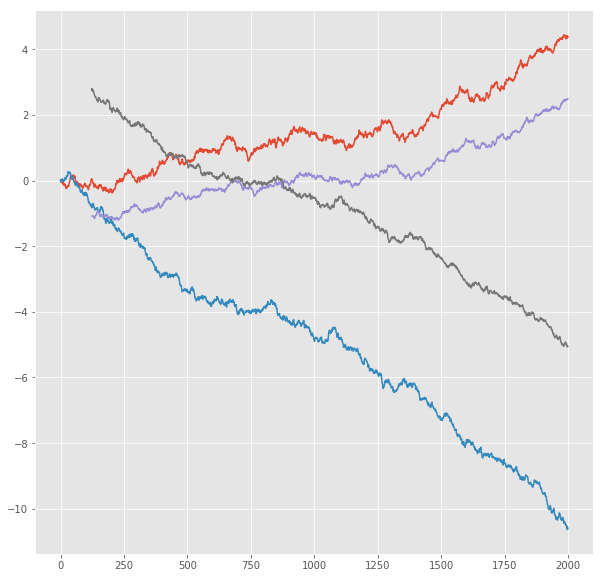

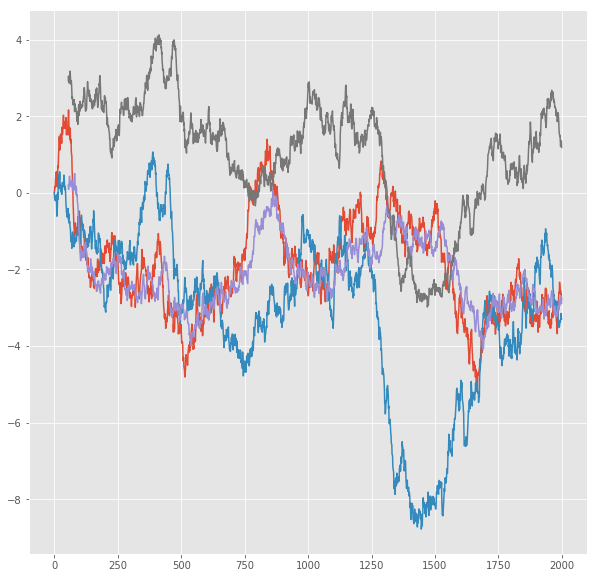

R^2 score for regression on Error: 0.5342
k = 0.9951


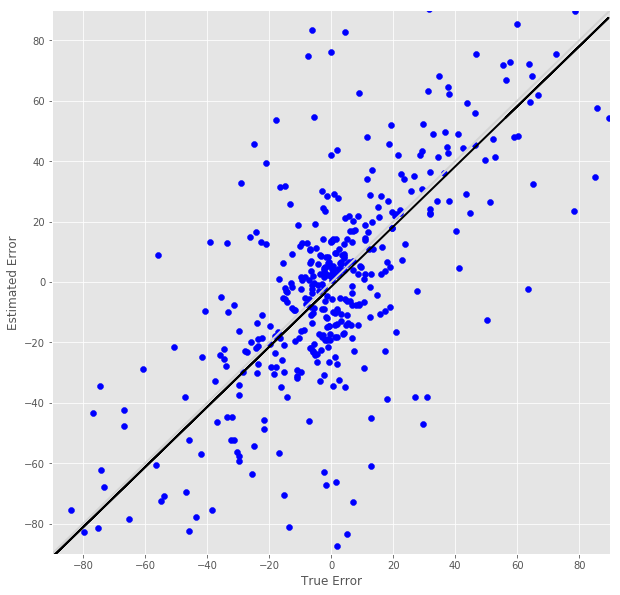

R^2 score for regression on RT: 0.1175
k = 0.5025


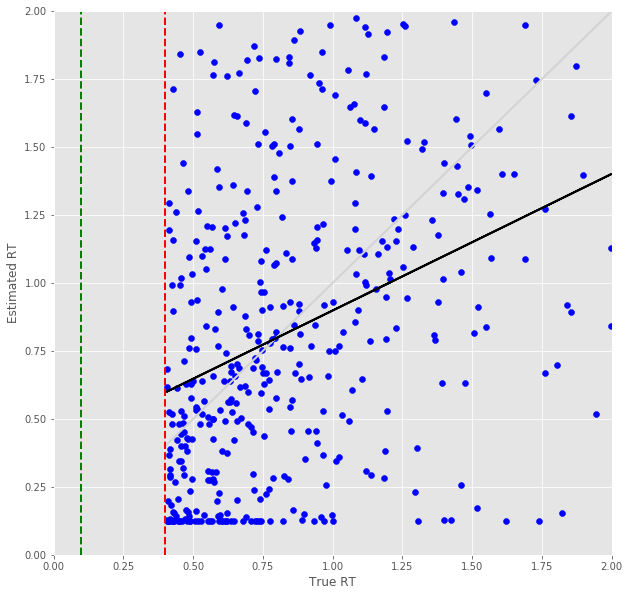

Error Prediction Score: 0.6679 RMSE
RT Prediction Score: 0.7500 RMSE
Error Prediction Corr: 0.6353
RT Prediction Corr: 0.0721
R^2 score for regression on Error: 0.4036
k = 1.0121


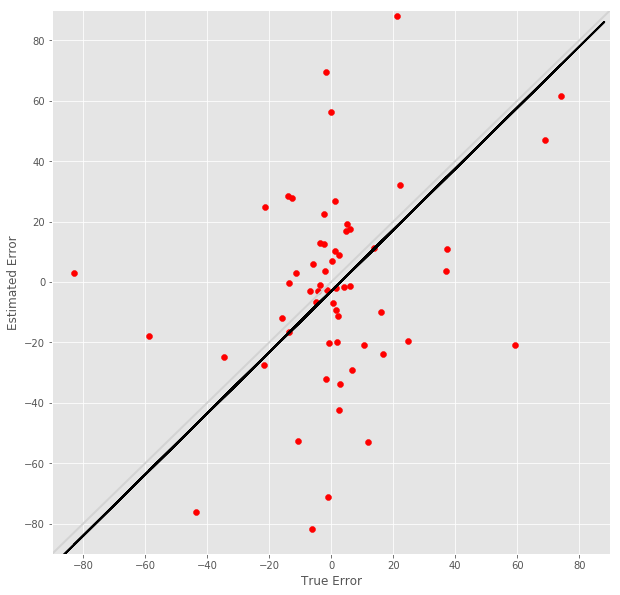

R^2 score for regression on RT: 0.0052
k = 0.0827


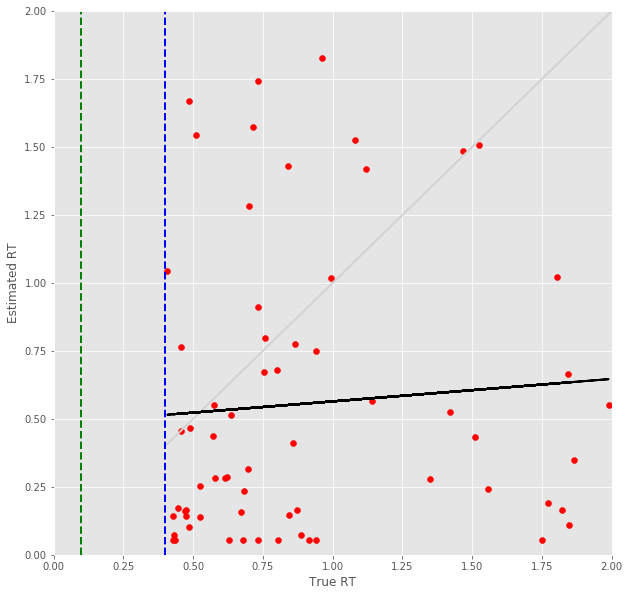

25 -step(s) forecast:
Test Score for 25 -steps forecast: 3.3756 RMSE
Predict Score for 25 -steps forecast: 2.8502 RMSE
Error Test Score for 25 -steps forecast: 0.4899 RMSE
RT Test Score for 25 -steps forecast: 0.5391 RMSE
Error Test Corr for 25 -steps forecast: 0.7268
RT Test Corr for 25 -steps forecast: 0.3304


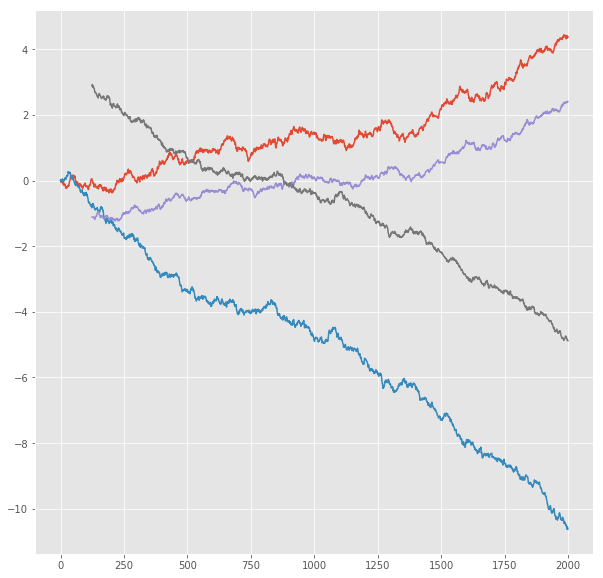

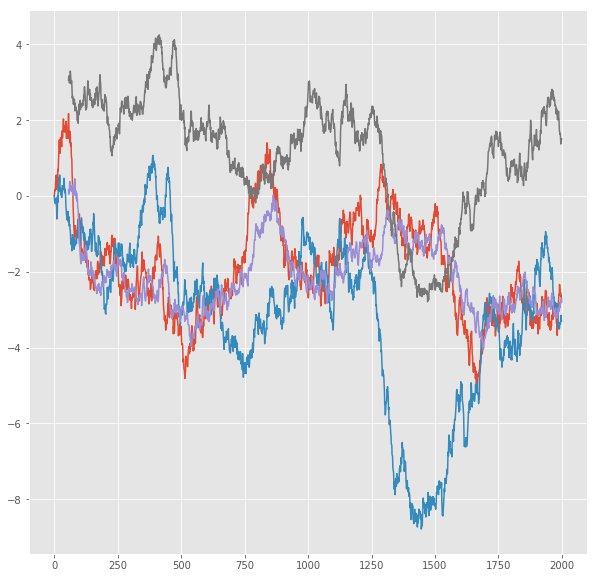

R^2 score for regression on Error: 0.5282
k = 0.9948


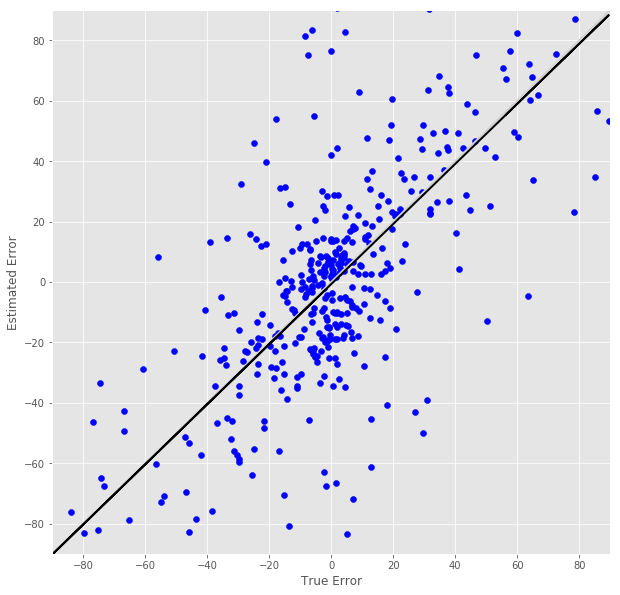

R^2 score for regression on RT: 0.1092
k = 0.4812


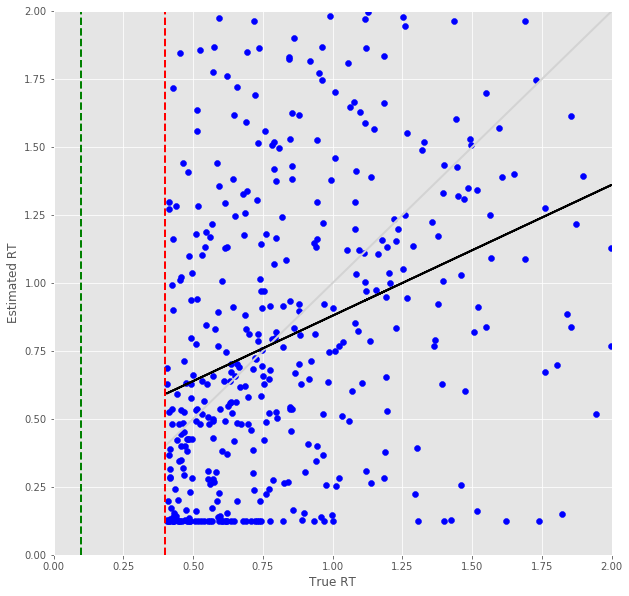

Error Prediction Score: 0.6870 RMSE
RT Prediction Score: 0.7590 RMSE
Error Prediction Corr: 0.6112
RT Prediction Corr: 0.0580
R^2 score for regression on Error: 0.3735
k = 0.9819


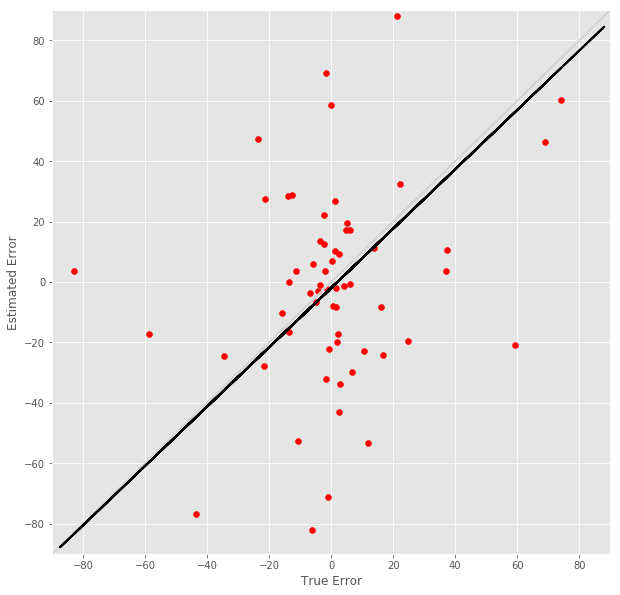

R^2 score for regression on RT: 0.0034
k = 0.0685


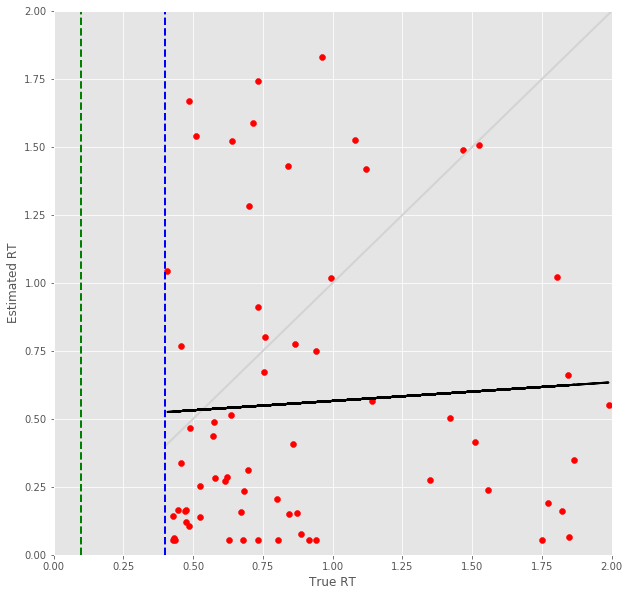

26 -step(s) forecast:
Test Score for 26 -steps forecast: 3.4782 RMSE
Predict Score for 26 -steps forecast: 2.9430 RMSE
Error Test Score for 26 -steps forecast: 0.4980 RMSE
RT Test Score for 26 -steps forecast: 0.5483 RMSE
Error Test Corr for 26 -steps forecast: 0.7231
RT Test Corr for 26 -steps forecast: 0.3169


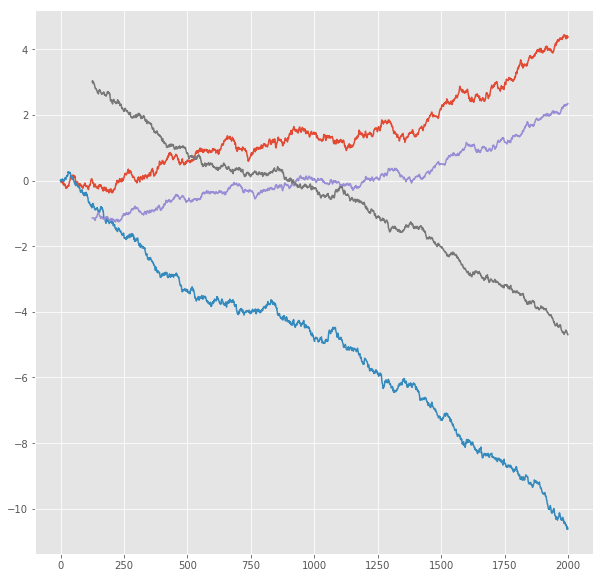

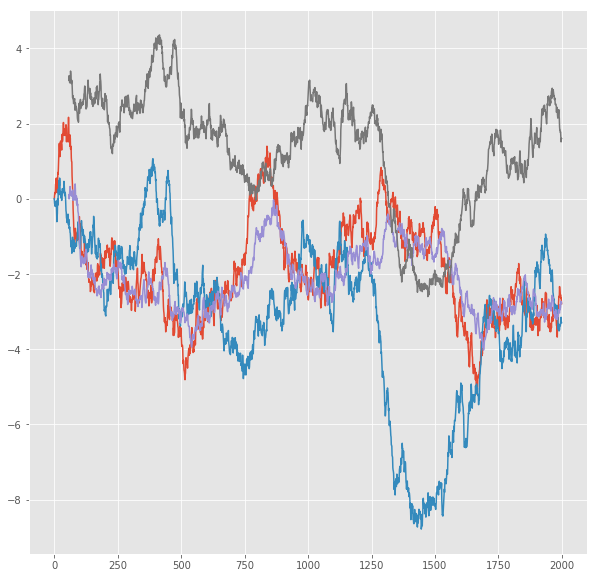

R^2 score for regression on Error: 0.5229
k = 0.9972


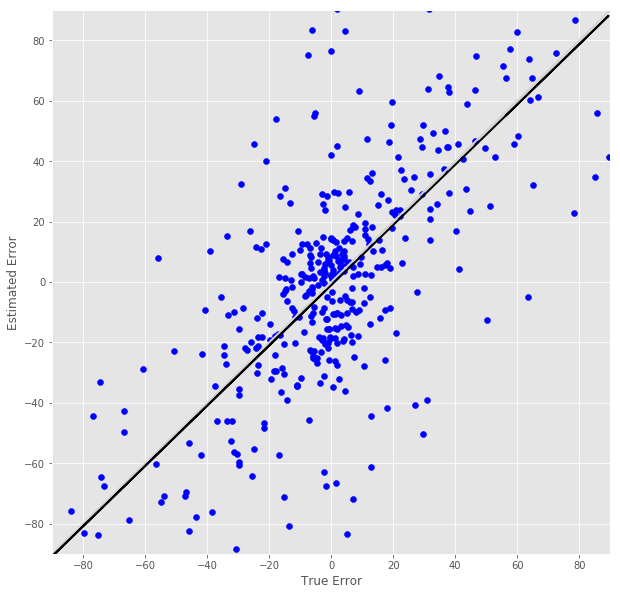

R^2 score for regression on RT: 0.1004
k = 0.4639


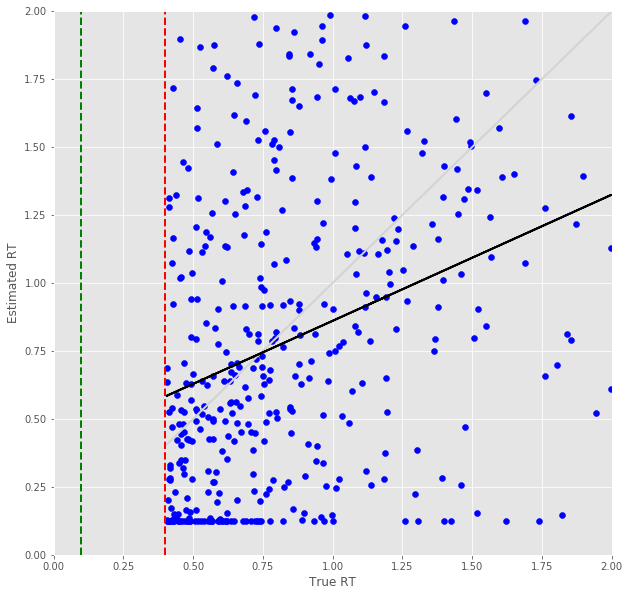

Error Prediction Score: 0.7118 RMSE
RT Prediction Score: 0.7333 RMSE
Error Prediction Corr: 0.5279
RT Prediction Corr: 0.1149
R^2 score for regression on Error: 0.2787
k = 0.8174


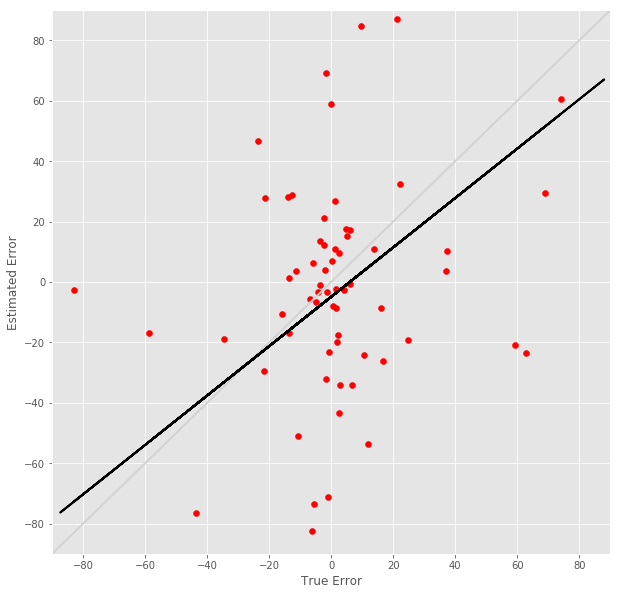

R^2 score for regression on RT: 0.0132
k = 0.1221


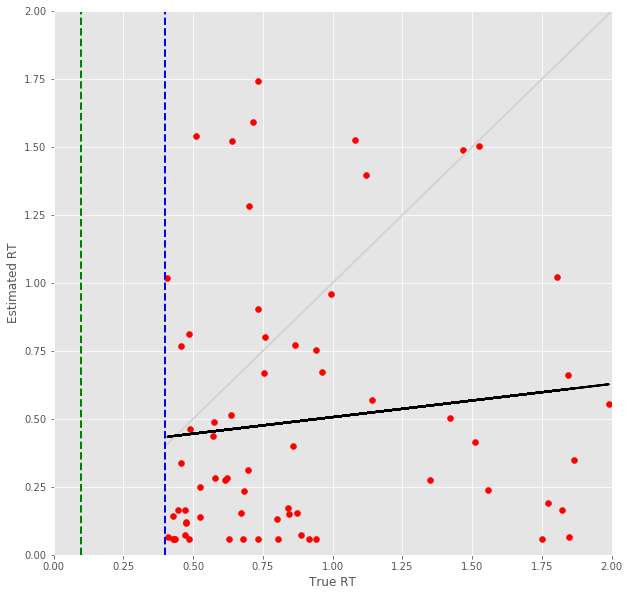

27 -step(s) forecast:
Test Score for 27 -steps forecast: 3.5794 RMSE
Predict Score for 27 -steps forecast: 3.0348 RMSE
Error Test Score for 27 -steps forecast: 0.5171 RMSE
RT Test Score for 27 -steps forecast: 0.5631 RMSE
Error Test Corr for 27 -steps forecast: 0.7176
RT Test Corr for 27 -steps forecast: 0.2889


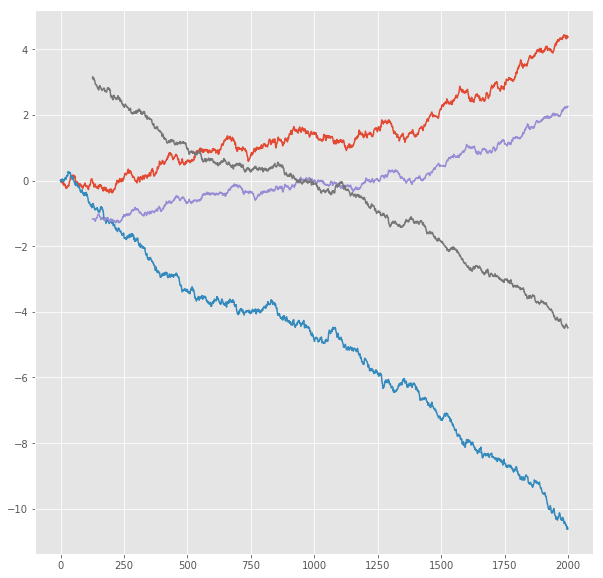

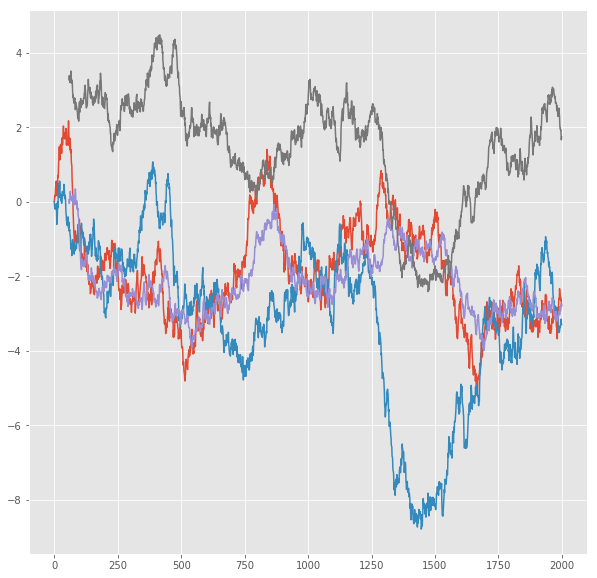

R^2 score for regression on Error: 0.5150
k = 1.0106


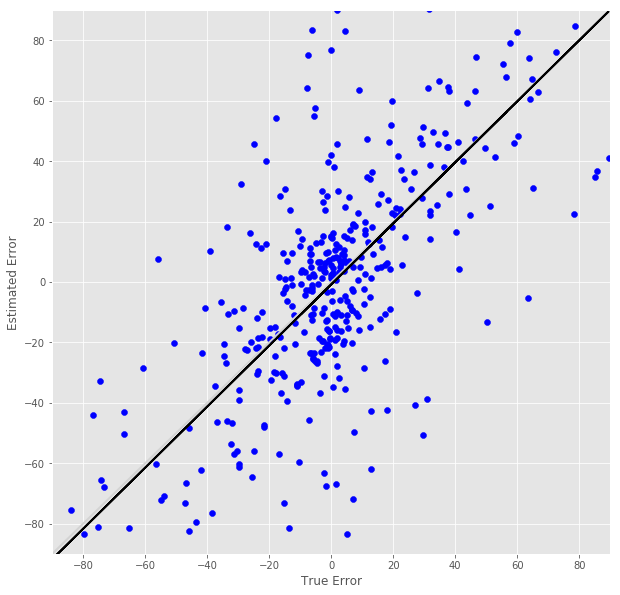

R^2 score for regression on RT: 0.0835
k = 0.4236


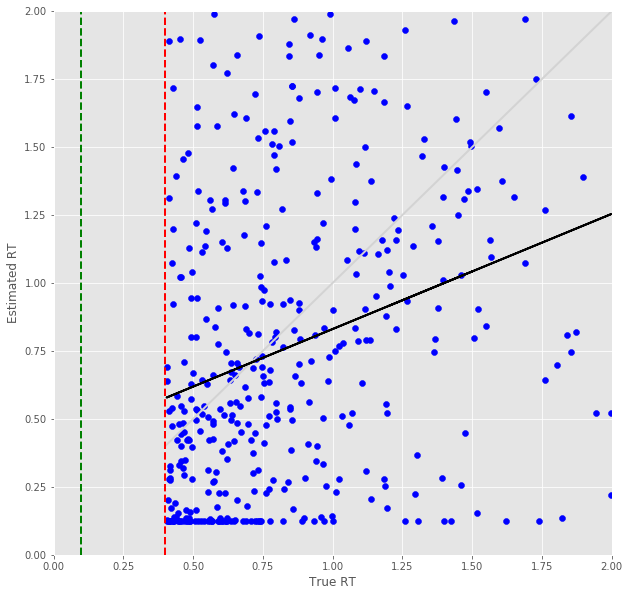

Error Prediction Score: 0.7304 RMSE
RT Prediction Score: 0.7328 RMSE
Error Prediction Corr: 0.5688
RT Prediction Corr: 0.1556
R^2 score for regression on Error: 0.3235
k = 0.9421


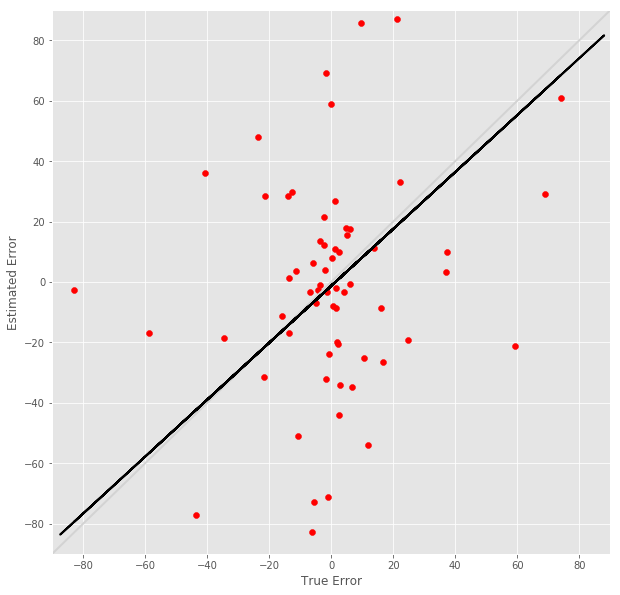

R^2 score for regression on RT: 0.0242
k = 0.1629


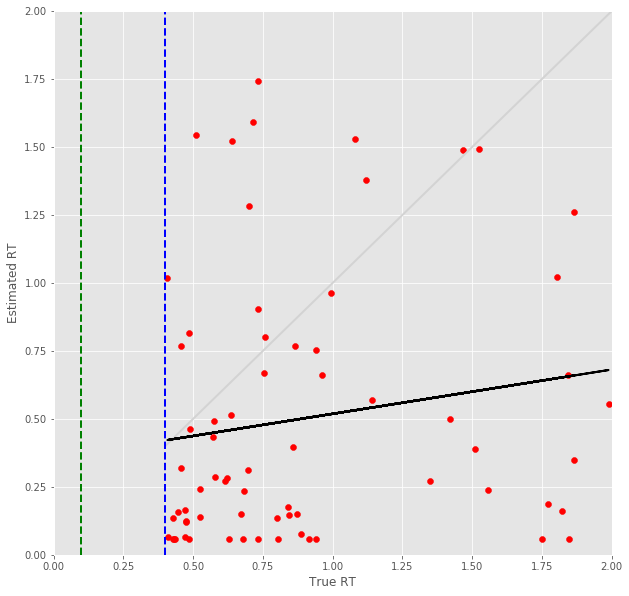

28 -step(s) forecast:
Test Score for 28 -steps forecast: 3.6794 RMSE
Predict Score for 28 -steps forecast: 3.1258 RMSE
Error Test Score for 28 -steps forecast: 0.5364 RMSE
RT Test Score for 28 -steps forecast: 0.5686 RMSE
Error Test Corr for 28 -steps forecast: 0.7009
RT Test Corr for 28 -steps forecast: 0.2886


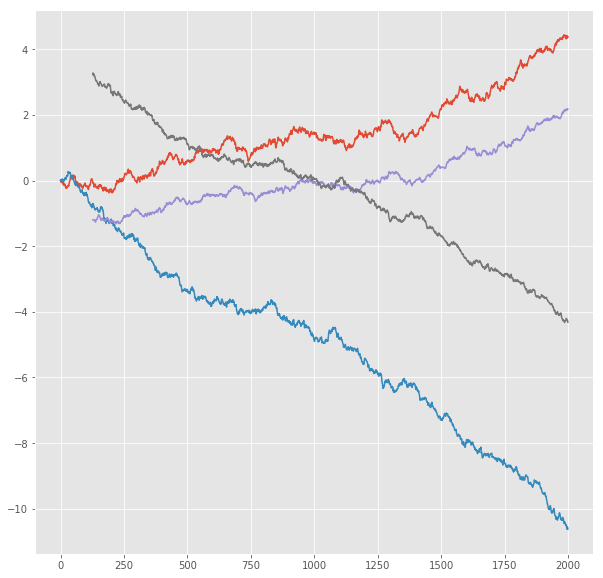

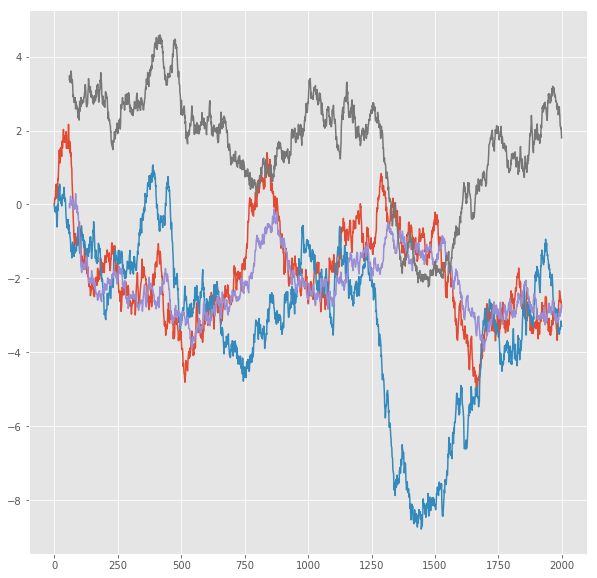

R^2 score for regression on Error: 0.4913
k = 0.9993


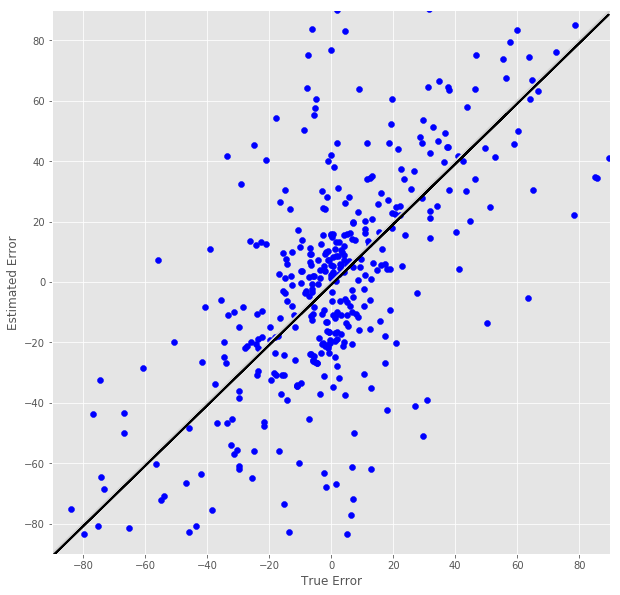

R^2 score for regression on RT: 0.0833
k = 0.4240


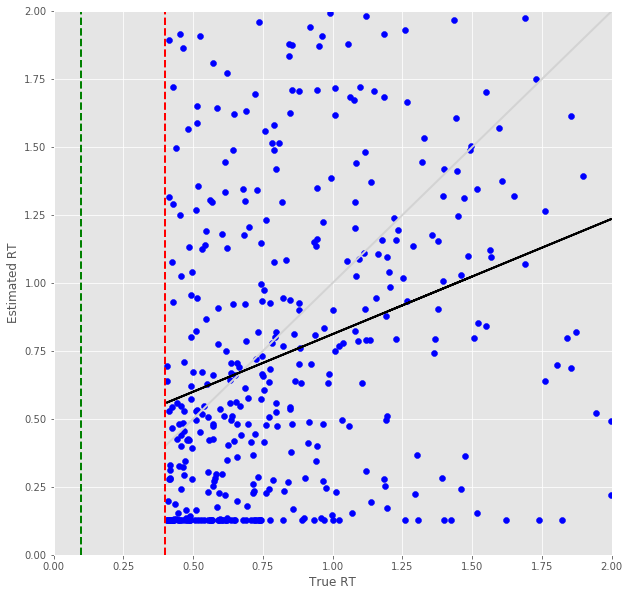

Error Prediction Score: 0.7340 RMSE
RT Prediction Score: 0.7334 RMSE
Error Prediction Corr: 0.5173
RT Prediction Corr: 0.1499
R^2 score for regression on Error: 0.2676
k = 0.8214


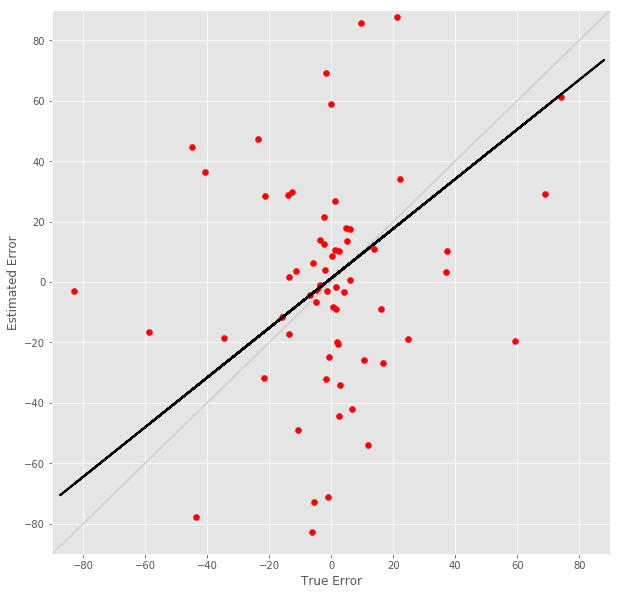

R^2 score for regression on RT: 0.0225
k = 0.1520


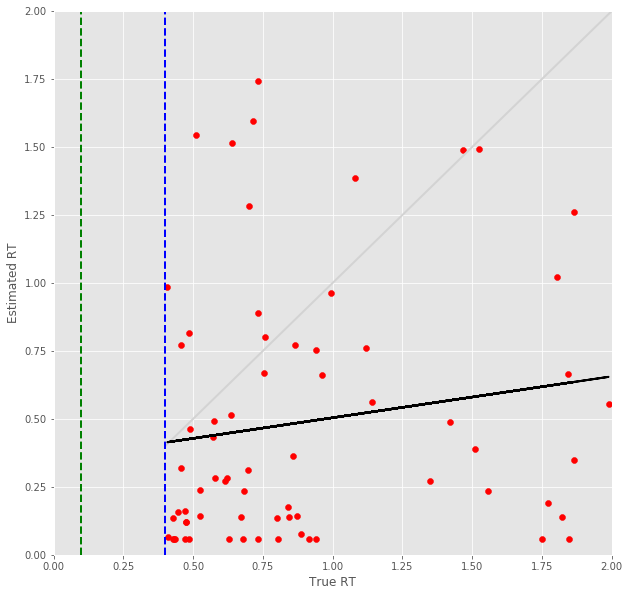

29 -step(s) forecast:
Test Score for 29 -steps forecast: 3.7781 RMSE
Predict Score for 29 -steps forecast: 3.2158 RMSE
Error Test Score for 29 -steps forecast: 0.5514 RMSE
RT Test Score for 29 -steps forecast: 0.5737 RMSE
Error Test Corr for 29 -steps forecast: 0.6927
RT Test Corr for 29 -steps forecast: 0.2840


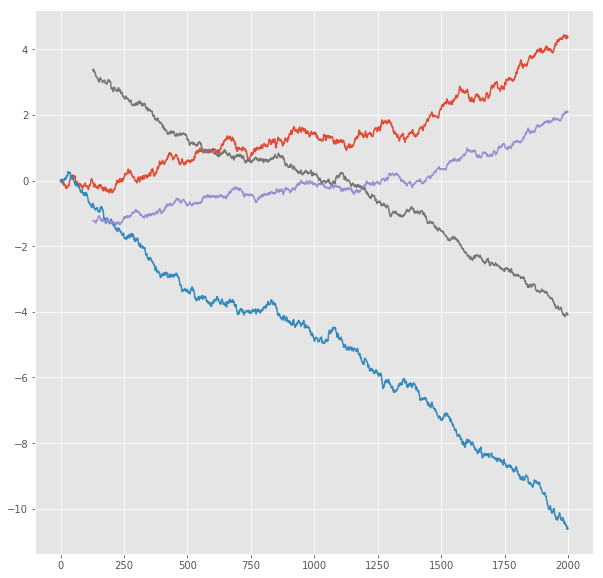

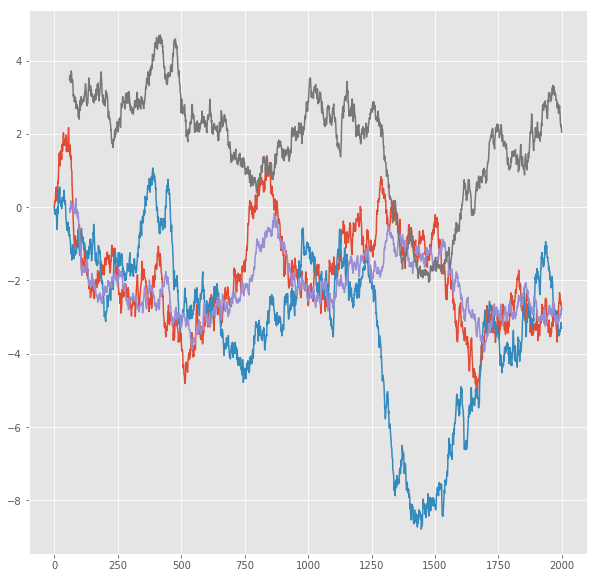

R^2 score for regression on Error: 0.4798
k = 1.0003


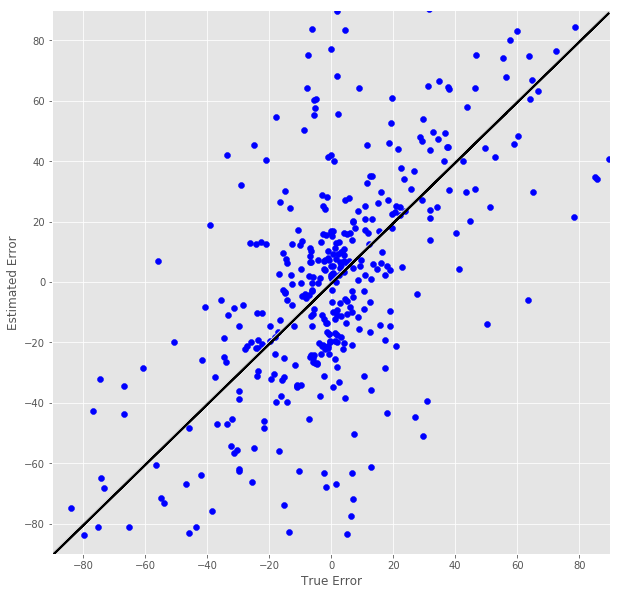

R^2 score for regression on RT: 0.0807
k = 0.4124


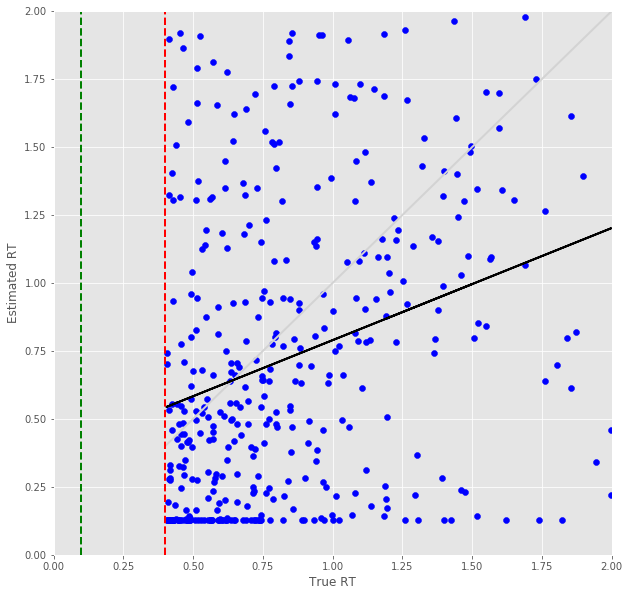

Error Prediction Score: 0.7362 RMSE
RT Prediction Score: 0.7321 RMSE
Error Prediction Corr: 0.5599
RT Prediction Corr: 0.1523
R^2 score for regression on Error: 0.3134
k = 0.9347


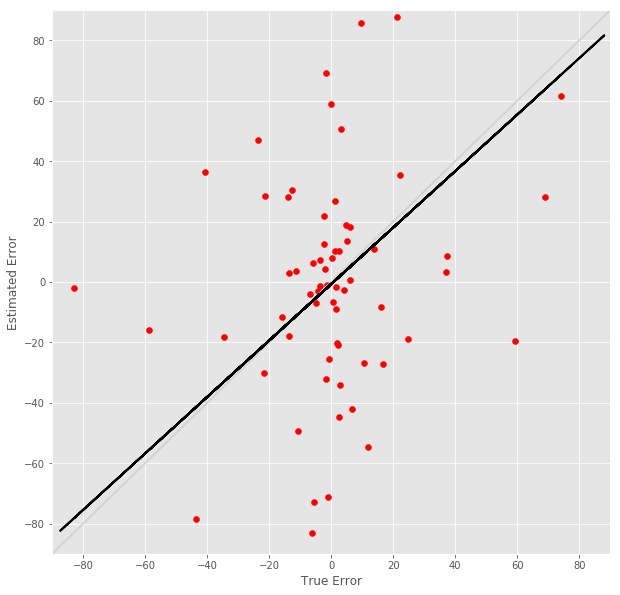

R^2 score for regression on RT: 0.0232
k = 0.1548


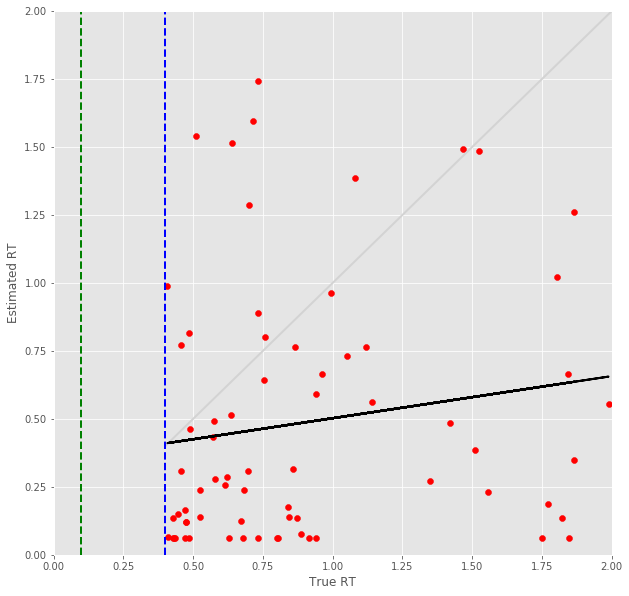

30 -step(s) forecast:
Test Score for 30 -steps forecast: 3.8756 RMSE
Predict Score for 30 -steps forecast: 3.3050 RMSE
Error Test Score for 30 -steps forecast: 0.5628 RMSE
RT Test Score for 30 -steps forecast: 0.5850 RMSE
Error Test Corr for 30 -steps forecast: 0.6768
RT Test Corr for 30 -steps forecast: 0.2693


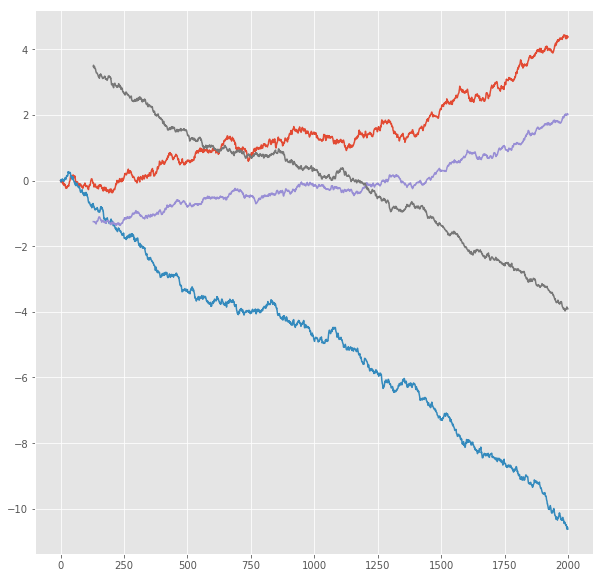

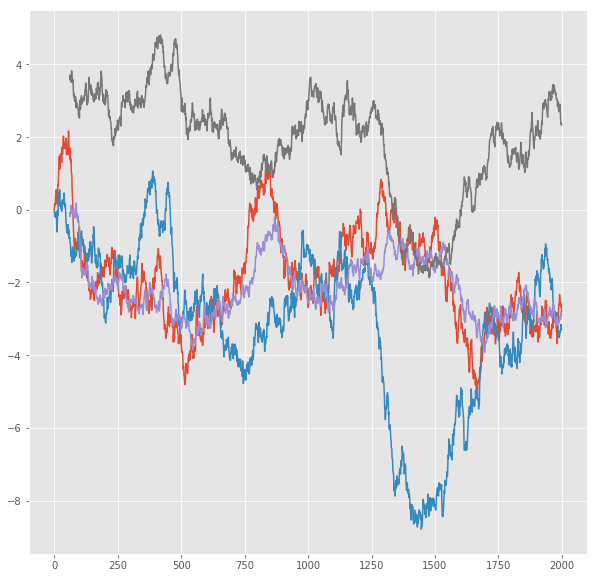

R^2 score for regression on Error: 0.4581
k = 0.9742


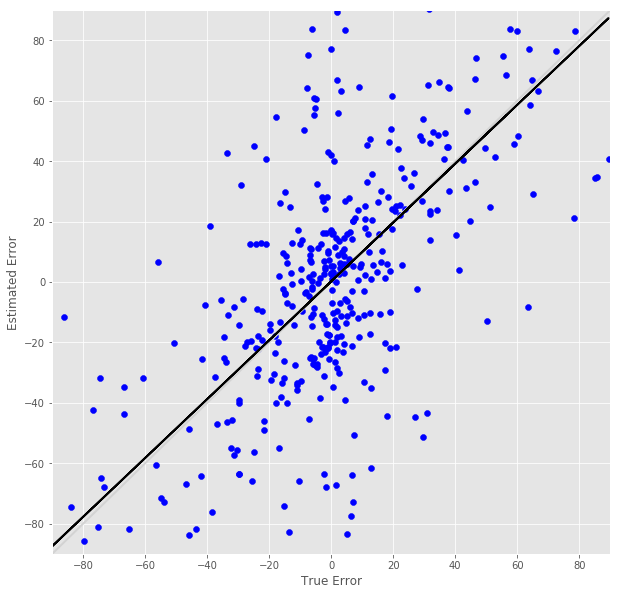

R^2 score for regression on RT: 0.0725
k = 0.3831


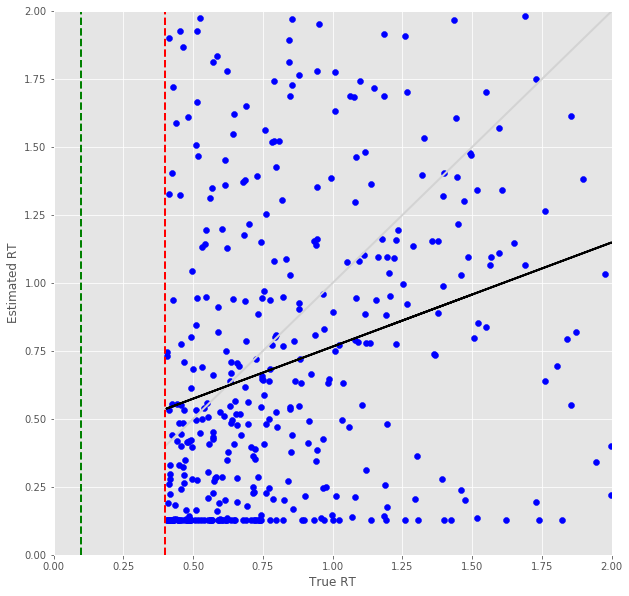

Error Prediction Score: 0.7425 RMSE
RT Prediction Score: 0.7397 RMSE
Error Prediction Corr: 0.4846
RT Prediction Corr: 0.1346
R^2 score for regression on Error: 0.2349
k = 0.7600


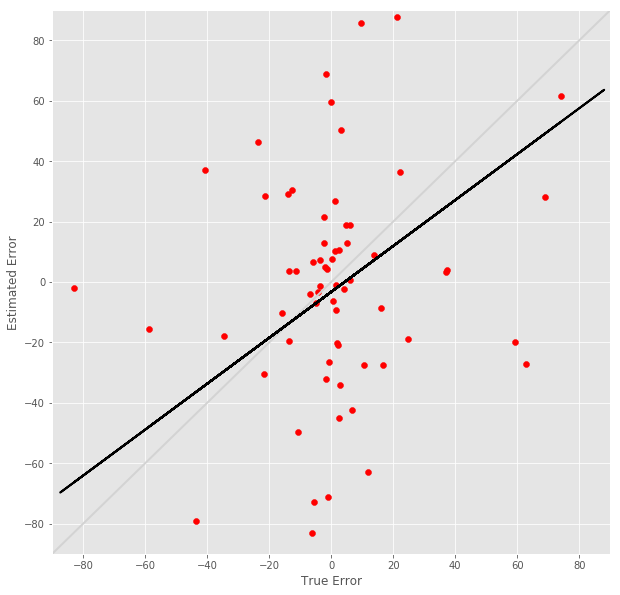

R^2 score for regression on RT: 0.0181
k = 0.1335


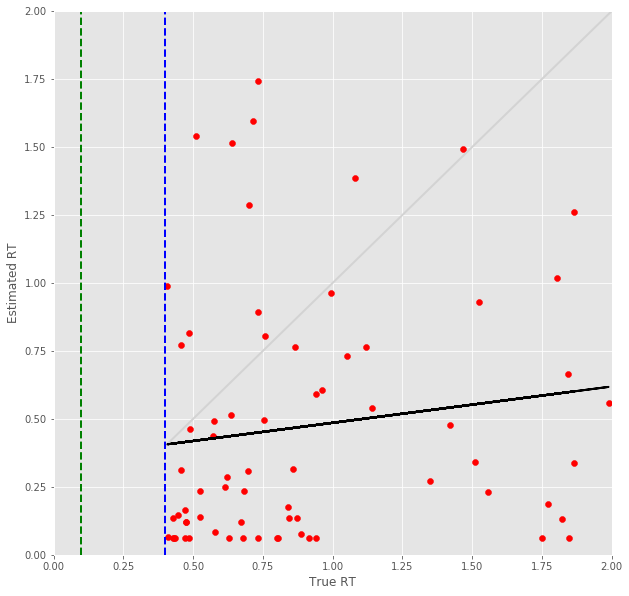

31 -step(s) forecast:
Test Score for 31 -steps forecast: 3.9720 RMSE
Predict Score for 31 -steps forecast: 3.3933 RMSE
Error Test Score for 31 -steps forecast: 0.5743 RMSE
RT Test Score for 31 -steps forecast: 0.5976 RMSE
Error Test Corr for 31 -steps forecast: 0.6688
RT Test Corr for 31 -steps forecast: 0.2502


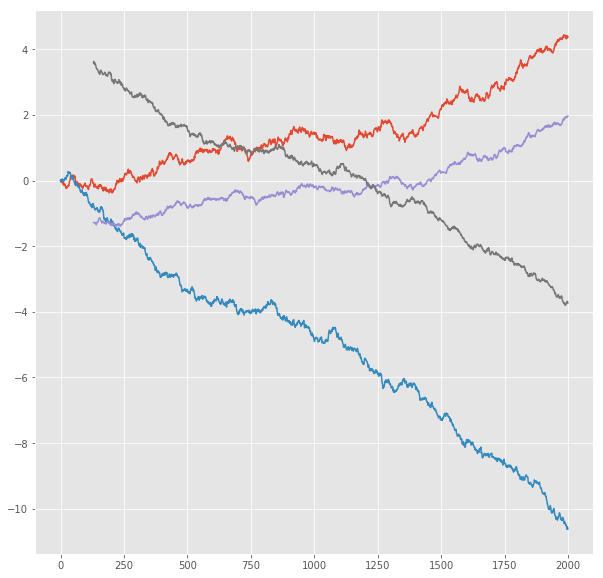

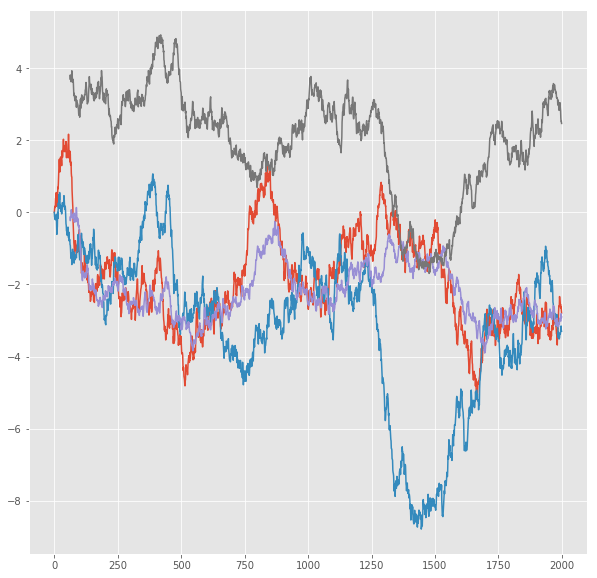

R^2 score for regression on Error: 0.4473
k = 0.9716


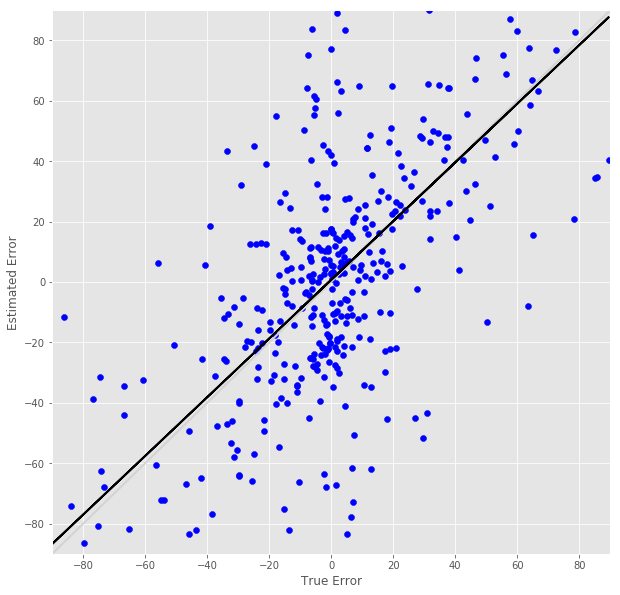

R^2 score for regression on RT: 0.0626
k = 0.3523


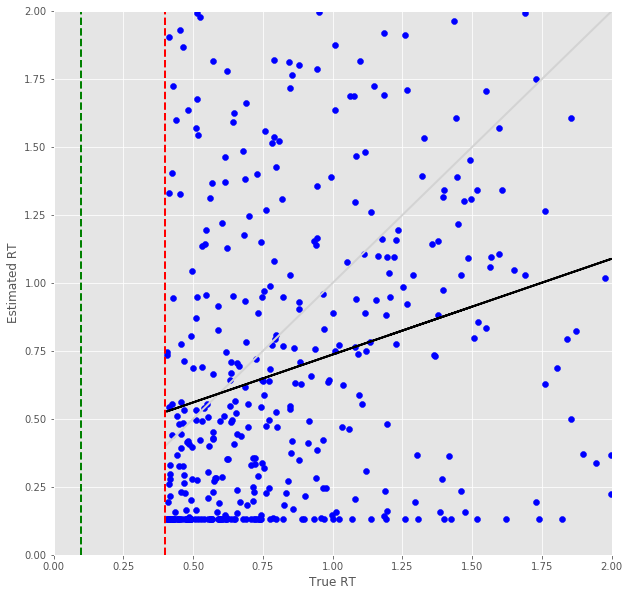

Error Prediction Score: 0.7521 RMSE
RT Prediction Score: 0.7471 RMSE
Error Prediction Corr: 0.4816
RT Prediction Corr: 0.1234
R^2 score for regression on Error: 0.2319
k = 0.7643


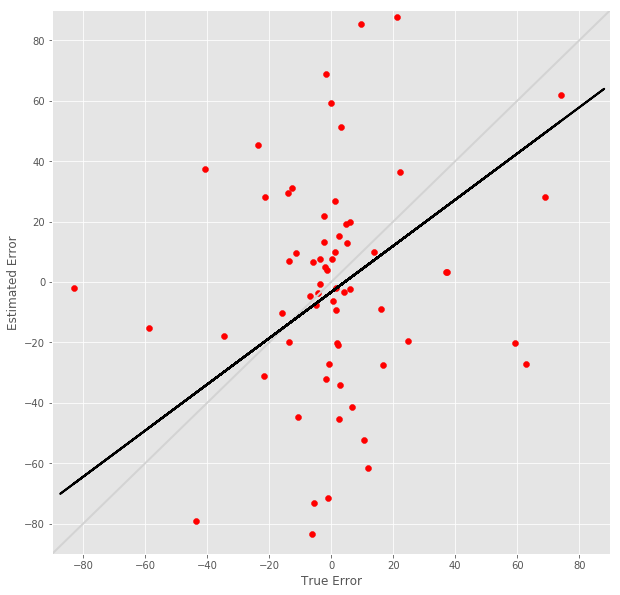

R^2 score for regression on RT: 0.0152
k = 0.1132


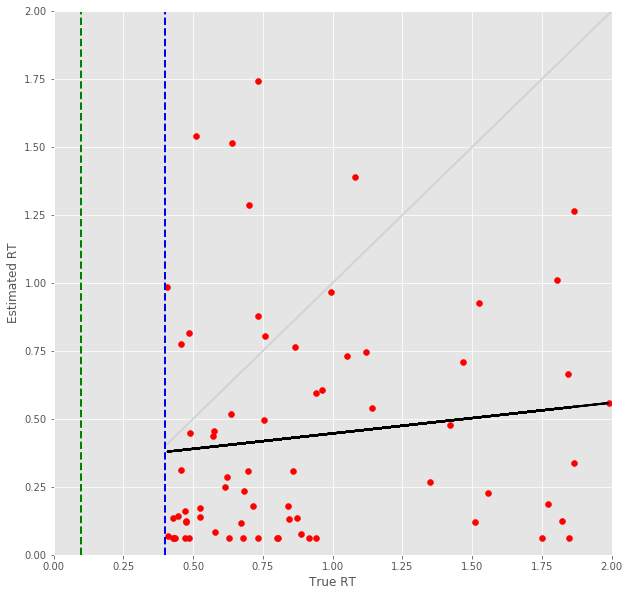

32 -step(s) forecast:
Test Score for 32 -steps forecast: 4.0673 RMSE
Predict Score for 32 -steps forecast: 3.4808 RMSE
Error Test Score for 32 -steps forecast: 0.5909 RMSE
RT Test Score for 32 -steps forecast: 0.6052 RMSE
Error Test Corr for 32 -steps forecast: 0.6603
RT Test Corr for 32 -steps forecast: 0.2361


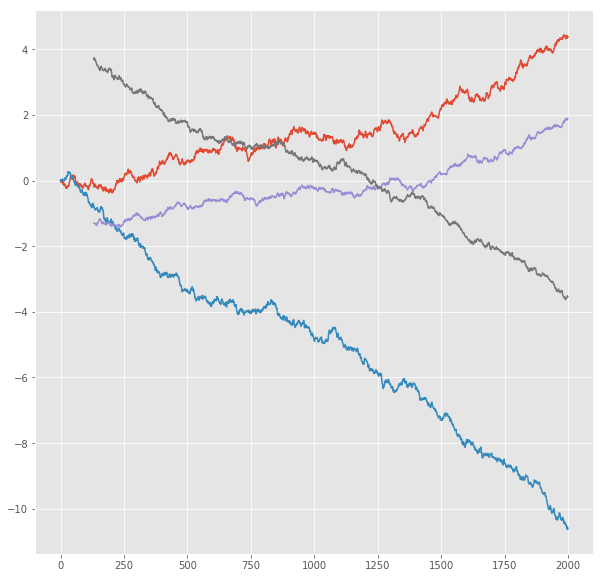

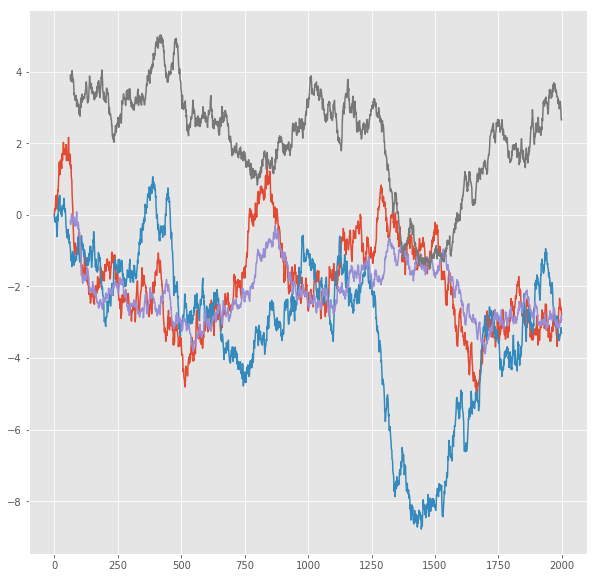

R^2 score for regression on Error: 0.4359
k = 0.9847


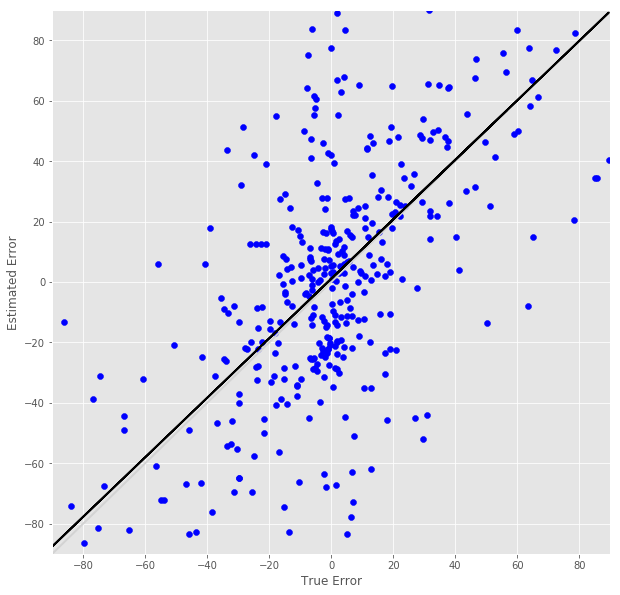

R^2 score for regression on RT: 0.0558
k = 0.3235


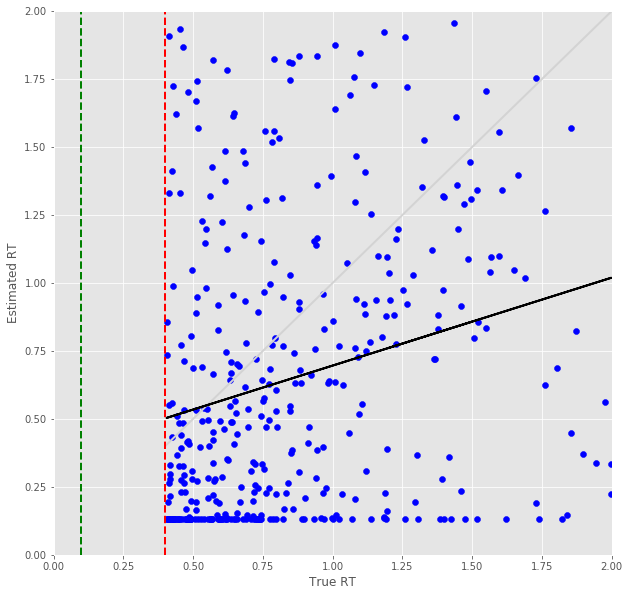

Error Prediction Score: 0.7818 RMSE
RT Prediction Score: 0.7562 RMSE
Error Prediction Corr: 0.5351
RT Prediction Corr: 0.0912
R^2 score for regression on Error: 0.2863
k = 0.9448


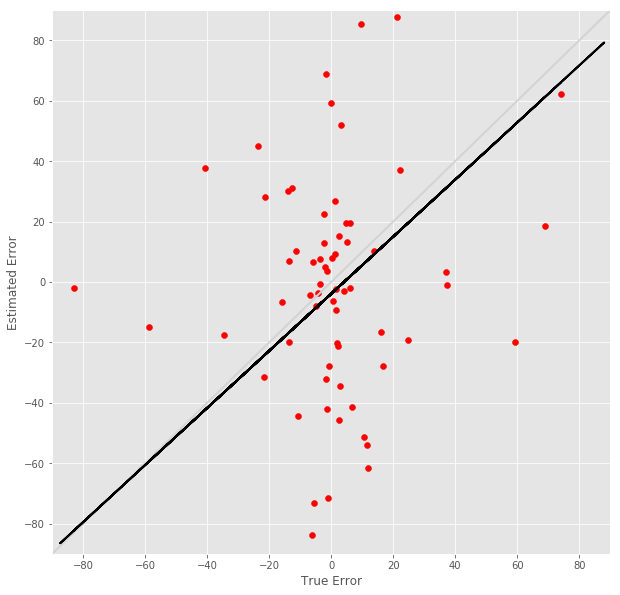

R^2 score for regression on RT: 0.0083
k = 0.0858


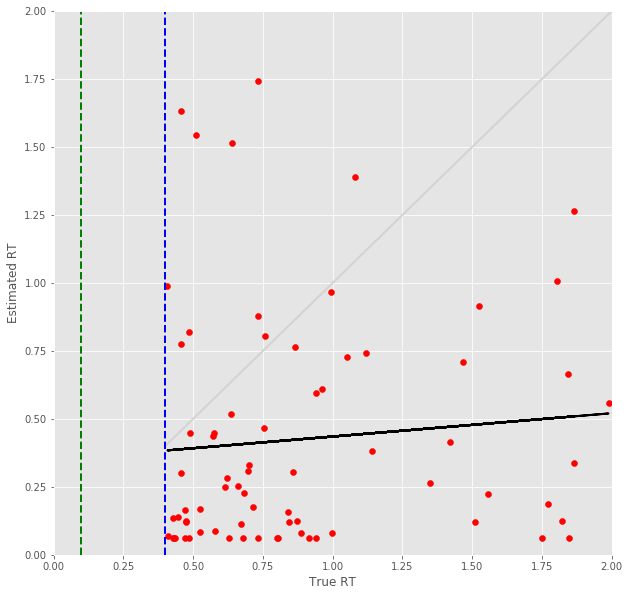

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

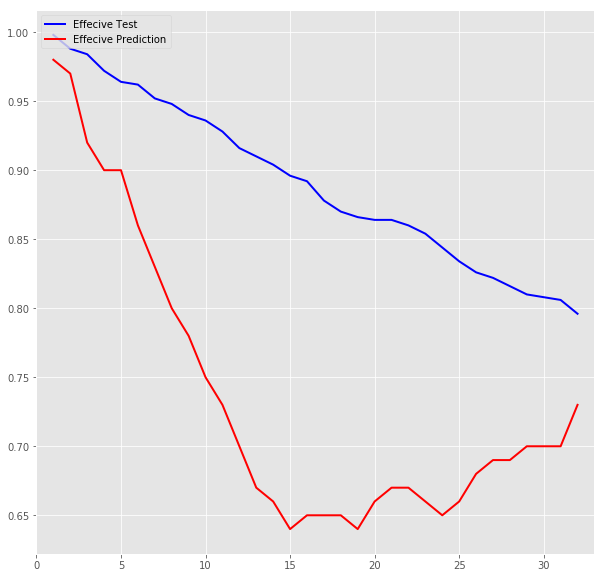

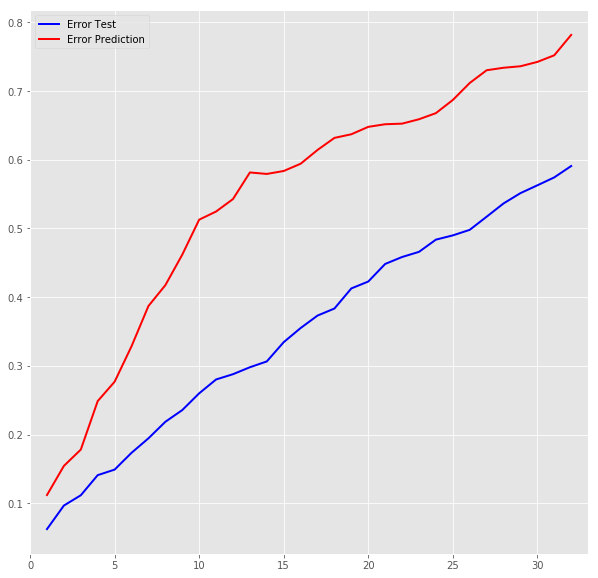

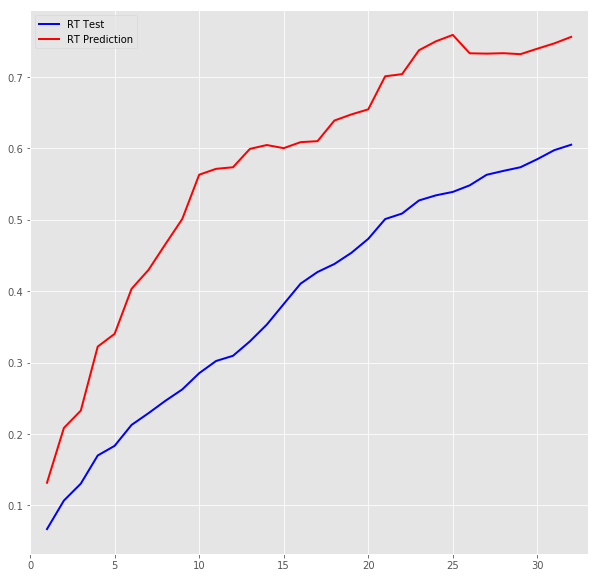

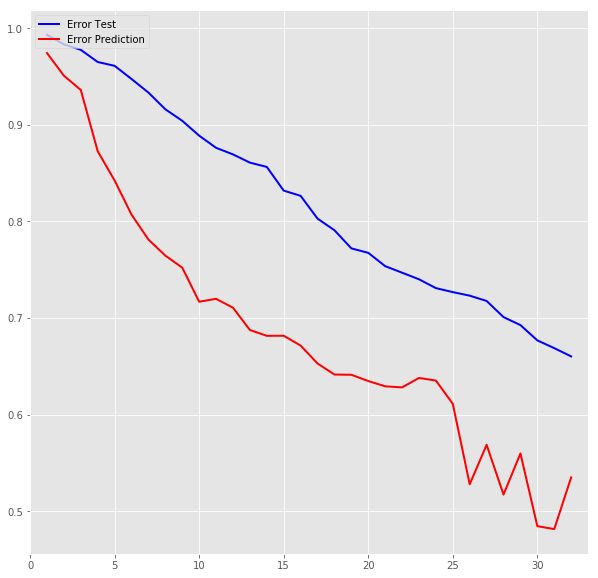

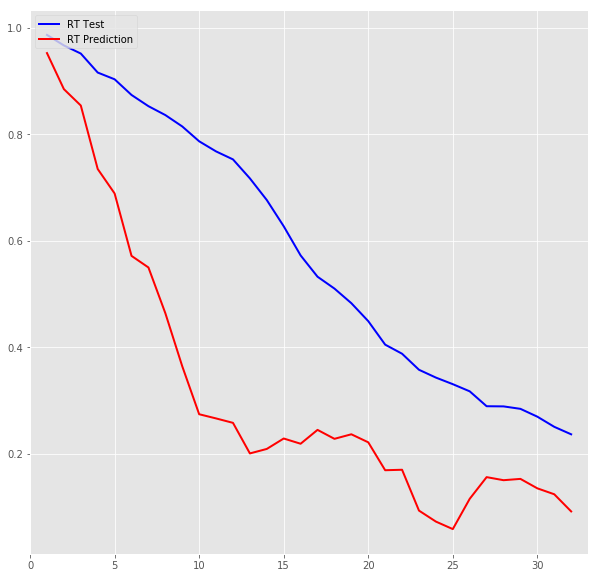

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
